In [1]:
#Import necessary modules and set display options
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
import plotly.graph_objects as go
import random
import sklearn.linear_model
from sklearn.model_selection import train_test_split
pd.options.display.max_columns=1000000
pd.options.display.max_rows=100

In [2]:
#Load in the proper file using exception handling
try: 
    
    df = pd.read_csv('prescriptions_data_5pct.csv', low_memory=False)
except:
    print('Warning: small dataset not found; processing entire dataset...')
    file = 'arcos_all_washpost.tsv'
    random.seed(42)

    p = 0.05  # set p to whatever percentage of lines necessary
    # keep the header, then take only p% of lines
    # if random from [0,1] interval is greater than 0.05 the row will be skipped
    df = pd.read_csv(file, sep = '\t', skiprows=lambda i: i>0 and random.random() > p, low_memory=False)
    df.to_csv('prescriptions_data_5pct.csv')

In [3]:
#Preliminary examinations of dataset
df.head()

,Unnamed: 0,REPORTER_DEA_NO,REPORTER_BUS_ACT,REPORTER_NAME,REPORTER_ADDL_CO_INFO,REPORTER_ADDRESS1,REPORTER_ADDRESS2,REPORTER_CITY,REPORTER_STATE,REPORTER_ZIP,REPORTER_COUNTY,BUYER_DEA_NO,BUYER_BUS_ACT,BUYER_NAME,BUYER_ADDL_CO_INFO,BUYER_ADDRESS1,BUYER_ADDRESS2,BUYER_CITY,BUYER_STATE,BUYER_ZIP,BUYER_COUNTY,TRANSACTION_CODE,DRUG_CODE,NDC_NO,DRUG_NAME,QUANTITY,UNIT,ACTION_INDICATOR,ORDER_FORM_NO,CORRECTION_NO,STRENGTH,TRANSACTION_DATE,CALC_BASE_WT_IN_GM,DOSAGE_UNIT,TRANSACTION_ID,Product_Name,Ingredient_Name,Measure,MME_Conversion_Factor,Combined_Labeler_Name,Revised_Company_Name,Reporter_family,dos_str
0,0,PA0021179,DISTRIBUTOR,APOTHECA INC,NaN,1622 N 16TH ST,NaN,PHOENIX,AZ,85006,MARICOPA,BA9740019,RETAIL PHARMACY,APOTHECARY SHOP DEER VALLEY,NaN,23620 N 20TH DR,#12,PHOENIX,AZ,85085,MARICOPA,S,9193,12634051400,HYDROCODONE,4.0,NaN,NaN,NaN,NaN,NaN,3112009,0.121080,40.0,52,HYDROCODONE BITARTRATE & ACETA 5MG/,HYDROCODONE BITARTRATE HEMIPENTAHYDRATE,TAB,1.0,Apotheca Inc.,Apotheca Inc.,Apotheca Inc,5.0
1,1,PA0021179,DISTRIBUTOR,APOTHECA INC,NaN,1622 N 16TH ST,NaN,PHOENIX,AZ,85006,MARICOPA,BJ5858002,PRACTITIONER,"JEFFERS, WILL VAHID DO",NOW CARE,8251 W UNION HILLS DR,SUITE 140,GLENDALE,AZ,85308,MARICOPA,S,9193,12634051485,HYDROCODONE,10.0,NaN,NaN,NaN,NaN,NaN,12052012,0.454050,150.0,5,HYDROCODONE BITARTRATE & ACETA 5MG/,HYDROCODONE BITARTRATE HEMIPENTAHYDRATE,TAB,1.0,Apotheca Inc.,Apotheca Inc.,Apotheca Inc,5.0
2,2,PA0021179,DISTRIBUTOR,APOTHECA INC,NaN,1622 N 16TH ST,NaN,PHOENIX,AZ,85006,MARICOPA,BN9327859,PRACTITIONER,"NUCATOLA, DEBORAH L",NaN,5400 RALSTON STREET,NaN,VENTURA,CA,93003,VENTURA,S,9193,12634051400,HYDROCODONE,20.0,NaN,NaN,NaN,NaN,NaN,2092007,0.605400,200.0,30,HYDROCODONE BITARTRATE & ACETA 5MG/,HYDROCODONE BITARTRATE HEMIPENTAHYDRATE,TAB,1.0,Apotheca Inc.,Apotheca Inc.,Apotheca Inc,5.0
3,3,PA0021179,DISTRIBUTOR,APOTHECA INC,NaN,1622 N 16TH ST,NaN,PHOENIX,AZ,85006,MARICOPA,FA1240592,RETAIL PHARMACY,AVELLA OF DEER VALLEY,NaN,23620 N 20TH DR #12,NaN,PHOENIX,AZ,85085,MARICOPA,S,9193,12634051496,HYDROCODONE,4.0,NaN,NaN,NaN,NaN,NaN,11052009,0.072648,24.0,24,HYDROCODONE BITARTRATE & ACETA 5MG/,HYDROCODONE BITARTRATE HEMIPENTAHYDRATE,TAB,1.0,Apotheca Inc.,Apotheca Inc.,Apotheca Inc,5.0
4,4,PB0020052,DISTRIBUTOR,"KPH HEALTHCARE SERVICES, INC.",KINNEY DRUGS WAREHOUSE,520 EAST MAIN ST.,NaN,GOUVERNEUR,NY,13642,SAINT LAWRENCE,AB0563709,CHAIN PHARMACY,"KPH HEALTHCARE SERVICES, INC.",KINNEY DRUGS #24,3873 ROME ROAD,NaN,PULASKI,NY,13142,OSWEGO,S,9193,00591034905,HYDROCODONE,3.0,NaN,NaN,NaN,NaN,0.0,7242009,4.540500,1500.0,1226,HYDROCODONE BIT 5MG/ACETAMINOPHEN 50,HYDROCODONE BITARTRATE HEMIPENTAHYDRATE,TAB,1.0,"Actavis Pharma, Inc.","Allergan, Inc.","KPH Healthcare Services, Inc.",5.0


In [4]:
df.shape

(8926234, 43)

In [5]:
#Cut the dataset down to the columns of interest
cols = ['BUYER_CITY','BUYER_COUNTY','BUYER_STATE','BUYER_ZIP',
        'DRUG_NAME','QUANTITY','TRANSACTION_DATE']
df = df.loc[:,cols]

In [6]:
df.head()

,BUYER_CITY,BUYER_COUNTY,BUYER_STATE,BUYER_ZIP,DRUG_NAME,QUANTITY,TRANSACTION_DATE
0,PHOENIX,MARICOPA,AZ,85085,HYDROCODONE,4.0,3112009
1,GLENDALE,MARICOPA,AZ,85308,HYDROCODONE,10.0,12052012
2,VENTURA,VENTURA,CA,93003,HYDROCODONE,20.0,2092007
3,PHOENIX,MARICOPA,AZ,85085,HYDROCODONE,4.0,11052009
4,PULASKI,OSWEGO,NY,13142,HYDROCODONE,3.0,7242009


In [7]:
df.describe(include='all')

,BUYER_CITY,BUYER_COUNTY,BUYER_STATE,BUYER_ZIP,DRUG_NAME,QUANTITY,TRANSACTION_DATE
count,8926234,8926123,8926234,8.926234e+06,8926234,8.926234e+06,8.926234e+06
unique,9664,1846,56,NaN,2,NaN,NaN
top,HOUSTON,JEFFERSON,CA,NaN,HYDROCODONE,NaN,NaN
freq,59768,139123,692973,NaN,5481386,NaN,NaN
mean,NaN,NaN,NaN,5.017600e+04,NaN,2.690621e+00,6.744450e+06
std,NaN,NaN,NaN,2.800437e+04,NaN,1.709781e+01,3.436746e+06
min,NaN,NaN,NaN,6.010000e+02,NaN,1.000000e+00,1.012006e+06
25%,NaN,NaN,NaN,2.900600e+04,NaN,1.000000e+00,4.042011e+06
50%,NaN,NaN,NaN,4.588500e+04,NaN,1.000000e+00,7.052007e+06
75%,NaN,NaN,NaN,7.546200e+04,NaN,3.000000e+00,1.003201e+07


In [8]:
#check outlier value for quantity
mx = df.loc[df.QUANTITY == df.QUANTITY.max()]
print(mx)

        BUYER_CITY BUYER_COUNTY BUYER_STATE  BUYER_ZIP  DRUG_NAME  QUANTITY  \
4917210       TROY        MIAMI          OH      45373  OXYCODONE   18990.0   

         TRANSACTION_DATE  
4917210           8162012  


In [9]:
df.dtypes

BUYER_CITY           object
BUYER_COUNTY         object
BUYER_STATE          object
BUYER_ZIP             int64
DRUG_NAME            object
QUANTITY            float64
TRANSACTION_DATE      int64
dtype: object

In [10]:
#zip code is type int, meaning leading zeroes are being dropped
#first convert to string
df['BUYER_ZIP'] = df['BUYER_ZIP'].astype(str)

In [11]:
#now zero-pad
for i, zip_code in enumerate(df['BUYER_ZIP']):
    if len(str(zip_code)) == 4:
        x = '0' + str(zip_code)
        #print(x)
        df['BUYER_ZIP'].values[i] = x
    elif len(str(zip_code)) == 3:
        x = '00' + str(zip_code)
        #print(x)
        df['BUYER_ZIP'].values[i] = x

In [12]:
#similar problem with transaction dates, although now we need it as a datetime object
df['TRANSACTION_DATE'] = df["TRANSACTION_DATE"].astype(int).astype(str)

In [13]:
for i, date in enumerate(df['TRANSACTION_DATE']):
    if len(date) == 7:
        df['TRANSACTION_DATE'].values[i] = '0' + date

In [14]:
#We want to convert datetime to a year column to make it easier to join with overdose data and do time analysis
df['date'] = pd.to_datetime(df['TRANSACTION_DATE'],format = '%m%d%Y')
df.head()
df['year'] = df['date'].dt.year

In [15]:
df_nan = df.loc[df.isnull().any(axis=1)]
df_nan

,BUYER_CITY,BUYER_COUNTY,BUYER_STATE,BUYER_ZIP,DRUG_NAME,QUANTITY,TRANSACTION_DATE,date,year
68811,FAIRFIELD,NaN,CT,06430,OXYCODONE,1.0,05112006,2006-05-11,2006
246314,NORTH LAS VEGAS,NaN,NV,89303,OXYCODONE,4.0,08112006,2006-08-11,2006
275896,NORTH LAS VEGAS,NaN,NV,89303,HYDROCODONE,10.0,10052007,2007-10-05,2007
405948,NORTH LAS VEGAS,NaN,NV,89303,HYDROCODONE,1.0,06212007,2007-06-21,2007
405949,NORTH LAS VEGAS,NaN,NV,89303,HYDROCODONE,7.0,07122007,2007-07-12,2007
...,...,...,...,...,...,...,...,...,...
8740952,CAIRO,NaN,GA,31728,HYDROCODONE,1.0,03062006,2006-03-06,2006
8747128,ARLINGTON,NaN,MA,02174,OXYCODONE,1.0,08042006,2006-08-04,2006
8749404,FAIRFIELD,NaN,CT,06430,OXYCODONE,4.0,07102006,2006-07-10,2006
8836372,ORANGE,NaN,CA,92669,HYDROCODONE,1.0,01212006,2006-01-21,2006


In [16]:
# number of rows with no county value is statistically insignificant, so we can just drop them
df = df.dropna()

In [17]:
quan_sum = df.groupby(['BUYER_COUNTY', 'BUYER_STATE', 'year'], 
                      as_index = False)['QUANTITY'].sum()

In [18]:
quan_sum.head()

,BUYER_COUNTY,BUYER_STATE,year,QUANTITY
0,ABBEVILLE,SC,2006,87.0
1,ABBEVILLE,SC,2007,106.0
2,ABBEVILLE,SC,2008,135.0
3,ABBEVILLE,SC,2009,131.0
4,ABBEVILLE,SC,2010,190.0


In [19]:
quan_sum.describe(include='all')

,BUYER_COUNTY,BUYER_STATE,year,QUANTITY
count,21435,21435,21435.000000,21435.000000
unique,1846,56,NaN,NaN
top,WASHINGTON,TX,NaN,NaN
freq,213,1562,NaN,NaN
mean,NaN,NaN,2009.001866,1120.446419
std,NaN,NaN,2.000419,3319.182946
min,NaN,NaN,2006.000000,1.000000
25%,NaN,NaN,2007.000000,82.000000
50%,NaN,NaN,2009.000000,284.000000
75%,NaN,NaN,2011.000000,865.000000


In [20]:
od_df = pd.read_csv('county_od.csv')
od_df.head()

,Unnamed: 0,State,County,Year,Deaths,Population
0,0,Alabama,AUTAUGA,2006,NaN,41447
1,1,Alabama,AUTAUGA,2007,NaN,42221
2,2,Alabama,AUTAUGA,2008,NaN,42820
3,3,Alabama,AUTAUGA,2009,NaN,43419
4,4,Alabama,AUTAUGA,2010,NaN,43811


In [21]:
od_df.describe(include='all')

,Unnamed: 0,State,County,Year,Deaths,Population
count,22029.000000,22029,22029,22029.000000,5183,22029
unique,NaN,51,1882,NaN,283,20240
top,NaN,Texas,WASHINGTON,NaN,10,Missing
freq,NaN,1778,210,NaN,374,42
mean,11014.000000,NaN,NaN,2009.000000,NaN,NaN
std,6359.368876,NaN,NaN,2.000045,NaN,NaN
min,0.000000,NaN,NaN,2006.000000,NaN,NaN
25%,5507.000000,NaN,NaN,2007.000000,NaN,NaN
50%,11014.000000,NaN,NaN,2009.000000,NaN,NaN
75%,16521.000000,NaN,NaN,2011.000000,NaN,NaN


In [22]:
#create state dictionary
state_dict = { 'AK': 'Alaska',
        'AL': 'Alabama',
        'AR': 'Arkansas',
        'AS': 'American Samoa',
        'AZ': 'Arizona',
        'CA': 'California',
        'CO': 'Colorado',
        'CT': 'Connecticut',
        'DC': 'District of Columbia',
        'DE': 'Delaware',
        'FL': 'Florida',
        'GA': 'Georgia',
        'GU': 'Guam',
        'HI': 'Hawaii',
        'IA': 'Iowa',
        'ID': 'Idaho',
        'IL': 'Illinois',
        'IN': 'Indiana',
        'KS': 'Kansas',
        'KY': 'Kentucky',
        'LA': 'Louisiana',
        'MA': 'Massachusetts',
        'MD': 'Maryland',
        'ME': 'Maine',
        'MI': 'Michigan',
        'MN': 'Minnesota',
        'MO': 'Missouri',
        'MP': 'Northern Mariana Islands',
        'MS': 'Mississippi',
        'MT': 'Montana',
        'NA': 'National',
        'NC': 'North Carolina',
        'ND': 'North Dakota',
        'NE': 'Nebraska',
        'NH': 'New Hampshire',
        'NJ': 'New Jersey',
        'NM': 'New Mexico',
        'NV': 'Nevada',
        'NY': 'New York',
        'OH': 'Ohio',
        'OK': 'Oklahoma',
        'OR': 'Oregon',
        'PA': 'Pennsylvania',
        'PR': 'Puerto Rico',
        'RI': 'Rhode Island',
        'SC': 'South Carolina',
        'SD': 'South Dakota',
        'TN': 'Tennessee',
        'TX': 'Texas',
        'UT': 'Utah',
        'VA': 'Virginia',
        'VI': 'Virgin Islands',
        'VT': 'Vermont',
        'WA': 'Washington',
        'WI': 'Wisconsin',
        'WV': 'West Virginia',
        'WY': 'Wyoming'}

In [23]:
#use .map() to change state abbreviations to full names
quan_sum.BUYER_STATE = quan_sum.BUYER_STATE.map(state_dict)

In [24]:
# rename BUYER_STATE column
quan_sum.rename(columns = 
                {'BUYER_STATE': 'state', 'BUYER_COUNTY' : 'county'}, 
                inplace=True)

In [25]:
# rename state and year columns in od_df
od_df.rename(columns = 
             {'State' : 'state', 
              'Year' : 'year', 
              'Population' : 'pop', 
              'Deaths' : 'deaths', 
              'County' : 'county'}, 
             inplace=True)

In [26]:
quan_sum.head()

,county,state,year,QUANTITY
0,ABBEVILLE,South Carolina,2006,87.0
1,ABBEVILLE,South Carolina,2007,106.0
2,ABBEVILLE,South Carolina,2008,135.0
3,ABBEVILLE,South Carolina,2009,131.0
4,ABBEVILLE,South Carolina,2010,190.0


In [27]:
od_df.head()

,Unnamed: 0,state,county,year,deaths,pop
0,0,Alabama,AUTAUGA,2006,NaN,41447
1,1,Alabama,AUTAUGA,2007,NaN,42221
2,2,Alabama,AUTAUGA,2008,NaN,42820
3,3,Alabama,AUTAUGA,2009,NaN,43419
4,4,Alabama,AUTAUGA,2010,NaN,43811


In [28]:
# normalize strings in county columns
#.strip, .str
#no arguments for .strip removes leading and trailing white space
quan_sum.county = quan_sum.county.str.lower().str.strip()
quan_sum.county = quan_sum.county.str.upper()
quan_sum.head()

,county,state,year,QUANTITY
0,ABBEVILLE,South Carolina,2006,87.0
1,ABBEVILLE,South Carolina,2007,106.0
2,ABBEVILLE,South Carolina,2008,135.0
3,ABBEVILLE,South Carolina,2009,131.0
4,ABBEVILLE,South Carolina,2010,190.0


In [29]:
#repeat for overdose table
od_df.county = od_df.county.str.lower().str.strip()
od_df.county = od_df.county.str.upper()
od_df.head()

,Unnamed: 0,state,county,year,deaths,pop
0,0,Alabama,AUTAUGA,2006,NaN,41447
1,1,Alabama,AUTAUGA,2007,NaN,42221
2,2,Alabama,AUTAUGA,2008,NaN,42820
3,3,Alabama,AUTAUGA,2009,NaN,43419
4,4,Alabama,AUTAUGA,2010,NaN,43811


In [30]:
od_df.drop(['Unnamed: 0'], axis=1, inplace=True)

In [31]:
quan_sum.dtypes

county       object
state        object
year          int64
QUANTITY    float64
dtype: object

In [32]:
od_df.dtypes

state     object
county    object
year       int64
deaths    object
pop       object
dtype: object

In [33]:
quan_sum.county = quan_sum.county.astype(str)
quan_sum.state = quan_sum.state.astype(str)

In [34]:
od_df.county = od_df.county.astype(str)
od_df.state = od_df.state.astype(str)

In [35]:
quan_sum.shape

(21435, 4)

In [36]:
od_df.shape

(22029, 5)

In [37]:
merge_df = od_df.merge(quan_sum, how='inner', 
                       on = ['county', 'state', 'year'])

In [38]:
merge_df.head(20)

,state,county,year,deaths,pop,QUANTITY
0,Alabama,AUTAUGA,2006,NaN,41447,596.0
1,Alabama,AUTAUGA,2007,NaN,42221,619.0
2,Alabama,AUTAUGA,2008,NaN,42820,755.0
3,Alabama,AUTAUGA,2009,NaN,43419,1744.0
4,Alabama,AUTAUGA,2010,NaN,43811,881.0
5,Alabama,AUTAUGA,2011,NaN,43940,1100.0
6,Alabama,AUTAUGA,2012,NaN,44121,1315.0
7,Alabama,BALDWIN,2006,21,149116,1911.0
8,Alabama,BALDWIN,2007,28,152939,2374.0
9,Alabama,BALDWIN,2008,27,155913,2377.0


In [39]:
merge_df.dtypes

state        object
county       object
year          int64
deaths       object
pop          object
QUANTITY    float64
dtype: object

In [40]:
for i, pop in enumerate(merge_df['pop']):
    merge_df['pop'].values[i] = float(pop)

In [41]:
merge_df.shape

(19884, 6)

In [42]:
#save/load this merge_df with exception handling
try: 
    
    merge_df = pd.read_csv('merge_df_5pct.csv', low_memory=False)
except:
    print('Warning: merged dataset not found; creating merged dataset file...')
    
    merge_df.to_csv('merge_df_5pct.csv')

In [43]:
#merge with demo data
demo_df = pd.read_csv('demo_data_pivot.csv')
demo_df.head()

,Unnamed: 0,state,county,asian_female,asian_female.1,asian_female.2,asian_female.3,asian_female.4,asian_female.5,asian_female.6,asian_female.7,asian_female.8,asian_female.9,asian_female.10,asian_female.11,asian_female.12,asian_female.13,asian_female.14,asian_female.15,asian_female.16,asian_female.17,asian_female.18,asian_male,asian_male.1,asian_male.2,asian_male.3,asian_male.4,asian_male.5,asian_male.6,asian_male.7,asian_male.8,asian_male.9,asian_male.10,asian_male.11,asian_male.12,asian_male.13,asian_male.14,asian_male.15,asian_male.16,asian_male.17,asian_male.18,black_female,black_female.1,black_female.2,black_female.3,black_female.4,black_female.5,black_female.6,black_female.7,black_female.8,black_female.9,black_female.10,black_female.11,black_female.12,black_female.13,black_female.14,black_female.15,black_female.16,black_female.17,black_female.18,black_male,black_male.1,black_male.2,black_male.3,black_male.4,black_male.5,black_male.6,black_male.7,black_male.8,black_male.9,black_male.10,black_male.11,black_male.12,black_male.13,black_male.14,black_male.15,black_male.16,black_male.17,black_male.18,islander_female,islander_female.1,islander_female.2,islander_female.3,islander_female.4,islander_female.5,islander_female.6,islander_female.7,islander_female.8,islander_female.9,islander_female.10,islander_female.11,islander_female.12,islander_female.13,islander_female.14,islander_female.15,islander_female.16,islander_female.17,islander_female.18,islander_male,islander_male.1,islander_male.2,islander_male.3,islander_male.4,islander_male.5,islander_male.6,islander_male.7,islander_male.8,islander_male.9,islander_male.10,islander_male.11,islander_male.12,islander_male.13,islander_male.14,islander_male.15,islander_male.16,islander_male.17,islander_male.18,native_female,native_female.1,native_female.2,native_female.3,native_female.4,native_female.5,native_female.6,native_female.7,native_female.8,native_female.9,native_female.10,native_female.11,native_female.12,native_female.13,native_female.14,native_female.15,native_female.16,native_female.17,native_female.18,native_male,native_male.1,native_male.2,native_male.3,native_male.4,native_male.5,native_male.6,native_male.7,native_male.8,native_male.9,native_male.10,native_male.11,native_male.12,native_male.13,native_male.14,native_male.15,native_male.16,native_male.17,native_male.18,total,total.1,total.2,total.3,total.4,total.5,total.6,total.7,total.8,total.9,total.10,total.11,total.12,total.13,total.14,total.15,total.16,total.17,total.18,total_female,total_female.1,total_female.2,total_female.3,total_female.4,total_female.5,total_female.6,total_female.7,total_female.8,total_female.9,total_female.10,total_female.11,total_female.12,total_female.13,total_female.14,total_female.15,total_female.16,total_female.17,total_female.18,total_male,total_male.1,total_male.2,total_male.3,total_male.4,total_male.5,total_male.6,total_male.7,total_male.8,total_male.9,total_male.10,total_male.11,total_male.12,total_male.13,total_male.14,total_male.15,total_male.16,total_male.17,total_male.18,white_female,white_female.1,white_female.2,white_female.3,white_female.4,white_female.5,white_female.6,white_female.7,white_female.8,white_female.9,white_female.10,white_female.11,white_female.12,white_female.13,white_female.14,white_female.15,white_female.16,white_female.17,white_female.18,white_male,white_male.1,white_male.2,white_male.3,white_male.4,white_male.5,white_male.6,white_male.7,white_male.8,white_male.9,white_male.10,white_male.11,white_male.12,white_male.13,white_male.14,white_male.15,white_male.16,white_male.17,white_male.18
0,age_group,NaN,NaN,0-4,10-14,15-19,20-24,25-29,30-34,35-39,40-44,45-49,5-9,50-54,55-59,60-64,65-69,70-74,75-79,80-84,85+,Total Pop,0-4,10-14,15-19,20-24,25-29,30-34,35-39,40-44,45-49,5-9,50-54,55-59,60-64,65-69,70-74,75-79,80-84,85+,Total Pop,0-4,10-14,15-19,20-24,25-29,30-34,35-39,40-44,45-49,5-9,50-54,55-59,60-64,65-69,70-74,75-79,80-84,85+,Total Pop,0-4,10-14,15-19,20-24,25-29,30-3

In [44]:
demo_df.shape

(3143, 250)

In [45]:
df = merge_df.merge(demo_df, how='inner', on = ['state', 'county'])
df.head()

,Unnamed: 0_x,state,county,year,deaths,pop,QUANTITY,Unnamed: 0_y,asian_female,asian_female.1,asian_female.2,asian_female.3,asian_female.4,asian_female.5,asian_female.6,asian_female.7,asian_female.8,asian_female.9,asian_female.10,asian_female.11,asian_female.12,asian_female.13,asian_female.14,asian_female.15,asian_female.16,asian_female.17,asian_female.18,asian_male,asian_male.1,asian_male.2,asian_male.3,asian_male.4,asian_male.5,asian_male.6,asian_male.7,asian_male.8,asian_male.9,asian_male.10,asian_male.11,asian_male.12,asian_male.13,asian_male.14,asian_male.15,asian_male.16,asian_male.17,asian_male.18,black_female,black_female.1,black_female.2,black_female.3,black_female.4,black_female.5,black_female.6,black_female.7,black_female.8,black_female.9,black_female.10,black_female.11,black_female.12,black_female.13,black_female.14,black_female.15,black_female.16,black_female.17,black_female.18,black_male,black_male.1,black_male.2,black_male.3,black_male.4,black_male.5,black_male.6,black_male.7,black_male.8,black_male.9,black_male.10,black_male.11,black_male.12,black_male.13,black_male.14,black_male.15,black_male.16,black_male.17,black_male.18,islander_female,islander_female.1,islander_female.2,islander_female.3,islander_female.4,islander_female.5,islander_female.6,islander_female.7,islander_female.8,islander_female.9,islander_female.10,islander_female.11,islander_female.12,islander_female.13,islander_female.14,islander_female.15,islander_female.16,islander_female.17,islander_female.18,islander_male,islander_male.1,islander_male.2,islander_male.3,islander_male.4,islander_male.5,islander_male.6,islander_male.7,islander_male.8,islander_male.9,islander_male.10,islander_male.11,islander_male.12,islander_male.13,islander_male.14,islander_male.15,islander_male.16,islander_male.17,islander_male.18,native_female,native_female.1,native_female.2,native_female.3,native_female.4,native_female.5,native_female.6,native_female.7,native_female.8,native_female.9,native_female.10,native_female.11,native_female.12,native_female.13,native_female.14,native_female.15,native_female.16,native_female.17,native_female.18,native_male,native_male.1,native_male.2,native_male.3,native_male.4,native_male.5,native_male.6,native_male.7,native_male.8,native_male.9,native_male.10,native_male.11,native_male.12,native_male.13,native_male.14,native_male.15,native_male.16,native_male.17,native_male.18,total,total.1,total.2,total.3,total.4,total.5,total.6,total.7,total.8,total.9,total.10,total.11,total.12,total.13,total.14,total.15,total.16,total.17,total.18,total_female,total_female.1,total_female.2,total_female.3,total_female.4,total_female.5,total_female.6,total_female.7,total_female.8,total_female.9,total_female.10,total_female.11,total_female.12,total_female.13,total_female.14,total_female.15,total_female.16,total_female.17,total_female.18,total_male,total_male.1,total_male.2,total_male.3,total_male.4,total_male.5,total_male.6,total_male.7,total_male.8,total_male.9,total_male.10,total_male.11,total_male.12,total_male.13,total_male.14,total_male.15,total_male.16,total_male.17,total_male.18,white_female,white_female.1,white_female.2,white_female.3,white_female.4,white_female.5,white_female.6,white_female.7,white_female.8,white_female.9,white_female.10,white_female.11,white_female.12,white_female.13,white_female.14,white_female.15,white_female.16,white_female.17,white_female.18,white_male,white_male.1,white_male.2,white_male.3,white_male.4,white_male.5,white_male.6,white_male.7,white_male.8,white_male.9,white_male.10,white_male.11,white_male.12,white_male.13,white_male.14,white_male.15,white_male.16,white_male.17,white_male.18
0,0,Alabama,AUTAUGA,2006,NaN,41447.0,596.0,0,0.004191114836546521,0.004195804195804196,0.0032634032634032634,0.0022727272727272726,0.007285397529299968,0.0075075075075075074,0.007216742843396681,0.00881057268722467,0.006232686980609419,0.005261839138060637,0.004389362251484637,0.0029192345118391177,0.004681310767014764,0.003952569169960474,0.0046

In [46]:
df.shape

(17508, 255)

In [47]:
#drop unnamed columns and rename columns
df.drop(['Unnamed: 0_x', 'Unnamed: 0_y'], axis=1, inplace=True)
df.head(10)

,state,county,year,deaths,pop,QUANTITY,asian_female,asian_female.1,asian_female.2,asian_female.3,asian_female.4,asian_female.5,asian_female.6,asian_female.7,asian_female.8,asian_female.9,asian_female.10,asian_female.11,asian_female.12,asian_female.13,asian_female.14,asian_female.15,asian_female.16,asian_female.17,asian_female.18,asian_male,asian_male.1,asian_male.2,asian_male.3,asian_male.4,asian_male.5,asian_male.6,asian_male.7,asian_male.8,asian_male.9,asian_male.10,asian_male.11,asian_male.12,asian_male.13,asian_male.14,asian_male.15,asian_male.16,asian_male.17,asian_male.18,black_female,black_female.1,black_female.2,black_female.3,black_female.4,black_female.5,black_female.6,black_female.7,black_female.8,black_female.9,black_female.10,black_female.11,black_female.12,black_female.13,black_female.14,black_female.15,black_female.16,black_female.17,black_female.18,black_male,black_male.1,black_male.2,black_male.3,black_male.4,black_male.5,black_male.6,black_male.7,black_male.8,black_male.9,black_male.10,black_male.11,black_male.12,black_male.13,black_male.14,black_male.15,black_male.16,black_male.17,black_male.18,islander_female,islander_female.1,islander_female.2,islander_female.3,islander_female.4,islander_female.5,islander_female.6,islander_female.7,islander_female.8,islander_female.9,islander_female.10,islander_female.11,islander_female.12,islander_female.13,islander_female.14,islander_female.15,islander_female.16,islander_female.17,islander_female.18,islander_male,islander_male.1,islander_male.2,islander_male.3,islander_male.4,islander_male.5,islander_male.6,islander_male.7,islander_male.8,islander_male.9,islander_male.10,islander_male.11,islander_male.12,islander_male.13,islander_male.14,islander_male.15,islander_male.16,islander_male.17,islander_male.18,native_female,native_female.1,native_female.2,native_female.3,native_female.4,native_female.5,native_female.6,native_female.7,native_female.8,native_female.9,native_female.10,native_female.11,native_female.12,native_female.13,native_female.14,native_female.15,native_female.16,native_female.17,native_female.18,native_male,native_male.1,native_male.2,native_male.3,native_male.4,native_male.5,native_male.6,native_male.7,native_male.8,native_male.9,native_male.10,native_male.11,native_male.12,native_male.13,native_male.14,native_male.15,native_male.16,native_male.17,native_male.18,total,total.1,total.2,total.3,total.4,total.5,total.6,total.7,total.8,total.9,total.10,total.11,total.12,total.13,total.14,total.15,total.16,total.17,total.18,total_female,total_female.1,total_female.2,total_female.3,total_female.4,total_female.5,total_female.6,total_female.7,total_female.8,total_female.9,total_female.10,total_female.11,total_female.12,total_female.13,total_female.14,total_female.15,total_female.16,total_female.17,total_female.18,total_male,total_male.1,total_male.2,total_male.3,total_male.4,total_male.5,total_male.6,total_male.7,total_male.8,total_male.9,total_male.10,total_male.11,total_male.12,total_male.13,total_male.14,total_male.15,total_male.16,total_male.17,total_male.18,white_female,white_female.1,white_female.2,white_female.3,white_female.4,white_female.5,white_female.6,white_female.7,white_female.8,white_female.9,white_female.10,white_female.11,white_female.12,white_female.13,white_female.14,white_female.15,white_female.16,white_female.17,white_female.18,white_male,white_male.1,white_male.2,white_male.3,white_male.4,white_male.5,white_male.6,white_male.7,white_male.8,white_male.9,white_male.10,white_male.11,white_male.12,white_male.13,white_male.14,white_male.15,white_male.16,white_male.17,white_male.18
0,Alabama,AUTAUGA,2006,NaN,41447.0,596.0,0.004191114836546521,0.004195804195804196,0.0032634032634032634,0.0022727272727272726,0.007285397529299968,0.0075075075075075074,0.007216742843396681,0.00881057268722467,0.006232686980609419,0.005261839138060637,0.004389362251484637,0.0029192345118391177,0.004681310767014764,0.003952569169960474,0.004608294930875576,0.0055955235811

In [48]:
#create dictionary for mapping columns to more descriptive names
demo_dict = { 'asian_female' : 'asian_female_0_4', 'asian_female.1' : 'asian_female_10_14', 'asian_female.2' : 'asian_female_15_19',
           'asian_female.3' : 'asian_female_20_24', 'asian_female.4' : 'asian_female_25_29', 'asian_female.5' : 'asian_female_30_34',
           'asian_female.6' : 'asian_female_35_39', 'asian_female.7' : 'asian_female_40_44', 'asian_female.8' : 'asian_female_45_49',
           'asian_female.9' : 'asian_female_5_9', 'asian_female.10' : 'asian_female_50_54', 'asian_female.11' : 'asian_female_55_59',
           'asian_female.12' : 'asian_female_60_64', 'asian_female.13' : 'asian_female_65_69', 'asian_female.14' : 'asian_female_70_74',
           'asian_female.15' : 'asian_female_75_79', 'asian_female.16' : 'asian_female_80_84', 'asian_female.17' : 'asian_female_85+', 
           'asian_female.18' : 'asian_female_total',
           'asian_male' : 'asian_male_0_4', 'asian_male.1' : 'asian_male_10_14', 'asian_male.2' : 'asian_male_15_19',
           'asian_male.3' : 'asian_male_20_24', 'asian_male.4' : 'asian_male_25_29', 'asian_male.5' : 'asian_male_30_34',
           'asian_male.6' : 'asian_male_35_39', 'asian_male.7' : 'asian_male_40_44', 'asian_male.8' : 'asian_male_45_49',
           'asian_male.9' : 'asian_male_5_9', 'asian_male.10' : 'asian_male_50_54', 'asian_male.11' : 'asian_male_55_59',
           'asian_male.12' : 'asian_male_60_64', 'asian_male.13' : 'asian_male_65_69', 'asian_male.14' : 'asian_male_70_74',
           'asian_male.15' : 'asian_male_75_79', 'asian_male.16' : 'asian_male_80_84', 'asian_male.17' : 'asian_male_85+', 
           'asian_male.18' : 'asian_male_total',
           'black_female' : 'black_female_0_4', 'black_female.1' : 'black_female_10_14', 'black_female.2' : 'black_female_15_19',
           'black_female.3' : 'black_female_20_24', 'black_female.4' : 'black_female_25_29', 'black_female.5' : 'black_female_30_34',
           'black_female.6' : 'black_female_35_39', 'black_female.7' : 'black_female_40_44', 'black_female.8' : 'black_female_45_49',
           'black_female.9' : 'black_female_5_9', 'black_female.10' : 'black_female_50_54', 'black_female.11' : 'black_female_55_59',
           'black_female.12' : 'black_female_60_64', 'black_female.13' : 'black_female_65_69', 'black_female.14' : 'black_female_70_74',
           'black_female.15' : 'black_female_75_79', 'black_female.16' : 'black_female_80_84', 'black_female.17' : 'black_female_85+', 
           'black_female.18' : 'black_female_total',
           'black_male' : 'black_male_0_4', 'black_male.1' : 'black_male_10_14', 'black_male.2' : 'black_male_15_19',
           'black_male.3' : 'black_male_20_24', 'black_male.4' : 'black_male_25_29', 'black_male.5' : 'black_male_30_34',
           'black_male.6' : 'black_male_35_39', 'black_male.7' : 'black_male_40_44', 'black_male.8' : 'black_male_45_49',
           'black_male.9' : 'black_male_5_9', 'black_male.10' : 'black_male_50_54', 'black_male.11' : 'black_male_55_59',
           'black_male.12' : 'black_male_60_64', 'black_male.13' : 'black_male_65_69', 'black_male.14' : 'black_male_70_74',
           'black_male.15' : 'black_male_75_79', 'black_male.16' : 'black_male_80_84', 'black_male.17' : 'black_male_85+', 
           'black_male.18' : 'black_male_total',
           'islander_female' : 'islander_female_0_4', 'islander_female.1' : 'islander_female_10_14', 'islander_female.2' : 'islander_female_15_19',
           'islander_female.3' : 'islander_female_20_24', 'islander_female.4' : 'islander_female_25_29', 'islander_female.5' : 'islander_female_30_34',
           'islander_female.6' : 'islander_female_35_39', 'islander_female.7' : 'islander_female_40_44', 'islander_female.8' : 'islander_female_45_49',
           'islander_female.9' : 'islander_female_5_9', 'islander_female.10' : 'islander_female_50_54', 'islander_female.11' : 'islander_female_55_59',
           'islander_female.12' : 'islander_female_60_64', 'islander_female.13' : 'islander_female_65_69', 'islander_female.14' : 'islander_female_70_74',
           'islander_female.15' : 'islander_female_75_79', 'islander_female.16' : 'islander_female_80_84', 'islander_female.17' : 'islander_female_85+', 
           'islander_female.18' : 'islander_female_total',
             'islander_male' : 'islander_male_0_4', 'islander_male.1' : 'islander_male_10_14', 'islander_male.2' : 'islander_male_15_19',
           'islander_male.3' : 'islander_male_20_24', 'islander_male.4' : 'islander_male_25_29', 'islander_male.5' : 'islander_male_30_34',
           'islander_male.6' : 'islander_male_35_39', 'islander_male.7' : 'islander_male_40_44', 'islander_male.8' : 'islander_male_45_49',
           'islander_male.9' : 'islander_male_5_9', 'islander_male.10' : 'islander_male_50_54', 'islander_male.11' : 'islander_male_55_59',
           'islander_male.12' : 'islander_male_60_64', 'islander_male.13' : 'islander_male_65_69', 'islander_male.14' : 'islander_male_70_74',
           'islander_male.15' : 'islander_male_75_79', 'islander_male.16' : 'islander_male_80_84', 'islander_male.17' : 'islander_male_85+', 
           'islander_male.18' : 'islander_male_total',
            'native_female' : 'native_female_0_4', 'native_female.1' : 'native_female_10_14', 'native_female.2' : 'native_female_15_19',
           'native_female.3' : 'native_female_20_24', 'native_female.4' : 'native_female_25_29', 'native_female.5' : 'native_female_30_34',
           'native_female.6' : 'native_female_35_39', 'native_female.7' : 'native_female_40_44', 'native_female.8' : 'native_female_45_49',
           'native_female.9' : 'native_female_5_9', 'native_female.10' : 'native_female_50_54', 'native_female.11' : 'native_female_55_59',
           'native_female.12' : 'native_female_60_64', 'native_female.13' : 'native_female_65_69', 'native_female.14' : 'native_female_70_74',
           'native_female.15' : 'native_female_75_79', 'native_female.16' : 'native_female_80_84', 'native_female.17' : 'native_female_85+', 
           'native_female.18' : 'native_female_total',
            'native_male' : 'native_male_0_4', 'native_male.1' : 'native_male_10_14', 'native_male.2' : 'native_male_15_19',
           'native_male.3' : 'native_male_20_24', 'native_male.4' : 'native_male_25_29', 'native_male.5' : 'native_male_30_34',
           'native_male.6' : 'native_male_35_39', 'native_male.7' : 'native_male_40_44', 'native_male.8' : 'native_male_45_49',
           'native_male.9' : 'native_male_5_9', 'native_male.10' : 'native_male_50_54', 'native_male.11' : 'native_male_55_59',
           'native_male.12' : 'native_male_60_64', 'native_male.13' : 'native_male_65_69', 'native_male.14' : 'native_male_70_74',
           'native_male.15' : 'native_male_75_79', 'native_male.16' : 'native_male_80_84', 'native_male.17' : 'native_male_85+', 
           'native_male.18' : 'native_male_total',
            'total' : 'total_0_4', 'total.1' : 'total_10_14', 'total.2' : 'total_15_19',
           'total.3' : 'total_20_24', 'total.4' : 'total_25_29', 'total.5' : 'total_30_34',
           'total.6' : 'total_35_39', 'total.7' : 'total_40_44', 'total.8' : 'total_45_49',
           'total.9' : 'total_5_9', 'total.10' : 'total_50_54', 'total.11' : 'total_55_59',
           'total.12' : 'total_60_64', 'total.13' : 'total_65_69', 'total.14' : 'total_70_74',
           'total.15' : 'total_75_79', 'total.16' : 'total_80_84', 'total.17' : 'total_85+', 
           'total.18' : 'total_pop_county',
            'total_female' : 'total_female_0_4', 'total_female.1' : 'total_female_10_14', 'total_female.2' : 'total_female_15_19',
           'total_female.3' : 'total_female_20_24', 'total_female.4' : 'total_female_25_29', 'total_female.5' : 'total_female_30_34',
           'total_female.6' : 'total_female_35_39', 'total_female.7' : 'total_female_40_44', 'total_female.8' : 'total_female_45_49',
           'total_female.9' : 'total_female_5_9', 'total_female.10' : 'total_female_50_54', 'total_female.11' : 'total_female_55_59',
           'total_female.12' : 'total_female_60_64', 'total_female.13' : 'total_female_65_69', 'total_female.14' : 'total_female_70_74',
           'total_female.15' : 'total_female_75_79', 'total_female.16' : 'total_female_80_84', 'total_female.17' : 'total_female_85+', 
           'total_female.18' : 'total_female_pop_county',
             'total_female' : 'total_female_0_4', 'total_female.1' : 'total_female_10_14', 'total_female.2' : 'total_female_15_19',
           'total_female.3' : 'total_female_20_24', 'total_female.4' : 'total_female_25_29', 'total_female.5' : 'total_female_30_34',
           'total_female.6' : 'total_female_35_39', 'total_female.7' : 'total_female_40_44', 'total_female.8' : 'total_female_45_49',
           'total_female.9' : 'total_female_5_9', 'total_female.10' : 'total_female_50_54', 'total_female.11' : 'total_female_55_59',
           'total_female.12' : 'total_female_60_64', 'total_female.13' : 'total_female_65_69', 'total_female.14' : 'total_female_70_74',
           'total_female.15' : 'total_female_75_79', 'total_female.16' : 'total_female_80_84', 'total_female.17' : 'total_female_85+', 
           'total_female.18' : 'total_female_pop_county',
             'total_male' : 'total_male_0_4', 'total_male.1' : 'total_male_10_14', 'total_male.2' : 'total_male_15_19',
           'total_male.3' : 'total_male_20_24', 'total_male.4' : 'total_male_25_29', 'total_male.5' : 'total_male_30_34',
           'total_male.6' : 'total_male_35_39', 'total_male.7' : 'total_male_40_44', 'total_male.8' : 'total_male_45_49',
           'total_male.9' : 'total_male_5_9', 'total_male.10' : 'total_male_50_54', 'total_male.11' : 'total_male_55_59',
           'total_male.12' : 'total_male_60_64', 'total_male.13' : 'total_male_65_69', 'total_male.14' : 'total_male_70_74',
           'total_male.15' : 'total_male_75_79', 'total_male.16' : 'total_male_80_84', 'total_male.17' : 'total_male_85+', 
           'total_male.18' : 'total_male_pop_county',
            'white_female' : 'white_female_0_4', 'white_female.1' : 'white_female_10_14', 'white_female.2' : 'white_female_15_19',
           'white_female.3' : 'white_female_20_24', 'white_female.4' : 'white_female_25_29', 'white_female.5' : 'white_female_30_34',
           'white_female.6' : 'white_female_35_39', 'white_female.7' : 'white_female_40_44', 'white_female.8' : 'white_female_45_49',
           'white_female.9' : 'white_female_5_9', 'white_female.10' : 'white_female_50_54', 'white_female.11' : 'white_female_55_59',
           'white_female.12' : 'white_female_60_64', 'white_female.13' : 'white_female_65_69', 'white_female.14' : 'white_female_70_74',
           'white_female.15' : 'white_female_75_79', 'white_female.16' : 'white_female_80_84', 'white_female.17' : 'white_female_85+', 
           'white_female.18' : 'white_female_total',
            'white_male' : 'white_male_0_4', 'white_male.1' : 'white_male_10_14', 'white_male.2' : 'white_male_15_19',
           'white_male.3' : 'white_male_20_24', 'white_male.4' : 'white_male_25_29', 'white_male.5' : 'white_male_30_34',
           'white_male.6' : 'white_male_35_39', 'white_male.7' : 'white_male_40_44', 'white_male.8' : 'white_male_45_49',
           'white_male.9' : 'white_male_5_9', 'white_male.10' : 'white_male_50_54', 'white_male.11' : 'white_male_55_59',
           'white_male.12' : 'white_male_60_64', 'white_male.13' : 'white_male_65_69', 'white_male.14' : 'white_male_70_74',
           'white_male.15' : 'white_male_75_79', 'white_male.16' : 'white_male_80_84', 'white_male.17' : 'white_male_85+', 
           'white_male.18' : 'white_male_total'}

In [49]:
#now use dict to rename columns
df = df.rename(columns=demo_dict)

In [50]:
df.head()

,state,county,year,deaths,pop,QUANTITY,asian_female_0_4,asian_female_10_14,asian_female_15_19,asian_female_20_24,asian_female_25_29,asian_female_30_34,asian_female_35_39,asian_female_40_44,asian_female_45_49,asian_female_5_9,asian_female_50_54,asian_female_55_59,asian_female_60_64,asian_female_65_69,asian_female_70_74,asian_female_75_79,asian_female_80_84,asian_female_85+,asian_female_total,asian_male_0_4,asian_male_10_14,asian_male_15_19,asian_male_20_24,asian_male_25_29,asian_male_30_34,asian_male_35_39,asian_male_40_44,asian_male_45_49,asian_male_5_9,asian_male_50_54,asian_male_55_59,asian_male_60_64,asian_male_65_69,asian_male_70_74,asian_male_75_79,asian_male_80_84,asian_male_85+,asian_male_total,black_female_0_4,black_female_10_14,black_female_15_19,black_female_20_24,black_female_25_29,black_female_30_34,black_female_35_39,black_female_40_44,black_female_45_49,black_female_5_9,black_female_50_54,black_female_55_59,black_female_60_64,black_female_65_69,black_female_70_74,black_female_75_79,black_female_80_84,black_female_85+,black_female_total,black_male_0_4,black_male_10_14,black_male_15_19,black_male_20_24,black_male_25_29,black_male_30_34,black_male_35_39,black_male_40_44,black_male_45_49,black_male_5_9,black_male_50_54,black_male_55_59,black_male_60_64,black_male_65_69,black_male_70_74,black_male_75_79,black_male_80_84,black_male_85+,black_male_total,islander_female_0_4,islander_female_10_14,islander_female_15_19,islander_female_20_24,islander_female_25_29,islander_female_30_34,islander_female_35_39,islander_female_40_44,islander_female_45_49,islander_female_5_9,islander_female_50_54,islander_female_55_59,islander_female_60_64,islander_female_65_69,islander_female_70_74,islander_female_75_79,islander_female_80_84,islander_female_85+,islander_female_total,islander_male_0_4,islander_male_10_14,islander_male_15_19,islander_male_20_24,islander_male_25_29,islander_male_30_34,islander_male_35_39,islander_male_40_44,islander_male_45_49,islander_male_5_9,islander_male_50_54,islander_male_55_59,islander_male_60_64,islander_male_65_69,islander_male_70_74,islander_male_75_79,islander_male_80_84,islander_male_85+,islander_male_total,native_female_0_4,native_female_10_14,native_female_15_19,native_female_20_24,native_female_25_29,native_female_30_34,native_female_35_39,native_female_40_44,native_female_45_49,native_female_5_9,native_female_50_54,native_female_55_59,native_female_60_64,native_female_65_69,native_female_70_74,native_female_75_79,native_female_80_84,native_female_85+,native_female_total,native_male_0_4,native_male_10_14,native_male_15_19,native_male_20_24,native_male_25_29,native_male_30_34,native_male_35_39,native_male_40_44,native_male_45_49,native_male_5_9,native_male_50_54,native_male_55_59,native_male_60_64,native_male_65_69,native_male_70_74,native_male_75_79,native_male_80_84,native_male_85+,native_male_total,total_0_4,total_10_14,total_15_19,total_20_24,total_25_29,total_30_34,total_35_39,total_40_44,total_45_49,total_5_9,total_50_54,total_55_59,total_60_64,total_65_69,total_70_74,total_75_79,total_80_84,total_85+,total_pop_county,total_female_0_4,total_female_10_14,total_female_15_19,total_female_20_24,total_female_25_29,total_female_30_34,total_female_35_39,total_female_40_44,total_female_45_49,total_female_5_9,total_female_50_54,total_female_55_59,total_female_60_64,total_female_65_69,total_female_70_74,total_female_75_79,total_female_80_84,total_female_85+,total_female_pop_county,total_male_0_4,total_male_10_14,total_male_15_19,total_male_20_24,total_male_25_29,total_male_30_34,total_male_35_39,total_male_40_44,total_male_45_49,total_male_5_9,total_male_50_54,total_male_55_59,total_male_60_64,total_male_65_69,total_male_70_74,total_male_75_79,total_male_80_84,total_male_85+,total_male_pop_county,white_female_0_4,white_female_10_14,white_female_15_19,white_female_20_24,white_female_25_29,white_female_30_34,white_female_35_39,white_female_40_44,white_female_45_49,white_female_5_9,white_female_50_54,white_f

In [51]:
df.shape

(17508, 253)

In [52]:
#ensure consistent data types and calculate rates
df['pop'] = df['pop'].astype(float)
df['prescription_rate'] = (df['QUANTITY'] / df['pop'])
df['prescription_rate'] = df['prescription_rate'].astype(float)
df['prescription_rate'].dtype

dtype('float64')

In [53]:
df['deaths'] = df['deaths'].astype(float)
df['death_rate'] = df['deaths'] / df['pop']
df[['death_rate']].describe(include='all')

,death_rate
count,4270.000000
mean,0.000195
std,0.000121
min,0.000019
25%,0.000122
50%,0.000165
75%,0.000230
max,0.001340


### Machine Learning Models

### Model 1: Just Prescription Rate

In [54]:
#use sklearn's linear regression to predict death rate
# define targets and features
target_names = ["death_rate"]
feature_names = ['prescription_rate']
Xy = df[target_names + feature_names]
Xy = Xy.dropna()
X = Xy[target_names]
y = Xy[feature_names]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
lr = sklearn.linear_model.LinearRegression()
lr.fit(X_train, y_train)
print('Accuracy score on test set: {}'.format(lr.score(X_test, y_test)))
print('Accuracy score on training set: {}'.format(lr.score(X_train, y_train)))

Accuracy score on test set: 0.204836545031316
Accuracy score on training set: 0.14906652759238792


### Model 2: Prescription Rate and Year

In [55]:
target_names = ["death_rate"]
feature_names = ['prescription_rate', 'year']
Xy = df[target_names + feature_names]
Xy = Xy.dropna()
X = Xy[target_names]
y = Xy[feature_names]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
lr = sklearn.linear_model.LinearRegression()
lr.fit(X_train, y_train)
print('Accuracy score on test set: {}'.format(lr.score(X_test, y_test)))
print('Accuracy score on training set: {}'.format(lr.score(X_train, y_train)))

Accuracy score on test set: 0.007102647212118236
Accuracy score on training set: 0.009858259695231401


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:420: FutureWarning:

The default value of multioutput (not exposed in score method) will change from 'variance_weighted' to 'uniform_average' in 0.23 to keep consistent with 'metrics.r2_score'. To specify the default value manually and avoid the warning, please either call 'metrics.r2_score' directly or make a custom scorer with 'metrics.make_scorer' (the built-in scorer 'r2' uses multioutput='uniform_average').

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:420: FutureWarning:

The default value of multioutput (not exposed in score method) will change from 'variance_weighted' to 'uniform_average' in 0.23 to keep consistent with 'metrics.r2_score'. To specify the default value manually and avoid the warning, please either call 'metrics.r2_score' directly or make a custom scorer with 'metrics.make_scorer' (the built-in scorer 'r2' uses multioutput='uniform_average').



### Model 3: County and State with Dummies

In [56]:
targets = ['death_rate']
features = ['county', 'state']
df_clean = df[features + targets]
df_dum = pd.get_dummies(df_clean, columns=features, drop_first=True)
df_dum.head()

,death_rate,county_ACCOMACK,county_ADA,county_ADAIR,county_ADAMS,county_ADDISON,county_AIKEN,county_AITKIN,county_ALACHUA,county_ALAMANCE,county_ALAMEDA,county_ALAMOSA,county_ALBANY,county_ALBEMARLE,county_ALCONA,county_ALCORN,county_ALEXANDER,county_ALFALFA,county_ALGER,county_ALLAMAKEE,county_ALLEGAN,county_ALLEGANY,county_ALLEGHANY,county_ALLEGHENY,county_ALLEN,county_ALLENDALE,county_ALPENA,county_ALPINE,county_AMADOR,county_AMELIA,county_AMHERST,county_AMITE,county_ANDERSON,county_ANDREW,county_ANDREWS,county_ANDROSCOGGIN,county_ANGELINA,county_ANNE ARUNDEL,county_ANOKA,county_ANSON,county_ANTELOPE,county_ANTRIM,county_APACHE,county_APPANOOSE,county_APPLING,county_APPOMATTOX,county_ARANSAS,county_ARAPAHOE,county_ARCHULETA,county_ARENAC,county_ARKANSAS,county_ARLINGTON,county_ARMSTRONG,county_AROOSTOOK,county_ASHE,county_ASHLAND,county_ASHLEY,county_ASHTABULA,county_ASOTIN,county_ATASCOSA,county_ATCHISON,county_ATHENS,county_ATKINSON,county_ATLANTIC,county_ATOKA,county_ATTALA,county_AUDRAIN,county_AUDUBON,county_AUGLAIZE,county_AUGUSTA,county_AUSTIN,county_AUTAUGA,county_AVERY,county_BACA,county_BACON,county_BAILEY,county_BAKER,county_BALDWIN,county_BALLARD,county_BALTIMORE,county_BAMBERG,county_BANDERA,county_BANKS,county_BANNOCK,county_BARAGA,county_BARBER,county_BARBOUR,county_BARNES,county_BARNSTABLE,county_BARNWELL,county_BARREN,county_BARRON,county_BARROW,county_BARRY,county_BARTHOLOMEW,county_BARTON,county_BARTOW,county_BASTROP,county_BATES,county_BATH,county_BAXTER,county_BAY,county_BAYFIELD,county_BAYLOR,county_BEADLE,county_BEAR LAKE,county_BEAUFORT,county_BEAVER,county_BEAVERHEAD,county_BECKER,county_BECKHAM,county_BEDFORD,county_BEE,county_BELKNAP,county_BELL,county_BELMONT,county_BELTRAMI,county_BEN HILL,county_BENEWAH,county_BENNETT,county_BENNINGTON,county_BENSON,county_BENT,county_BENTON,county_BENZIE,county_BERGEN,county_BERKELEY,county_BERKS,county_BERKSHIRE,county_BERNALILLO,county_BERRIEN,county_BERTIE,county_BEXAR,county_BIBB,county_BIG HORN,county_BIG STONE,county_BINGHAM,county_BLACK HAWK,county_BLACKFORD,county_BLADEN,county_BLAINE,county_BLAIR,county_BLANCO,county_BLAND,county_BLECKLEY,county_BLEDSOE,county_BLOUNT,county_BLUE EARTH,county_BOISE,county_BOLIVAR,county_BOLLINGER,county_BON HOMME,county_BOND,county_BONNER,county_BONNEVILLE,county_BOONE,county_BOSQUE,county_BOTETOURT,county_BOTTINEAU,county_BOULDER,county_BOUNDARY,county_BOURBON,county_BOWIE,county_BOWMAN,county_BOX BUTTE,county_BOX ELDER,county_BOYD,county_BOYLE,county_BRACKEN,county_BRADFORD,county_BRADLEY,county_BRANCH,county_BRANTLEY,county_BRAXTON,county_BRAZORIA,county_BRAZOS,county_BREATHITT,county_BRECKINRIDGE,county_BREMER,county_BREVARD,county_BREWSTER,county_BRISTOL,county_BROADWATER,county_BRONX,county_BROOKE,county_BROOKINGS,county_BROOKS,county_BROOME,county_BROOMFIELD,county_BROWARD,county_BROWN,county_BRULE,county_BRUNSWICK,county_BRYAN,county_BUCHANAN,county_BUCKINGHAM,county_BUCKS,county_BUENA VISTA,county_BUFFALO,county_BULLITT,county_BULLOCH,county_BULLOCK,county_BUNCOMBE,county_BUREAU,county_BURKE,county_BURLEIGH,county_BURLESON,county_BURLINGTON,county_BURNET,county_BURNETT,county_BURT,county_BUTLER,county_BUTTE,county_BUTTS,county_DADE,county_DAKOTA,county_DALE,county_DALLAM,county_DALLAS,county_DANE,county_DANIELS,county_DARE,county_DARKE,county_DARLINGTON,county_DAUPHIN,county_DAVIDSON,county_DAVIE,county_DAVIESS,county_DAVIS,county_DAVISON,county_DAWES,county_DAWSON,county_DAY,county_DEAF SMITH,county_DEARBORN,county_DECATUR,county_DEER LODGE,county_DEFIANCE,county_DEKALB,county_DEL NORTE,county_DELAWARE,county_DELTA,county_DENT,county_DENTON,county_DENVER,county_DES MOINES,county_DESCHUTES,county_DESHA,county_DESOTO,county_DEUEL,county_DEWEY,county_DICKENS,county_DICKENSON,county_DICKEY,county_DICKINSON,county_DICKSON,county_DILLON,county_DIMMIT,county_DINWIDDIE,county_DISTRICT OF COLUMBIA,county_DIVIDE,county_DIXIE,county_DIXON,county_DODDRIDGE,county_DODGE,county_DONLEY,county_DOOLY,county_DOOR,county_DORCHE

In [57]:
df_dum.shape

(17508, 1522)

In [58]:
df_dum = df_dum.dropna()
df_dum.shape

(4270, 1522)

In [59]:
features = [c for c in df_dum.columns if c not in targets]

In [60]:
X = df_dum[targets]
y = df_dum[features]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
lr = sklearn.linear_model.LinearRegression()
lr.fit(X_train, y_train)
print('Accuracy score on test set: {}'.format(lr.score(X_test, y_test)))
print('Accuracy score on training set: {}'.format(lr.score(X_train, y_train)))

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:420: FutureWarning:

The default value of multioutput (not exposed in score method) will change from 'variance_weighted' to 'uniform_average' in 0.23 to keep consistent with 'metrics.r2_score'. To specify the default value manually and avoid the warning, please either call 'metrics.r2_score' directly or make a custom scorer with 'metrics.make_scorer' (the built-in scorer 'r2' uses multioutput='uniform_average').

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:420: FutureWarning:

The default value of multioutput (not exposed in score method) will change from 'variance_weighted' to 'uniform_average' in 0.23 to keep consistent with 'metrics.r2_score'. To specify the default value manually and avoid the warning, please either call 'metrics.r2_score' directly or make a custom scorer with 'metrics.make_scorer' (the built-in scorer 'r2' uses multioutput='uniform_average').



Accuracy score on test set: 0.0034554695382656374
Accuracy score on training set: 0.0051057392206707184


### Model 4: County and State with PCA

In [61]:
targets = ['death_rate']
features = ['county', 'state']
df_clean = df[features + targets]
df_dum = pd.get_dummies(df_clean, columns=features, drop_first=True)
df_dum = df_dum.dropna()

In [62]:
from sklearn.decomposition import PCA
pca = PCA(n_components=100, random_state=42)
pca

PCA(copy=True, iterated_power='auto', n_components=100, random_state=42,
    svd_solver='auto', tol=0.0, whiten=False)

In [63]:
features = [c for c in df_dum.columns if c not in targets]

In [64]:
pca.fit(df_dum[features])
df_pca = pd.DataFrame(pca.transform(df_dum[features].values))
df_transform = pd.concat([pd.DataFrame(df_dum[targets].values, columns=targets), df_pca], axis=1)
df_transform.head()

,death_rate,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99
0,0.000141,-0.004455,-0.033196,-0.016199,-0.007719,0.015629,-0.037492,-0.005772,-0.004854,0.00675,0.01821,0.025609,-0.051232,-0.009821,-0.008657,-0.009942,-0.003246,0.016603,0.019946,-0.012835,-0.002466,0.009532,0.021776,0.015985,0.021932,0.010229,0.004477,0.02413,0.017586,0.008402,0.022511,-0.002675,0.01815,0.031264,-0.00809,-0.017638,0.002859,0.023294,0.00826,-0.000832,0.022506,0.016762,0.010295,-0.000594,0.004004,-0.001548,0.002596,-0.002577,0.025384,0.00821,0.000063,-0.007178,0.025529,-0.0002,0.000271,-0.00252,0.005379,-0.015329,0.025653,0.006497,-0.006758,-0.007185,-0.003183,0.000789,-0.008392,0.020958,0.020817,0.000162,-0.00031,-0.004201,-0.009482,-0.006258,0.001925,-0.003404,0.019906,0.003262,-0.000805,-0.021654,0.001271,0.007978,-0.007469,0.040463,0.00388,-0.013141,-0.001177,-0.012203,0.004475,0.002269,0.005884,-0.001725,-0.011032,-0.005731,-0.004003,0.008197,0.01291,0.008419,-0.007182,-0.00376,-0.002331,-0.000437,0.001867
1,0.000183,-0.004455,-0.033196,-0.016199,-0.007719,0.015629,-0.037492,-0.005772,-0.004854,0.00675,0.01821,0.025609,-0.051232,-0.009821,-0.008657,-0.009942,-0.003246,0.016603,0.019946,-0.012835,-0.002466,0.009532,0.021776,0.015985,0.021932,0.010229,0.004477,0.02413,0.017586,0.008402,0.022511,-0.002675,0.01815,0.031264,-0.00809,-0.017638,0.002859,0.023294,0.00826,-0.000832,0.022506,0.016762,0.010295,-0.000594,0.004004,-0.001548,0.002596,-0.002577,0.025384,0.00821,0.000063,-0.007178,0.025529,-0.0002,0.000271,-0.00252,0.005379,-0.015329,0.025653,0.006497,-0.006758,-0.007185,-0.003183,0.000789,-0.008392,0.020958,0.020817,0.000162,-0.00031,-0.004201,-0.009482,-0.006258,0.001925,-0.003404,0.019906,0.003262,-0.000805,-0.021654,0.001271,0.007978,-0.007469,0.040463,0.00388,-0.013141,-0.001177,-0.012203,0.004475,0.002269,0.005884,-0.001725,-0.011032,-0.005731,-0.004003,0.008197,0.01291,0.008419,-0.007182,-0.00376,-0.002331,-0.000437,0.001867
2,0.000173,-0.004455,-0.033196,-0.016199,-0.007719,0.015629,-0.037492,-0.005772,-0.004854,0.00675,0.01821,0.025609,-0.051232,-0.009821,-0.008657,-0.009942,-0.003246,0.016603,0.019946,-0.012835,-0.002466,0.009532,0.021776,0.015985,0.021932,0.010229,0.004477,0.02413,0.017586,0.008402,0.022511,-0.002675,0.01815,0.031264,-0.00809,-0.017638,0.002859,0.023294,0.00826,-0.000832,0.022506,0.016762,0.010295,-0.000594,0.004004,-0.001548,0.002596,-0.002577,0.025384,0.00821,0.000063,-0.007178,0.025529,-0.0002,0.000271,-0.00252,0.005379,-0.015329,0.025653,0.006497,-0.006758,-0.007185,-0.003183,0.000789,-0.008392,0.020958,0.020817,0.000162,-0.00031,-0.004201,-0.009482,-0.006258,0.001925,-0.003404,0.019906,0.003262,-0.000805,-0.021654,0.001271,0.007978,-0.007469,0.040463,0.00388,-0.013141,-0.001177,-0.012203,0.004475,0.002269,0.005884,-0.001725,-0.011032,-0.005731,-0.004003,0.008197,0.01291,0.008419,-0.007182,-0.00376,-0.002331,-0.000437,0.001867
3,0.000189,-0.004455,-0.033196,-0.016199,-0.007719,0.015629,-0.037492,-0.005772,-0.004854,0.00675,0.01821,0.025609,-0.051232,-0.009821,-0.008657,-0.009942,-0.003246,0.016603,0.019946,-0.012835,-0.002466,0.009532,0.021776,0.015985,0.021932,0.010229,0.004477,0.02413,0.017586,0.008402,0.022511,-0.002675,0.01815,0.031264,-0.00809,-0.017638,0.002859,0.023294,0.00826,-0.000832,0.022506,0.016762,0.010295,-0.000594,0.004004,-0.001548,0.002596,-0.002577,0.025384,0.00821,0.000063,-0.007178,0.025529,-0.0002,0.000271,-0.00252,0.005379,-0.015329,0.025653,0.006497,-0.006758,-0.007185,-0.003183,0.000789,-0.008392,0.020958,0.020817,0.000162,-0.00031,-0.004201,-0.009482,-0.006258,0.001925,-0.003404,0.019906,0.003262,-0.000805,-0.021654,0.001271,0.007978,-0.007469,0.040463,0.00388,-0.013141,-0.001177,-0.012203,0.004475,0.002269,0.005884,-0.001725,-0.011032,-0.005731,-0

In [65]:
df_transform.shape

(4270, 101)

In [66]:
df_transform = df_transform.dropna()
df_transform.shape

(4270, 101)

In [67]:
features = [c for c in df_transform.columns if c not in targets]
X_train, X_test, y_train, y_test = train_test_split(df_transform[features], df_transform[targets], test_size=0.1, random_state=42)
print('X_train.shape, X_test.shape, y_train.shape, y_test.shape')
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

X_train.shape, X_test.shape, y_train.shape, y_test.shape
(3843, 100) (427, 100) (3843, 1) (427, 1)


In [68]:
lr = sklearn.linear_model.LinearRegression()
lr.fit(X_train, y_train)
print('Accuracy score on test set: {}'.format(lr.score(X_test, y_test)))
print('Accuracy score on training set: {}'.format(lr.score(X_train, y_train)))

Accuracy score on test set: 0.34643299683052686
Accuracy score on training set: 0.3405156281018097


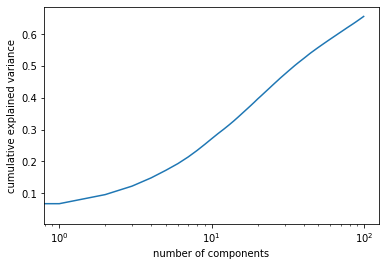

In [69]:
#plot the CDF for components
plt.semilogx(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

In [70]:
print(pca.explained_variance_ratio_)

[0.03449611 0.03272242 0.02851995 0.02663375 0.02586646 0.02383446
 0.02105171 0.02072819 0.02028736 0.01936249 0.01794865 0.01595999
 0.01389164 0.01341307 0.01300878 0.01279937 0.01228132 0.01145485
 0.01088648 0.01053507 0.01034913 0.00917146 0.00899407 0.00855302
 0.00819402 0.00793535 0.00754584 0.0071332  0.00701427 0.00641685
 0.00609723 0.00595325 0.00576607 0.00545171 0.00532581 0.00519096
 0.00472955 0.00458288 0.00432853 0.00422417 0.00410211 0.00407468
 0.00399175 0.00396855 0.00375206 0.00350031 0.00330127 0.00323004
 0.00321535 0.00309744 0.00300774 0.00286945 0.00281787 0.00278507
 0.00269366 0.00265048 0.00257627 0.00254884 0.00248829 0.00241417
 0.00237049 0.00232343 0.00229643 0.0022394  0.00219279 0.00216956
 0.00214376 0.0021343  0.00209802 0.00203483 0.00199617 0.00199038
 0.0019613  0.00192325 0.0019051  0.00188854 0.00188297 0.00186045
 0.00176564 0.00173897 0.0017199  0.00168467 0.00166588 0.00166231
 0.00164556 0.00164349 0.00163957 0.00163687 0.00162804 0.0016

### Model 5: Just Demographic Data

In [71]:
df.head()

,state,county,year,deaths,pop,QUANTITY,asian_female_0_4,asian_female_10_14,asian_female_15_19,asian_female_20_24,asian_female_25_29,asian_female_30_34,asian_female_35_39,asian_female_40_44,asian_female_45_49,asian_female_5_9,asian_female_50_54,asian_female_55_59,asian_female_60_64,asian_female_65_69,asian_female_70_74,asian_female_75_79,asian_female_80_84,asian_female_85+,asian_female_total,asian_male_0_4,asian_male_10_14,asian_male_15_19,asian_male_20_24,asian_male_25_29,asian_male_30_34,asian_male_35_39,asian_male_40_44,asian_male_45_49,asian_male_5_9,asian_male_50_54,asian_male_55_59,asian_male_60_64,asian_male_65_69,asian_male_70_74,asian_male_75_79,asian_male_80_84,asian_male_85+,asian_male_total,black_female_0_4,black_female_10_14,black_female_15_19,black_female_20_24,black_female_25_29,black_female_30_34,black_female_35_39,black_female_40_44,black_female_45_49,black_female_5_9,black_female_50_54,black_female_55_59,black_female_60_64,black_female_65_69,black_female_70_74,black_female_75_79,black_female_80_84,black_female_85+,black_female_total,black_male_0_4,black_male_10_14,black_male_15_19,black_male_20_24,black_male_25_29,black_male_30_34,black_male_35_39,black_male_40_44,black_male_45_49,black_male_5_9,black_male_50_54,black_male_55_59,black_male_60_64,black_male_65_69,black_male_70_74,black_male_75_79,black_male_80_84,black_male_85+,black_male_total,islander_female_0_4,islander_female_10_14,islander_female_15_19,islander_female_20_24,islander_female_25_29,islander_female_30_34,islander_female_35_39,islander_female_40_44,islander_female_45_49,islander_female_5_9,islander_female_50_54,islander_female_55_59,islander_female_60_64,islander_female_65_69,islander_female_70_74,islander_female_75_79,islander_female_80_84,islander_female_85+,islander_female_total,islander_male_0_4,islander_male_10_14,islander_male_15_19,islander_male_20_24,islander_male_25_29,islander_male_30_34,islander_male_35_39,islander_male_40_44,islander_male_45_49,islander_male_5_9,islander_male_50_54,islander_male_55_59,islander_male_60_64,islander_male_65_69,islander_male_70_74,islander_male_75_79,islander_male_80_84,islander_male_85+,islander_male_total,native_female_0_4,native_female_10_14,native_female_15_19,native_female_20_24,native_female_25_29,native_female_30_34,native_female_35_39,native_female_40_44,native_female_45_49,native_female_5_9,native_female_50_54,native_female_55_59,native_female_60_64,native_female_65_69,native_female_70_74,native_female_75_79,native_female_80_84,native_female_85+,native_female_total,native_male_0_4,native_male_10_14,native_male_15_19,native_male_20_24,native_male_25_29,native_male_30_34,native_male_35_39,native_male_40_44,native_male_45_49,native_male_5_9,native_male_50_54,native_male_55_59,native_male_60_64,native_male_65_69,native_male_70_74,native_male_75_79,native_male_80_84,native_male_85+,native_male_total,total_0_4,total_10_14,total_15_19,total_20_24,total_25_29,total_30_34,total_35_39,total_40_44,total_45_49,total_5_9,total_50_54,total_55_59,total_60_64,total_65_69,total_70_74,total_75_79,total_80_84,total_85+,total_pop_county,total_female_0_4,total_female_10_14,total_female_15_19,total_female_20_24,total_female_25_29,total_female_30_34,total_female_35_39,total_female_40_44,total_female_45_49,total_female_5_9,total_female_50_54,total_female_55_59,total_female_60_64,total_female_65_69,total_female_70_74,total_female_75_79,total_female_80_84,total_female_85+,total_female_pop_county,total_male_0_4,total_male_10_14,total_male_15_19,total_male_20_24,total_male_25_29,total_male_30_34,total_male_35_39,total_male_40_44,total_male_45_49,total_male_5_9,total_male_50_54,total_male_55_59,total_male_60_64,total_male_65_69,total_male_70_74,total_male_75_79,total_male_80_84,total_male_85+,total_male_pop_county,white_female_0_4,white_female_10_14,white_female_15_19,white_female_20_24,white_female_25_29,white_female_30_34,white_female_35_39,white_female_40_44,white_female_45_49,white_female_5_9,white_female_50_54,white_f

In [72]:
targets = ['death_rate']
drop_cols = ['state', 'county', 'year', 'deaths', 'pop', 'prescription_rate']
df_demo = df.drop(drop_cols, axis=1)
df_demo = df_demo.dropna()
features = [c for c in df_demo.columns if c not in targets]
X = df_demo[features]
y = df_demo[targets]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
reg = sklearn.linear_model.LinearRegression()
reg.fit(X_train, y_train)
print('Accuracy score on test set: {}'.format(reg.score(X_test, y_test)))
print('Accuracy score on training set: {}'.format(reg.score(X_train, y_train)))

Accuracy score on test set: 0.4329976652476607
Accuracy score on training set: 0.5251329170182599


### Model 6: Demo data and prescription rate

In [73]:
targets = ['death_rate']
drop_cols = ['state', 'county', 'year', 'deaths', 'pop']
df_demo = df.drop(drop_cols, axis=1)
df_demo = df_demo.dropna()
features = [c for c in df_demo.columns if c not in targets]
X = df_demo[features]
y = df_demo[targets]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
reg = sklearn.linear_model.LinearRegression()
reg.fit(X_train, y_train)
print('Accuracy score on test set: {}'.format(reg.score(X_test, y_test)))
print('Accuracy score on training set: {}'.format(reg.score(X_train, y_train)))

Accuracy score on test set: 0.48382986465831407
Accuracy score on training set: 0.55270368864255


### Model 7: County and State dummies, prescription rate with PCA

In [74]:
targets = ['death_rate']
dummies = ['county', 'state']
feature = ['prescription_rate']
Xy = df[targets + dummies + feature]
Xy = pd.get_dummies(Xy, columns=dummies, drop_first=True)
Xy = Xy.dropna()
y = Xy[targets]
features = [c for c in Xy.columns if c not in targets]
X = Xy[features]

In [75]:
transform = pca.fit_transform(X)
transform

array([[-0.00445431, -0.03317984, -0.016206  , ..., -0.01428651,
        -0.01202943, -0.03771253],
       [-0.00444664, -0.03319451, -0.01620141, ..., -0.01428159,
        -0.0120269 , -0.0377142 ],
       [-0.00444742, -0.03319301, -0.01620188, ..., -0.01428209,
        -0.01202716, -0.03771403],
       ...,
       [-0.00459287, -0.03437981, -0.01686717, ...,  0.010212  ,
         0.01100659,  0.0227646 ],
       [-0.00459164, -0.03438217, -0.01686643, ...,  0.01021279,
         0.011007  ,  0.02276433],
       [-0.00455248, -0.03398299, -0.01665701, ...,  0.00744038,
         0.00839247,  0.01632533]])

In [76]:
df_transform = pd.concat([pd.DataFrame(Xy[targets].values, columns=targets),
                          pd.DataFrame(transform)],
                         axis=1)
df_transform.head()

,death_rate,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99
0,0.000141,-0.004454,-0.033180,-0.016206,-0.007722,0.015619,-0.037488,-0.005799,-0.004851,0.006757,0.018180,0.025619,-0.051251,-0.009821,-0.008640,-0.009922,-0.003298,0.016618,0.019944,-0.012841,-0.002475,0.009533,0.021777,0.015985,0.021932,0.010223,0.004465,0.024135,0.017577,0.008416,0.022512,-0.002676,0.018140,0.031274,-0.008078,-0.017639,0.002861,0.023290,0.008275,-0.000837,0.022507,0.016769,0.010303,-0.000571,0.004007,-0.001556,0.002587,-0.002575,0.025329,0.008363,0.000063,-0.007230,0.025462,-0.000186,0.000298,-0.002898,0.005346,-0.014803,0.025490,0.006759,-0.006937,-0.006646,-0.002692,0.001025,-0.006161,0.019730,0.020141,0.000284,0.000717,-0.004567,-0.008982,-0.007827,-0.002465,-0.003224,0.017982,0.001448,0.006518,-0.018398,-0.000911,0.008068,0.000066,0.035397,0.005302,0.000578,-0.005484,-0.000263,0.001635,-0.004092,-0.000142,-0.002072,0.000260,0.001281,0.009333,-0.011703,-0.004672,-0.017847,0.003042,-0.003256,-0.014287,-0.012029,-0.037713
1,0.000183,-0.004447,-0.033195,-0.016201,-0.007719,0.015627,-0.037490,-0.005779,-0.004856,0.006747,0.018198,0.025615,-0.051234,-0.009834,-0.008654,-0.009930,-0.003278,0.016603,0.019946,-0.012835,-0.002464,0.009529,0.021774,0.015987,0.021932,0.010232,0.004474,0.024127,0.017588,0.008409,0.022511,-0.002675,0.018145,0.031266,-0.008064,-0.017646,0.002855,0.023288,0.008261,-0.000835,0.022505,0.016782,0.010305,-0.000577,0.003998,-0.001559,0.002593,-0.002571,0.025322,0.008381,0.000061,-0.007239,0.025493,-0.000189,0.000282,-0.002909,0.005339,-0.014804,0.025496,0.006759,-0.006930,-0.006643,-0.002682,0.001028,-0.006175,0.019736,0.020126,0.000312,0.000735,-0.004581,-0.008962,-0.007815,-0.002462,-0.003235,0.017967,0.001446,0.006508,-0.018405,-0.000905,0.008062,0.000056,0.035404,0.005309,0.000572,-0.005467,-0.000257,0.001634,-0.004101,-0.000150,-0.002063,0.000266,0.001293,0.009331,-0.011695,-0.004678,-0.017838,0.003027,-0.003271,-0.014282,-0.012027,-0.037714
2,0.000173,-0.004447,-0.033193,-0.016202,-0.007719,0.015627,-0.037490,-0.005781,-0.004855,0.006748,0.018196,0.025616,-0.051235,-0.009833,-0.008653,-0.009930,-0.003280,0.016604,0.019946,-0.012836,-0.002465,0.009529,0.021774,0.015987,0.021932,0.010231,0.004473,0.024127,0.017587,0.008409,0.022511,-0.002675,0.018145,0.031267,-0.008065,-0.017645,0.002856,0.023288,0.008263,-0.000835,0.022505,0.016781,0.010305,-0.000576,0.003999,-0.001559,0.002593,-0.002571,0.025322,0.008379,0.000062,-0.007238,0.025490,-0.000188,0.000284,-0.002908,0.005340,-0.014804,0.025495,0.006759,-0.006931,-0.006643,-0.002683,0.001028,-0.006173,0.019735,0.020128,0.000309,0.000733,-0.004579,-0.008964,-0.007816,-0.002462,-0.003234,0.017968,0.001446,0.006509,-0.018404,-0.000905,0.008063,0.000057,0.035403,0.005308,0.000572,-0.005469,-0.000258,0.001634,-0.004100,-0.000149,-0.002064,0.000266,0.001292,0.009331,-0.011696,-0.004678,-0.017839,0.003028,-0.003269,-0.014282,-0.012027,-0.037714
3,0.000189,-0.004441,-0.033206,-0.016198,-0.007716,0.015634,-0.037492,-0.005763,-0.004859,0.006739,0.018212,0.025612,-0.051220,-0.009844,-0.008666,-0.009937,-0.003263,0.016591,0.019948,-0.012830,-0.002455,0.009525,0.021771,0.015989,0.021931,0.010239,0.004480,0.024120,0.017596,0.008403,0.022510,-0.002674,0.018150,0.031259,-0.008052,-0.017651,0.002850,0.023287,0.008251,-0.000833,0.022504,0.016792,0.010307,-0.000581,0.003991,-0.001561,0.002598,-0.002568,0.025316,0.008396,0.000060,-0.007246,0.025517,-0.000190,0.000270,-0.002918,0.005334,-0.014806,0.025501,0.006760,-0.006925,-0.006641,-0.002674,0.001030,-0.006186,0.019741,0.020115,0.000335,0.000748,-0.004592,-0.008947,-0.007806,-0.002459,-0.003245,0.017954,0.001445,0.006501,-0.018410,-0.000900,0.008058,0.000048,0.035410,0.005315,0.000567,-0.005455,-0.000253,0.00163

In [77]:
features = [c for c in df_transform.columns if c not in targets]
X_train, X_test, y_train, y_test = train_test_split(df_transform[features], df_transform[targets], test_size=0.1, random_state=42)
lr = sklearn.linear_model.LinearRegression()
lr.fit(X_train, y_train)
print('Accuracy score on test set: {}'.format(lr.score(X_test, y_test)))
print('Accuracy score on training set: {}'.format(lr.score(X_train, y_train)))

Accuracy score on test set: 0.3505859900863262
Accuracy score on training set: 0.3430853733574316


### Model 8: County and State, prescription rate, no PCA

In [78]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
lr = sklearn.linear_model.LinearRegression()
lr.fit(X_train, y_train)
print('Accuracy score on test set: {}'.format(lr.score(X_test, y_test)))
print('Accuracy score on training set: {}'.format(lr.score(X_train, y_train)))

Accuracy score on test set: -3.67493591140009e+23
Accuracy score on training set: 0.7235979730603044


### Model 9: County and State, demo data, no PCA

In [79]:
targets = ['death_rate']
dummies = ['county', 'state']
drop_cols = ['year', 'deaths', 'pop', 'prescription_rate', 'QUANTITY']
df_demo = df.drop(drop_cols, axis=1)
df_demo.head()

,state,county,asian_female_0_4,asian_female_10_14,asian_female_15_19,asian_female_20_24,asian_female_25_29,asian_female_30_34,asian_female_35_39,asian_female_40_44,asian_female_45_49,asian_female_5_9,asian_female_50_54,asian_female_55_59,asian_female_60_64,asian_female_65_69,asian_female_70_74,asian_female_75_79,asian_female_80_84,asian_female_85+,asian_female_total,asian_male_0_4,asian_male_10_14,asian_male_15_19,asian_male_20_24,asian_male_25_29,asian_male_30_34,asian_male_35_39,asian_male_40_44,asian_male_45_49,asian_male_5_9,asian_male_50_54,asian_male_55_59,asian_male_60_64,asian_male_65_69,asian_male_70_74,asian_male_75_79,asian_male_80_84,asian_male_85+,asian_male_total,black_female_0_4,black_female_10_14,black_female_15_19,black_female_20_24,black_female_25_29,black_female_30_34,black_female_35_39,black_female_40_44,black_female_45_49,black_female_5_9,black_female_50_54,black_female_55_59,black_female_60_64,black_female_65_69,black_female_70_74,black_female_75_79,black_female_80_84,black_female_85+,black_female_total,black_male_0_4,black_male_10_14,black_male_15_19,black_male_20_24,black_male_25_29,black_male_30_34,black_male_35_39,black_male_40_44,black_male_45_49,black_male_5_9,black_male_50_54,black_male_55_59,black_male_60_64,black_male_65_69,black_male_70_74,black_male_75_79,black_male_80_84,black_male_85+,black_male_total,islander_female_0_4,islander_female_10_14,islander_female_15_19,islander_female_20_24,islander_female_25_29,islander_female_30_34,islander_female_35_39,islander_female_40_44,islander_female_45_49,islander_female_5_9,islander_female_50_54,islander_female_55_59,islander_female_60_64,islander_female_65_69,islander_female_70_74,islander_female_75_79,islander_female_80_84,islander_female_85+,islander_female_total,islander_male_0_4,islander_male_10_14,islander_male_15_19,islander_male_20_24,islander_male_25_29,islander_male_30_34,islander_male_35_39,islander_male_40_44,islander_male_45_49,islander_male_5_9,islander_male_50_54,islander_male_55_59,islander_male_60_64,islander_male_65_69,islander_male_70_74,islander_male_75_79,islander_male_80_84,islander_male_85+,islander_male_total,native_female_0_4,native_female_10_14,native_female_15_19,native_female_20_24,native_female_25_29,native_female_30_34,native_female_35_39,native_female_40_44,native_female_45_49,native_female_5_9,native_female_50_54,native_female_55_59,native_female_60_64,native_female_65_69,native_female_70_74,native_female_75_79,native_female_80_84,native_female_85+,native_female_total,native_male_0_4,native_male_10_14,native_male_15_19,native_male_20_24,native_male_25_29,native_male_30_34,native_male_35_39,native_male_40_44,native_male_45_49,native_male_5_9,native_male_50_54,native_male_55_59,native_male_60_64,native_male_65_69,native_male_70_74,native_male_75_79,native_male_80_84,native_male_85+,native_male_total,total_0_4,total_10_14,total_15_19,total_20_24,total_25_29,total_30_34,total_35_39,total_40_44,total_45_49,total_5_9,total_50_54,total_55_59,total_60_64,total_65_69,total_70_74,total_75_79,total_80_84,total_85+,total_pop_county,total_female_0_4,total_female_10_14,total_female_15_19,total_female_20_24,total_female_25_29,total_female_30_34,total_female_35_39,total_female_40_44,total_female_45_49,total_female_5_9,total_female_50_54,total_female_55_59,total_female_60_64,total_female_65_69,total_female_70_74,total_female_75_79,total_female_80_84,total_female_85+,total_female_pop_county,total_male_0_4,total_male_10_14,total_male_15_19,total_male_20_24,total_male_25_29,total_male_30_34,total_male_35_39,total_male_40_44,total_male_45_49,total_male_5_9,total_male_50_54,total_male_55_59,total_male_60_64,total_male_65_69,total_male_70_74,total_male_75_79,total_male_80_84,total_male_85+,total_male_pop_county,white_female_0_4,white_female_10_14,white_female_15_19,white_female_20_24,white_female_25_29,white_female_30_34,white_female_35_39,white_female_40_44,white_female_45_49,white_female_5_9,white_female_50_54,white_female_55_59,white_female_

In [80]:
df_dummies = pd.get_dummies(df_demo, columns=dummies, drop_first=True)
df_dummies.head()

asian_female_0_4    asian_female_10_14     asian_female_15_19  \
0  0.004191114836546521  0.004195804195804196  0.0032634032634032634   
1  0.004191114836546521  0.004195804195804196  0.0032634032634032634   
2  0.004191114836546521  0.004195804195804196  0.0032634032634032634   
3  0.004191114836546521  0.004195804195804196  0.0032634032634032634   
4  0.004191114836546521  0.004195804195804196  0.0032634032634032634   

      asian_female_20_24    asian_female_25_29     asian_female_30_34  \
0  0.0022727272727272726  0.007285397529299968  0.0075075075075075074   
1  0.0022727272727272726  0.007285397529299968  0.0075075075075075074   
2  0.0022727272727272726  0.007285397529299968  0.0075075075075075074   
3  0.0022727272727272726  0.007285397529299968  0.0075075075075075074   
4  0.0022727272727272726  0.007285397529299968  0.0075075075075075074   

     asian_female_35_39   asian_female_40_44    asian_female_45_49  \
0  0.007216742843396681  0.00881057268722467  0.006232686980609419   
1  0.007216742843396681  0.00881057268722467  0.006232686980609419   
2  0.007216742843396681  0.00881057268722467  0.006232686980609419   
3  0.007216742843396681  0.00881057268722467  0.006232686980609419   
4  0.007216742843396681  0.00881057268722467  0.006232686980609419   

       asian_female_5_9    asian_female_50_54     asian_female_55_59  \
0  0.005261839138060637  0.004389362251484637  0.0029192345118391177   
1  0.005261839138060637  0.004389362251484637  0.0029192345118391177   
2  0.005261839138060637  0.004389362251484637  0.0029192345118391177   
3  0.005261839138060637  0.004389362251484637  0.0029192345118391177   
4  0.005261839138060637  0.004389362251484637  0.0029192345118391177   

     asian_female_60_64    asian_female_65_69    asian_female_70_74  \
0  0.004681310767014764  0.003952569169960474  0.004608294930875576   
1  0.004681310767014764  0.003952569169960474  0.004608294930875576   
2  0.004681310767014764  0.003952569169960474  0.004608294930875576   
3  0.004681310767014764  0.003952569169960474  0.004608294930875576   
4  0.004681310767014764  0.003952569169960474  0.004608294930875576   

     asian_female_75_79    asian_female_80_84 asian_female_85+  \
0  0.005595523581135092  0.006839945280437756              0.0   
1  0.005595523581135092  0.006839945280437756              0.0   
2  0.005595523581135092  0.006839945280437756              0.0   
3  0.005595523581135092  0.006839945280437756              0.0   
4  0.005595523581135092  0.006839945280437756              0.0   

     asian_female_total         asian_male_0_4      asian_male_10_14  \
0  0.005204229352586538  0.0036322995250069852  0.005361305361305362   
1  0.005204229352586538  0.0036322995250069852  0.005361305361305362   
2  0.005204229352586538  0.0036322995250069852  0.005361305361305362   
3  0.005204229352586538  0.0036322995250069852  0.005361305361305362   
4  0.005204229352586538  0.0036322995250069852  0.005361305361305362   

       asian_male_15_19       asian_male_20_24       asian_male_25_29  \
0  0.005827505827505828  0.0025974025974025974  0.0022172949002217295   
1  0.005827505827505828  0.0025974025974025974  0.0022172949002217295   
2  0.005827505827505828  0.0025974025974025974  0.0022172949002217295   
3  0.005827505827505828  0.0025974025974025974  0.0022172949002217295   
4  0.005827505827505828  0.0025974025974025974  0.0022172949002217295   

        asian_male_30_34      asian_male_35_39      asian_male_40_44  \
0  0.0036036036036036037  0.007216742843396681  0.003915810083210965   
1  0.0036036036036036037  0.007216742843396681  0.003915810083210965   
2  0.0036036036036036037  0.007216742843396681  0.003915810083210965   
3  0.0036036036036036037  0.007216742843396681  0.003915810083210965   
4  0.0036036036036036037  0.007216742843396681  0.003915810083210965   

        asian_male_45_49        asian_male_5_9      asian_male_50_54  \
0  0.0043859649122807015  0.004259584064144325  0.002581977794990963   
1  0.004

In [81]:
df_dummies = df_dummies.dropna()
features = [c for c in df_dummies if c not in targets]
X = df_dummies[targets]
y = df_dummies[features]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
lr = sklearn.linear_model.LinearRegression()
lr.fit(X_train, y_train)
print('Accuracy score on test set: {}'.format(lr.score(X_test, y_test)))
print('Accuracy score on training set: {}'.format(lr.score(X_train, y_train)))

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:420: FutureWarning:

The default value of multioutput (not exposed in score method) will change from 'variance_weighted' to 'uniform_average' in 0.23 to keep consistent with 'metrics.r2_score'. To specify the default value manually and avoid the warning, please either call 'metrics.r2_score' directly or make a custom scorer with 'metrics.make_scorer' (the built-in scorer 'r2' uses multioutput='uniform_average').



Accuracy score on test set: 0.0312765724208696


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:420: FutureWarning:

The default value of multioutput (not exposed in score method) will change from 'variance_weighted' to 'uniform_average' in 0.23 to keep consistent with 'metrics.r2_score'. To specify the default value manually and avoid the warning, please either call 'metrics.r2_score' directly or make a custom scorer with 'metrics.make_scorer' (the built-in scorer 'r2' uses multioutput='uniform_average').



Accuracy score on training set: 0.03826811797338963


### Model 10: County and State, demo data, PCA

In [82]:
targets = ['death_rate']
dummies = ['county', 'state']
drop_cols = ['year', 'deaths', 'pop', 'prescription_rate', 'QUANTITY']
df_demo = df.drop(drop_cols, axis=1)
df_dummies = pd.get_dummies(df_demo, columns=dummies, drop_first=True)
df_dummies = df_dummies.dropna()
features = [c for c in df_dummies if c not in targets]
pca = PCA(n_components=100, random_state=42)
transform = pca.fit_transform(df_dummies[features])

In [83]:
df_transform = pd.concat([pd.DataFrame(Xy[targets].values, columns=targets),
                          pd.DataFrame(transform)],
                         axis=1)
df_transform.head()

,death_rate,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99
0,0.000141,-172100.122653,-3533.642314,-840.742923,1177.981215,2163.199122,1346.204914,412.864037,-1683.946049,-267.211898,304.931663,-147.818526,62.388003,-36.876187,-243.381516,-110.346711,60.148867,31.677956,-24.847247,0.055885,-0.004842,-0.006279,-0.016573,-0.003653,0.026633,0.049992,0.050865,0.060743,0.011862,0.048794,0.024492,0.029607,0.018625,-0.01159,-0.009321,0.003423,-0.024755,0.008119,0.02788,0.013034,0.014235,0.059738,0.012332,-0.030885,-0.013147,-0.015502,-0.003957,0.032358,-0.026071,0.015542,-0.02789,0.014094,0.0473,-0.017128,0.02209,-0.066523,-0.06011,-0.006452,0.009815,0.019033,0.017699,0.044059,0.011322,0.001242,-0.004675,-0.012862,-0.003387,0.003499,0.010679,0.024922,-0.025659,0.01654,-0.020266,0.046067,-0.001353,-0.030354,0.036031,-0.016313,0.038036,0.007647,0.003177,-0.005805,-0.001031,-0.012833,0.002119,0.004444,-0.008305,0.021117,0.022293,0.003723,0.001284,0.010596,0.021977,-0.03729,0.038342,-0.003036,-0.00548,0.028779,0.001785,-0.029404,-0.036804
1,0.000183,-172100.122653,-3533.642314,-840.742923,1177.981215,2163.199122,1346.204914,412.864037,-1683.946049,-267.211898,304.931663,-147.818526,62.388003,-36.876187,-243.381516,-110.346711,60.148867,31.677956,-24.847247,0.055885,-0.004842,-0.006279,-0.016573,-0.003653,0.026633,0.049992,0.050865,0.060743,0.011862,0.048794,0.024492,0.029607,0.018625,-0.01159,-0.009321,0.003423,-0.024755,0.008119,0.02788,0.013034,0.014235,0.059738,0.012332,-0.030885,-0.013147,-0.015502,-0.003957,0.032358,-0.026071,0.015542,-0.02789,0.014094,0.0473,-0.017128,0.02209,-0.066523,-0.06011,-0.006452,0.009815,0.019033,0.017699,0.044059,0.011322,0.001242,-0.004675,-0.012862,-0.003387,0.003499,0.010679,0.024922,-0.025659,0.01654,-0.020266,0.046067,-0.001353,-0.030354,0.036031,-0.016313,0.038036,0.007647,0.003177,-0.005805,-0.001031,-0.012833,0.002119,0.004444,-0.008305,0.021117,0.022293,0.003723,0.001284,0.010596,0.021977,-0.03729,0.038342,-0.003036,-0.00548,0.028779,0.001785,-0.029404,-0.036804
2,0.000173,-172100.122653,-3533.642314,-840.742923,1177.981215,2163.199122,1346.204914,412.864037,-1683.946049,-267.211898,304.931663,-147.818526,62.388003,-36.876187,-243.381516,-110.346711,60.148867,31.677956,-24.847247,0.055885,-0.004842,-0.006279,-0.016573,-0.003653,0.026633,0.049992,0.050865,0.060743,0.011862,0.048794,0.024492,0.029607,0.018625,-0.01159,-0.009321,0.003423,-0.024755,0.008119,0.02788,0.013034,0.014235,0.059738,0.012332,-0.030885,-0.013147,-0.015502,-0.003957,0.032358,-0.026071,0.015542,-0.02789,0.014094,0.0473,-0.017128,0.02209,-0.066523,-0.06011,-0.006452,0.009815,0.019033,0.017699,0.044059,0.011322,0.001242,-0.004675,-0.012862,-0.003387,0.003499,0.010679,0.024922,-0.025659,0.01654,-0.020266,0.046067,-0.001353,-0.030354,0.036031,-0.016313,0.038036,0.007647,0.003177,-0.005805,-0.001031,-0.012833,0.002119,0.004444,-0.008305,0.021117,0.022293,0.003723,0.001284,0.010596,0.021977,-0.03729,0.038342,-0.003036,-0.00548,0.028779,0.001785,-0.029404,-0.036804
3,0.000189,-172100.122653,-3533.642314,-840.742923,1177.981215,2163.199122,1346.204914,412.864037,-1683.946049,-267.211898,304.931663,-147.818526,62.388003,-36.876187,-243.381516,-110.346711,60.148867,31.677956,-24.847247,0.055885,-0.004842,-0.006279,-0.016573,-0.003653,0.026633,0.049992,0.050865,0.060743,0.011862,0.048794,0.024492,0.029607,0.018625,-0.01159,-0.009321,0.003423,-0.024755,0.008119,0.02788,0.013034,0.014235,0.059738,0.012332,-0.030885,-0.013147,-0.015502,-0.003957,0.032358,-0.026071,0.015542,-0.02789,0.014094,0.0473,-0.017128,0.02209,-0.066523,-0.06011,-0.006452,0.009815,0.019033,0.017699,0.044059,0.011322,0.001242,-0.004675,-0.012862,-0.003387,0.003499,0.010679,0.024922,-0.025659,0.01654,-0.020266,0.046067,-0.001353,-0.03

In [84]:
features = [c for c in df_transform.columns if c not in targets]
X_train, X_test, y_train, y_test = train_test_split(df_transform[features], df_transform[targets], test_size=0.1, random_state=42)
lr = sklearn.linear_model.LinearRegression()
lr.fit(X_train, y_train)
print('Accuracy score on test set: {}'.format(lr.score(X_test, y_test)))
print('Accuracy score on training set: {}'.format(lr.score(X_train, y_train)))

Accuracy score on test set: 0.39215513952628855
Accuracy score on training set: 0.40865912691382866


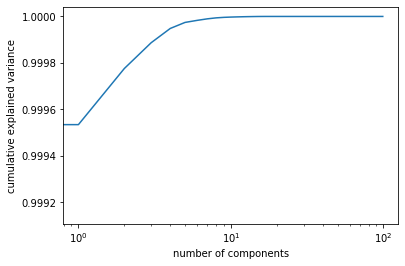

In [85]:
plt.semilogx(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

### Model 11: County and State, Demo Data, Prescription Rate, PCA

In [86]:
targets = ['death_rate']
dummies = ['county', 'state']
drop_cols = ['year', 'deaths', 'pop', 'QUANTITY']
df_demo = df.drop(drop_cols, axis=1)
df_dummies = pd.get_dummies(df_demo, columns=dummies, drop_first=True)
df_dummies = df_dummies.dropna()
features = [c for c in df_dummies if c not in targets]
pca = PCA(n_components=100, random_state=42)
transform = pca.fit_transform(df_dummies[features])
df_transform = pd.concat([pd.DataFrame(df_dummies[targets].values, columns=targets),
                          pd.DataFrame(transform)],
                         axis=1)
df_transform.head()

,death_rate,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99
0,0.000141,-172100.122653,-3533.642314,-840.742923,1177.981215,2163.199122,1346.204914,412.864037,-1683.946049,-267.211898,304.931663,-147.818526,62.388003,-36.876187,-243.381516,-110.346711,60.148867,31.677956,-24.847247,0.055873,-0.004844,-0.006251,-0.016568,-0.003641,0.026647,0.049972,0.050876,0.060752,0.011822,0.048820,0.024491,0.029605,0.018629,-0.011564,-0.009362,0.003406,-0.024753,0.008118,0.027878,0.013056,0.014234,0.059760,0.012312,-0.030884,-0.013148,-0.015506,-0.003964,0.032362,-0.026080,0.015544,-0.027882,0.014100,0.047274,-0.017162,0.022151,-0.066483,-0.060123,-0.006493,0.009832,0.018987,0.017726,0.043925,0.011392,0.001297,-0.004739,-0.013074,-0.003237,0.003511,0.010966,0.024524,-0.026027,0.016019,-0.019420,0.047022,-0.002030,-0.030682,0.035395,-0.012627,0.038061,0.007105,0.006934,-0.005412,-0.005462,-0.015665,0.010567,0.003308,-0.004944,0.020488,0.019586,-0.015745,-0.001185,0.044428,-0.017718,-0.022807,0.016327,0.025566,0.004023,0.010475,-0.034612,-0.008451,0.008289
1,0.000183,-172100.122653,-3533.642314,-840.742923,1177.981215,2163.199122,1346.204914,412.864037,-1683.946049,-267.211898,304.931663,-147.818526,62.388003,-36.876187,-243.381516,-110.346711,60.148867,31.677956,-24.847247,0.055879,-0.004843,-0.006265,-0.016570,-0.003645,0.026639,0.049980,0.050873,0.060746,0.011844,0.048811,0.024483,0.029608,0.018626,-0.011577,-0.009341,0.003385,-0.024758,0.008118,0.027879,0.013047,0.014235,0.059751,0.012306,-0.030884,-0.013145,-0.015501,-0.003959,0.032359,-0.026066,0.015547,-0.027882,0.014099,0.047284,-0.017155,0.022130,-0.066476,-0.060126,-0.006498,0.009827,0.018992,0.017720,0.043934,0.011384,0.001290,-0.004741,-0.013061,-0.003239,0.003518,0.010974,0.024523,-0.026012,0.016012,-0.019424,0.047016,-0.002047,-0.030695,0.035387,-0.012637,0.038058,0.007091,0.006927,-0.005396,-0.005469,-0.015669,0.010559,0.003294,-0.004956,0.020480,0.019556,-0.015752,-0.001183,0.044438,-0.017718,-0.022789,0.016326,0.025551,0.004025,0.010489,-0.034611,-0.008437,0.008273
2,0.000173,-172100.122653,-3533.642314,-840.742923,1177.981215,2163.199122,1346.204914,412.864037,-1683.946049,-267.211898,304.931663,-147.818526,62.388003,-36.876187,-243.381516,-110.346711,60.148867,31.677956,-24.847247,0.055879,-0.004843,-0.006264,-0.016570,-0.003645,0.026640,0.049979,0.050873,0.060747,0.011842,0.048812,0.024483,0.029607,0.018627,-0.011575,-0.009344,0.003387,-0.024758,0.008118,0.027879,0.013048,0.014235,0.059752,0.012307,-0.030884,-0.013146,-0.015501,-0.003959,0.032359,-0.026067,0.015547,-0.027882,0.014099,0.047283,-0.017156,0.022132,-0.066477,-0.060126,-0.006497,0.009827,0.018991,0.017720,0.043933,0.011385,0.001291,-0.004741,-0.013063,-0.003239,0.003517,0.010973,0.024523,-0.026013,0.016013,-0.019423,0.047016,-0.002045,-0.030693,0.035388,-0.012636,0.038059,0.007092,0.006928,-0.005398,-0.005468,-0.015669,0.010560,0.003296,-0.004955,0.020481,0.019559,-0.015751,-0.001183,0.044437,-0.017718,-0.022791,0.016326,0.025552,0.004024,0.010488,-0.034611,-0.008438,0.008275
3,0.000189,-172100.122653,-3533.642314,-840.742923,1177.981215,2163.199122,1346.204914,412.864037,-1683.946049,-267.211898,304.931663,-147.818526,62.388003,-36.876187,-243.381516,-110.346711,60.148867,31.677956,-24.847247,0.055885,-0.004842,-0.006276,-0.016572,-0.003648,0.026633,0.049986,0.050871,0.060742,0.011862,0.048804,0.024476,0.029610,0.018624,-0.011586,-0.009325,0.003369,-0.024763,0.008119,0.027880,0.013041,0.014235,0.059744,0.012302,-0.030884,-0.013143,-0.015496,-0.003954,0.032356,-0.026055,0.015550,-0.027882,0.014099,0.047293,-0.017149,0.022114,-0.066471,-0.060129,-0.006501,0.009822,0.018996,0.017715,0.043941,0.011379,0.001285,-0.004743,-0.013051,-0.003240,0.003523,0.010981,0.024521,-0.026000,0.

In [87]:
features = [c for c in df_transform.columns if c not in targets]
X_train, X_test, y_train, y_test = train_test_split(df_transform[features], df_transform[targets], test_size=0.1, random_state=42)
lr = sklearn.linear_model.LinearRegression()
lr.fit(X_train, y_train)
print('Accuracy score on test set: {}'.format(lr.score(X_test, y_test)))
print('Accuracy score on training set: {}'.format(lr.score(X_train, y_train)))

Accuracy score on test set: 0.39119248567645537
Accuracy score on training set: 0.41064381130600824


### Model 12: Prescription Rate and Demo Data, Random Forest

In [369]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
targets = ['death_rate']
drop_cols = ['state', 'county', 'year', 'deaths', 'pop', 'QUANTITY']
df_demo = df.drop(drop_cols, axis=1)
df_demo = df_demo.dropna()
features = [c for c in df_demo.columns if c not in targets]
X = df_demo[features]
y = df_demo[targets]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [370]:
rfr = RandomForestRegressor()
parameters = {'n_estimators' : range(64, 128)}
rfr_cv = GridSearchCV(rfr, parameters, cv=5)
rfr_cv.fit(X_train, y_train)
rfr_model = rfr_cv.best_estimator_
print (rfr_cv.best_score_, rfr_cv.best_params_) 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:516: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:516: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:516: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:516: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\ProgramData\Anaconda3

0.9475740181905092 {'n_estimators': 104}


In [371]:
rfr_cv.score(X_train, y_train)

0.9676032282767981

### Models 13 and 14: Prescription Rate and Demo Data, Lasso and Ridge

In [90]:
#let's try lasso and ridge with grid search to find best alphas
from sklearn.linear_model import Ridge, Lasso
# set range of alphas 
alpha_lasso = [1e-15, 1e-10, 1e-8, 1e-5,1e-4, 1e-3,1e-2, 1, 5, 10]
alpha_ridge = [1e-15, 1e-10, 1e-8, 1e-4, 1e-3, 1e-2, 1, 5, 10, 20]
param_lasso = {'alpha' : alpha_lasso}
param_ridge = {'alpha' : alpha_ridge}    
grid1 = GridSearchCV(Lasso(normalize=True), param_lasso, cv = 5)
grid2 = GridSearchCV(Ridge(normalize=True), param_ridge, cv = 5)
grid1.fit(X_train, y_train)
grid2.fit(X_train, y_train)
print(grid1.best_score_, grid1.best_params_)
print(grid2.best_score_, grid2.best_params_)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.382915131588549e-06, tolerance: 3.4282050375293032e-09

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.951432837869364e-06, tolerance: 3.1921845903678203e-09

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.936769851988265e-06, tolerance: 3.4728036951505132e-09

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.

0.3675232342214808 {'alpha': 1e-10}
0.4221815329272634 {'alpha': 0.0001}


In [373]:
print("Lasso training score: {}".format(grid1.score(X_train, y_train)))
print("Ridge training score: {}".format(grid2.score(X_train, y_train)))

Lasso training score: -12598977968.69581
Ridge training score: -1.1636056068520211e+23


### Model 15: Prescription Rate and Demo Data, Random Forest with Randomized Search CV

In [91]:
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(50, 500, 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
print(random_grid)

{'n_estimators': [50, 100, 150, 200, 250, 300, 350, 400, 450, 500], 'max_features': ['auto', 'sqrt'], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4], 'bootstrap': [True, False]}


In [92]:
rf = RandomForestRegressor()
rf_random_cv = RandomizedSearchCV(rf, param_distributions=random_grid,
                                 n_iter=100, cv=5, random_state=42)
rf_random_cv.fit(X_train, y_train)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:516: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:516: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:516: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:516: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\ProgramData\Anaconda3

RandomizedSearchCV(cv=5, error_score='raise-deprecating',
                   estimator=RandomForestRegressor(bootstrap=True,
                                                   criterion='mse',
                                                   max_depth=None,
                                                   max_features='auto',
                                                   max_leaf_nodes=None,
                                                   min_impurity_decrease=0.0,
                                                   min_impurity_split=None,
                                                   min_samples_leaf=1,
                                                   min_samples_split=2,
                                                   min_weight_fraction_leaf=0.0,
                                                   n_estimators='warn',
                                                   n_jobs=None, oob_score=False,
                                                   random_sta...


In [93]:
rf_random_cv.best_score_

-0.0009438802941834797

In [94]:
rf_random_cv.best_params_

{'n_estimators': 100,
 'min_samples_split': 2,
 'min_samples_leaf': 4,
 'max_features': 'sqrt',
 'max_depth': 10,
 'bootstrap': True}

### Model 16: Target: Deaths, Features: prescription rate, demo data, population, Type: Linear Regression

In [375]:
targets = ['deaths']
drop_cols = ['year', 'state', 'county', 'QUANTITY', 'death_rate']
df_drop = df.drop(drop_cols, axis=1)
df_drop = df_drop.dropna()
features = [c for c in df_drop.columns if c not in targets]
X = df_drop[features]
y = df_drop[targets]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
reg = sklearn.linear_model.LinearRegression()
reg.fit(X_train, y_train)
print('Accuracy score on test set: {}'.format(reg.score(X_test, y_test)))
print('Accuracy score on training set: {}'.format(reg.score(X_train, y_train)))

Accuracy score on test set: 0.9126021518203989
Accuracy score on training set: 0.9021490749003264


### Models 17 and 18: Target: Deaths, Features: prescription rate, demo data, population, Type: Lasso and Ridge

In [96]:
alpha_lasso = [1e-15, 1e-10, 1e-8, 1e-5,1e-4, 1e-3,1e-2, 1, 5, 10]
alpha_ridge = [1e-15, 1e-10, 1e-8, 1e-4, 1e-3, 1e-2, 1, 5, 10, 20]
param_lasso = {'alpha' : alpha_lasso}
param_ridge = {'alpha' : alpha_ridge}    
grid1 = GridSearchCV(Lasso(normalize=True), param_lasso, cv = 5)
grid2 = GridSearchCV(Ridge(normalize=True), param_ridge, cv = 5)
grid1.fit(X_train, y_train)
grid2.fit(X_train, y_train)
print(grid1.best_score_, grid1.best_params_)
print(grid2.best_score_, grid2.best_params_)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 413953.3364521324, tolerance: 823.8637360100375

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 413238.0766853839, tolerance: 823.5516930991217

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 397729.11509221344, tolerance: 747.3366294437473

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 384650.22861719463, toleranc

0.8637321141125737 {'alpha': 0.001}
0.8714108113843041 {'alpha': 1e-08}


### Model 19: Target: Deaths, Features: Prescription Rate, Demo Data, County and State, Population, Type: Linear Regression with PCA

In [97]:
targets = ['deaths']
dummies = ['county', 'state']
drop_cols = ['year', 'death_rate', 'pop', 'QUANTITY']
df_demo = df.drop(drop_cols, axis=1)
df_dummies = pd.get_dummies(df_demo, columns=dummies, drop_first=True)
df_dummies = df_dummies.dropna()
features = [c for c in df_dummies if c not in targets]
pca = PCA(n_components=100, random_state=42)
transform = pca.fit_transform(df_dummies[features])
df_transform = pd.concat([pd.DataFrame(df_dummies[targets].values, columns=targets),
                          pd.DataFrame(transform)],
                         axis=1)
df_transform.head()

,deaths,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99
0,21.0,-172100.122653,-3533.642314,-840.742923,1177.981215,2163.199122,1346.204914,412.864037,-1683.946049,-267.211898,304.931663,-147.818526,62.388003,-36.876187,-243.381516,-110.346711,60.148867,31.677956,-24.847247,0.055873,-0.004844,-0.006251,-0.016568,-0.003641,0.026647,0.049972,0.050876,0.060752,0.011822,0.048820,0.024491,0.029605,0.018629,-0.011564,-0.009362,0.003406,-0.024753,0.008118,0.027878,0.013056,0.014234,0.059760,0.012312,-0.030884,-0.013148,-0.015506,-0.003964,0.032362,-0.026080,0.015544,-0.027882,0.014100,0.047274,-0.017162,0.022151,-0.066483,-0.060123,-0.006493,0.009832,0.018987,0.017726,0.043925,0.011392,0.001297,-0.004739,-0.013074,-0.003237,0.003511,0.010966,0.024524,-0.026027,0.016019,-0.019420,0.047022,-0.002030,-0.030682,0.035395,-0.012627,0.038061,0.007105,0.006934,-0.005412,-0.005462,-0.015665,0.010567,0.003308,-0.004944,0.020488,0.019586,-0.015745,-0.001185,0.044428,-0.017718,-0.022807,0.016327,0.025566,0.004023,0.010475,-0.034612,-0.008451,0.008289
1,28.0,-172100.122653,-3533.642314,-840.742923,1177.981215,2163.199122,1346.204914,412.864037,-1683.946049,-267.211898,304.931663,-147.818526,62.388003,-36.876187,-243.381516,-110.346711,60.148867,31.677956,-24.847247,0.055879,-0.004843,-0.006265,-0.016570,-0.003645,0.026639,0.049980,0.050873,0.060746,0.011844,0.048811,0.024483,0.029608,0.018626,-0.011577,-0.009341,0.003385,-0.024758,0.008118,0.027879,0.013047,0.014235,0.059751,0.012306,-0.030884,-0.013145,-0.015501,-0.003959,0.032359,-0.026066,0.015547,-0.027882,0.014099,0.047284,-0.017155,0.022130,-0.066476,-0.060126,-0.006498,0.009827,0.018992,0.017720,0.043934,0.011384,0.001290,-0.004741,-0.013061,-0.003239,0.003518,0.010974,0.024523,-0.026012,0.016012,-0.019424,0.047016,-0.002047,-0.030695,0.035387,-0.012637,0.038058,0.007091,0.006927,-0.005396,-0.005469,-0.015669,0.010559,0.003294,-0.004956,0.020480,0.019556,-0.015752,-0.001183,0.044438,-0.017718,-0.022789,0.016326,0.025551,0.004025,0.010489,-0.034611,-0.008437,0.008273
2,27.0,-172100.122653,-3533.642314,-840.742923,1177.981215,2163.199122,1346.204914,412.864037,-1683.946049,-267.211898,304.931663,-147.818526,62.388003,-36.876187,-243.381516,-110.346711,60.148867,31.677956,-24.847247,0.055879,-0.004843,-0.006264,-0.016570,-0.003645,0.026640,0.049979,0.050873,0.060747,0.011842,0.048812,0.024483,0.029607,0.018627,-0.011575,-0.009344,0.003387,-0.024758,0.008118,0.027879,0.013048,0.014235,0.059752,0.012307,-0.030884,-0.013146,-0.015501,-0.003959,0.032359,-0.026067,0.015547,-0.027882,0.014099,0.047283,-0.017156,0.022132,-0.066477,-0.060126,-0.006497,0.009827,0.018991,0.017720,0.043933,0.011385,0.001291,-0.004741,-0.013063,-0.003239,0.003517,0.010973,0.024523,-0.026013,0.016013,-0.019423,0.047016,-0.002045,-0.030693,0.035388,-0.012636,0.038059,0.007092,0.006928,-0.005398,-0.005468,-0.015669,0.010560,0.003296,-0.004955,0.020481,0.019559,-0.015751,-0.001183,0.044437,-0.017718,-0.022791,0.016326,0.025552,0.004024,0.010488,-0.034611,-0.008438,0.008275
3,30.0,-172100.122653,-3533.642314,-840.742923,1177.981215,2163.199122,1346.204914,412.864037,-1683.946049,-267.211898,304.931663,-147.818526,62.388003,-36.876187,-243.381516,-110.346711,60.148867,31.677956,-24.847247,0.055885,-0.004842,-0.006276,-0.016572,-0.003648,0.026633,0.049986,0.050871,0.060742,0.011862,0.048804,0.024476,0.029610,0.018624,-0.011586,-0.009325,0.003369,-0.024763,0.008119,0.027880,0.013041,0.014235,0.059744,0.012302,-0.030884,-0.013143,-0.015496,-0.003954,0.032356,-0.026055,0.015550,-0.027882,0.014099,0.047293,-0.017149,0.022114,-0.066471,-0.060129,-0.006501,0.009822,0.018996,0.017715,0.043941,0.011379,0.001285,-0.004743,-0.013051,-0.003240,0.003523,0.010981,0.024521,-0.026000,0.016007,-0.019427,0.0

In [98]:
features = [c for c in df_transform.columns if c not in targets]
X_train, X_test, y_train, y_test = train_test_split(df_transform[features], df_transform[targets], test_size=0.1, random_state=42)
lr = sklearn.linear_model.LinearRegression()
lr.fit(X_train, y_train)
print('Accuracy score on test set: {}'.format(lr.score(X_test, y_test)))
print('Accuracy score on training set: {}'.format(lr.score(X_train, y_train)))

Accuracy score on test set: 0.9102470701218254
Accuracy score on training set: 0.8887869078045971


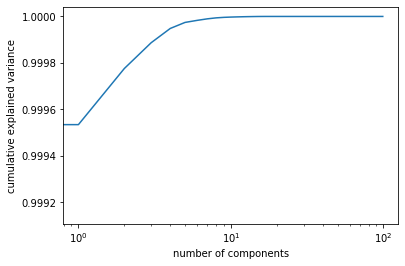

In [99]:
plt.semilogx(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

### Make Predictions

In [442]:
try:
    df = pd.read_csv('final_5pct_clean', index_col=0)
    
except:
    print('Warning: File not found; creating file...')
    
    df.to_csv('final_5pct_clean')

In [383]:
df.head()

,state,county,year,deaths,pop,QUANTITY,asian_female_0_4,asian_female_10_14,asian_female_15_19,asian_female_20_24,asian_female_25_29,asian_female_30_34,asian_female_35_39,asian_female_40_44,asian_female_45_49,asian_female_5_9,asian_female_50_54,asian_female_55_59,asian_female_60_64,asian_female_65_69,asian_female_70_74,asian_female_75_79,asian_female_80_84,asian_female_85+,asian_female_total,asian_male_0_4,asian_male_10_14,asian_male_15_19,asian_male_20_24,asian_male_25_29,asian_male_30_34,asian_male_35_39,asian_male_40_44,asian_male_45_49,asian_male_5_9,asian_male_50_54,asian_male_55_59,asian_male_60_64,asian_male_65_69,asian_male_70_74,asian_male_75_79,asian_male_80_84,asian_male_85+,asian_male_total,black_female_0_4,black_female_10_14,black_female_15_19,black_female_20_24,black_female_25_29,black_female_30_34,black_female_35_39,black_female_40_44,black_female_45_49,black_female_5_9,black_female_50_54,black_female_55_59,black_female_60_64,black_female_65_69,black_female_70_74,black_female_75_79,black_female_80_84,black_female_85+,black_female_total,black_male_0_4,black_male_10_14,black_male_15_19,black_male_20_24,black_male_25_29,black_male_30_34,black_male_35_39,black_male_40_44,black_male_45_49,black_male_5_9,black_male_50_54,black_male_55_59,black_male_60_64,black_male_65_69,black_male_70_74,black_male_75_79,black_male_80_84,black_male_85+,black_male_total,islander_female_0_4,islander_female_10_14,islander_female_15_19,islander_female_20_24,islander_female_25_29,islander_female_30_34,islander_female_35_39,islander_female_40_44,islander_female_45_49,islander_female_5_9,islander_female_50_54,islander_female_55_59,islander_female_60_64,islander_female_65_69,islander_female_70_74,islander_female_75_79,islander_female_80_84,islander_female_85+,islander_female_total,islander_male_0_4,islander_male_10_14,islander_male_15_19,islander_male_20_24,islander_male_25_29,islander_male_30_34,islander_male_35_39,islander_male_40_44,islander_male_45_49,islander_male_5_9,islander_male_50_54,islander_male_55_59,islander_male_60_64,islander_male_65_69,islander_male_70_74,islander_male_75_79,islander_male_80_84,islander_male_85+,islander_male_total,native_female_0_4,native_female_10_14,native_female_15_19,native_female_20_24,native_female_25_29,native_female_30_34,native_female_35_39,native_female_40_44,native_female_45_49,native_female_5_9,native_female_50_54,native_female_55_59,native_female_60_64,native_female_65_69,native_female_70_74,native_female_75_79,native_female_80_84,native_female_85+,native_female_total,native_male_0_4,native_male_10_14,native_male_15_19,native_male_20_24,native_male_25_29,native_male_30_34,native_male_35_39,native_male_40_44,native_male_45_49,native_male_5_9,native_male_50_54,native_male_55_59,native_male_60_64,native_male_65_69,native_male_70_74,native_male_75_79,native_male_80_84,native_male_85+,native_male_total,total_0_4,total_10_14,total_15_19,total_20_24,total_25_29,total_30_34,total_35_39,total_40_44,total_45_49,total_5_9,total_50_54,total_55_59,total_60_64,total_65_69,total_70_74,total_75_79,total_80_84,total_85+,total_pop_county,total_female_0_4,total_female_10_14,total_female_15_19,total_female_20_24,total_female_25_29,total_female_30_34,total_female_35_39,total_female_40_44,total_female_45_49,total_female_5_9,total_female_50_54,total_female_55_59,total_female_60_64,total_female_65_69,total_female_70_74,total_female_75_79,total_female_80_84,total_female_85+,total_female_pop_county,total_male_0_4,total_male_10_14,total_male_15_19,total_male_20_24,total_male_25_29,total_male_30_34,total_male_35_39,total_male_40_44,total_male_45_49,total_male_5_9,total_male_50_54,total_male_55_59,total_male_60_64,total_male_65_69,total_male_70_74,total_male_75_79,total_male_80_84,total_male_85+,total_male_pop_county,white_female_0_4,white_female_10_14,white_female_15_19,white_female_20_24,white_female_25_29,white_female_30_34,white_female_35_39,white_female_40_44,white_female_45_49,white_female_5_9,white_female_50_54,white_f

In [443]:
# drop death rate for now to avoid problems; we'll calculate it again later
df = df.drop('death_rate', axis=1)

In [385]:
df.head()

,state,county,year,deaths,pop,QUANTITY,asian_female_0_4,asian_female_10_14,asian_female_15_19,asian_female_20_24,asian_female_25_29,asian_female_30_34,asian_female_35_39,asian_female_40_44,asian_female_45_49,asian_female_5_9,asian_female_50_54,asian_female_55_59,asian_female_60_64,asian_female_65_69,asian_female_70_74,asian_female_75_79,asian_female_80_84,asian_female_85+,asian_female_total,asian_male_0_4,asian_male_10_14,asian_male_15_19,asian_male_20_24,asian_male_25_29,asian_male_30_34,asian_male_35_39,asian_male_40_44,asian_male_45_49,asian_male_5_9,asian_male_50_54,asian_male_55_59,asian_male_60_64,asian_male_65_69,asian_male_70_74,asian_male_75_79,asian_male_80_84,asian_male_85+,asian_male_total,black_female_0_4,black_female_10_14,black_female_15_19,black_female_20_24,black_female_25_29,black_female_30_34,black_female_35_39,black_female_40_44,black_female_45_49,black_female_5_9,black_female_50_54,black_female_55_59,black_female_60_64,black_female_65_69,black_female_70_74,black_female_75_79,black_female_80_84,black_female_85+,black_female_total,black_male_0_4,black_male_10_14,black_male_15_19,black_male_20_24,black_male_25_29,black_male_30_34,black_male_35_39,black_male_40_44,black_male_45_49,black_male_5_9,black_male_50_54,black_male_55_59,black_male_60_64,black_male_65_69,black_male_70_74,black_male_75_79,black_male_80_84,black_male_85+,black_male_total,islander_female_0_4,islander_female_10_14,islander_female_15_19,islander_female_20_24,islander_female_25_29,islander_female_30_34,islander_female_35_39,islander_female_40_44,islander_female_45_49,islander_female_5_9,islander_female_50_54,islander_female_55_59,islander_female_60_64,islander_female_65_69,islander_female_70_74,islander_female_75_79,islander_female_80_84,islander_female_85+,islander_female_total,islander_male_0_4,islander_male_10_14,islander_male_15_19,islander_male_20_24,islander_male_25_29,islander_male_30_34,islander_male_35_39,islander_male_40_44,islander_male_45_49,islander_male_5_9,islander_male_50_54,islander_male_55_59,islander_male_60_64,islander_male_65_69,islander_male_70_74,islander_male_75_79,islander_male_80_84,islander_male_85+,islander_male_total,native_female_0_4,native_female_10_14,native_female_15_19,native_female_20_24,native_female_25_29,native_female_30_34,native_female_35_39,native_female_40_44,native_female_45_49,native_female_5_9,native_female_50_54,native_female_55_59,native_female_60_64,native_female_65_69,native_female_70_74,native_female_75_79,native_female_80_84,native_female_85+,native_female_total,native_male_0_4,native_male_10_14,native_male_15_19,native_male_20_24,native_male_25_29,native_male_30_34,native_male_35_39,native_male_40_44,native_male_45_49,native_male_5_9,native_male_50_54,native_male_55_59,native_male_60_64,native_male_65_69,native_male_70_74,native_male_75_79,native_male_80_84,native_male_85+,native_male_total,total_0_4,total_10_14,total_15_19,total_20_24,total_25_29,total_30_34,total_35_39,total_40_44,total_45_49,total_5_9,total_50_54,total_55_59,total_60_64,total_65_69,total_70_74,total_75_79,total_80_84,total_85+,total_pop_county,total_female_0_4,total_female_10_14,total_female_15_19,total_female_20_24,total_female_25_29,total_female_30_34,total_female_35_39,total_female_40_44,total_female_45_49,total_female_5_9,total_female_50_54,total_female_55_59,total_female_60_64,total_female_65_69,total_female_70_74,total_female_75_79,total_female_80_84,total_female_85+,total_female_pop_county,total_male_0_4,total_male_10_14,total_male_15_19,total_male_20_24,total_male_25_29,total_male_30_34,total_male_35_39,total_male_40_44,total_male_45_49,total_male_5_9,total_male_50_54,total_male_55_59,total_male_60_64,total_male_65_69,total_male_70_74,total_male_75_79,total_male_80_84,total_male_85+,total_male_pop_county,white_female_0_4,white_female_10_14,white_female_15_19,white_female_20_24,white_female_25_29,white_female_30_34,white_female_35_39,white_female_40_44,white_female_45_49,white_female_5_9,white_female_50_54,white_f

In [444]:
df.shape

(17508, 254)

In [445]:
# use mask to create dataframe without Nan's in death column
notnans = df.notnull().all(axis=1)
df_notnans = df[notnans]
df_notnans.shape

(4270, 254)

In [446]:
# run best-performing model again 
targets = ['deaths']
drop_cols = ['year', 'state', 'county', 'QUANTITY']
df_drop = df_notnans.drop(drop_cols, axis=1)
features = [c for c in df_drop.columns if c not in targets]
X = df_drop[features]
y = df_drop[targets]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
reg = sklearn.linear_model.LinearRegression()
reg.fit(X_train, y_train)
print('Accuracy score on test set: {}'.format(reg.score(X_test, y_test)))
print('Accuracy score on training set: {}'.format(reg.score(X_train, y_train)))

Accuracy score on test set: 0.9081187125796347
Accuracy score on training set: 0.9141035058401221


In [212]:
# create function to make predictions with clipped values,
# in order to avoid negatives
def model_predict(model, X):
    predictions = reg.predict(X)
    predictions = pd.DataFrame(predictions, columns=["prediction"])
    predictions = predictions.clip(0)
    return predictions

In [424]:
y_pred = reg.predict(X_test)
y_pred = y_pred.clip(0)
reg.score(X_test, y_pred)

0.9990858411070002

In [425]:
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(y_test, y_pred)
mse

283.7323927772027

In [426]:
np.sqrt(mse)

16.844357891507848

In [427]:
from sklearn.metrics import mean_absolute_error
mean_absolute_error(y_test, y_pred)

11.488888441980755

In [428]:
#predict NaN's
df_nans = df.loc[~notnans].copy()
#df_nans[targets] = model_predict(reg, df_nans[features])
df_nans[targets] = reg.predict(df_nans[features])
df_nans[targets] = df_nans[targets].clip(0)
df_nans.head(30)

,state,county,year,deaths,pop,QUANTITY,asian_female_0_4,asian_female_10_14,asian_female_15_19,asian_female_20_24,asian_female_25_29,asian_female_30_34,asian_female_35_39,asian_female_40_44,asian_female_45_49,asian_female_5_9,asian_female_50_54,asian_female_55_59,asian_female_60_64,asian_female_65_69,asian_female_70_74,asian_female_75_79,asian_female_80_84,asian_female_85+,asian_female_total,asian_male_0_4,asian_male_10_14,asian_male_15_19,asian_male_20_24,asian_male_25_29,asian_male_30_34,asian_male_35_39,asian_male_40_44,asian_male_45_49,asian_male_5_9,asian_male_50_54,asian_male_55_59,asian_male_60_64,asian_male_65_69,asian_male_70_74,asian_male_75_79,asian_male_80_84,asian_male_85+,asian_male_total,black_female_0_4,black_female_10_14,black_female_15_19,black_female_20_24,black_female_25_29,black_female_30_34,black_female_35_39,black_female_40_44,black_female_45_49,black_female_5_9,black_female_50_54,black_female_55_59,black_female_60_64,black_female_65_69,black_female_70_74,black_female_75_79,black_female_80_84,black_female_85+,black_female_total,black_male_0_4,black_male_10_14,black_male_15_19,black_male_20_24,black_male_25_29,black_male_30_34,black_male_35_39,black_male_40_44,black_male_45_49,black_male_5_9,black_male_50_54,black_male_55_59,black_male_60_64,black_male_65_69,black_male_70_74,black_male_75_79,black_male_80_84,black_male_85+,black_male_total,islander_female_0_4,islander_female_10_14,islander_female_15_19,islander_female_20_24,islander_female_25_29,islander_female_30_34,islander_female_35_39,islander_female_40_44,islander_female_45_49,islander_female_5_9,islander_female_50_54,islander_female_55_59,islander_female_60_64,islander_female_65_69,islander_female_70_74,islander_female_75_79,islander_female_80_84,islander_female_85+,islander_female_total,islander_male_0_4,islander_male_10_14,islander_male_15_19,islander_male_20_24,islander_male_25_29,islander_male_30_34,islander_male_35_39,islander_male_40_44,islander_male_45_49,islander_male_5_9,islander_male_50_54,islander_male_55_59,islander_male_60_64,islander_male_65_69,islander_male_70_74,islander_male_75_79,islander_male_80_84,islander_male_85+,islander_male_total,native_female_0_4,native_female_10_14,native_female_15_19,native_female_20_24,native_female_25_29,native_female_30_34,native_female_35_39,native_female_40_44,native_female_45_49,native_female_5_9,native_female_50_54,native_female_55_59,native_female_60_64,native_female_65_69,native_female_70_74,native_female_75_79,native_female_80_84,native_female_85+,native_female_total,native_male_0_4,native_male_10_14,native_male_15_19,native_male_20_24,native_male_25_29,native_male_30_34,native_male_35_39,native_male_40_44,native_male_45_49,native_male_5_9,native_male_50_54,native_male_55_59,native_male_60_64,native_male_65_69,native_male_70_74,native_male_75_79,native_male_80_84,native_male_85+,native_male_total,total_0_4,total_10_14,total_15_19,total_20_24,total_25_29,total_30_34,total_35_39,total_40_44,total_45_49,total_5_9,total_50_54,total_55_59,total_60_64,total_65_69,total_70_74,total_75_79,total_80_84,total_85+,total_pop_county,total_female_0_4,total_female_10_14,total_female_15_19,total_female_20_24,total_female_25_29,total_female_30_34,total_female_35_39,total_female_40_44,total_female_45_49,total_female_5_9,total_female_50_54,total_female_55_59,total_female_60_64,total_female_65_69,total_female_70_74,total_female_75_79,total_female_80_84,total_female_85+,total_female_pop_county,total_male_0_4,total_male_10_14,total_male_15_19,total_male_20_24,total_male_25_29,total_male_30_34,total_male_35_39,total_male_40_44,total_male_45_49,total_male_5_9,total_male_50_54,total_male_55_59,total_male_60_64,total_male_65_69,total_male_70_74,total_male_75_79,total_male_80_84,total_male_85+,total_male_pop_county,white_female_0_4,white_female_10_14,white_female_15_19,white_female_20_24,white_female_25_29,white_female_30_34,white_female_35_39,white_female_40_44,white_female_45_49,white_female_5_9,white_female_50_54,white_f

In [429]:
reg.score(df_nans[features], df_nans[targets])

-0.4556468967774445

In [447]:
# try without clips
df_nans = df.loc[~notnans].copy()
df_nans[targets] = reg.predict(df_nans[features])
reg.score(df_nans[features], df_nans[targets])

1.0

In [218]:
df_nans.loc[df_nans.isna().any(axis=1)]

,state,county,year,deaths,pop,QUANTITY,asian_female_0_4,asian_female_10_14,asian_female_15_19,asian_female_20_24,asian_female_25_29,asian_female_30_34,asian_female_35_39,asian_female_40_44,asian_female_45_49,asian_female_5_9,asian_female_50_54,asian_female_55_59,asian_female_60_64,asian_female_65_69,asian_female_70_74,asian_female_75_79,asian_female_80_84,asian_female_85+,asian_female_total,asian_male_0_4,asian_male_10_14,asian_male_15_19,asian_male_20_24,asian_male_25_29,asian_male_30_34,asian_male_35_39,asian_male_40_44,asian_male_45_49,asian_male_5_9,asian_male_50_54,asian_male_55_59,asian_male_60_64,asian_male_65_69,asian_male_70_74,asian_male_75_79,asian_male_80_84,asian_male_85+,asian_male_total,black_female_0_4,black_female_10_14,black_female_15_19,black_female_20_24,black_female_25_29,black_female_30_34,black_female_35_39,black_female_40_44,black_female_45_49,black_female_5_9,black_female_50_54,black_female_55_59,black_female_60_64,black_female_65_69,black_female_70_74,black_female_75_79,black_female_80_84,black_female_85+,black_female_total,black_male_0_4,black_male_10_14,black_male_15_19,black_male_20_24,black_male_25_29,black_male_30_34,black_male_35_39,black_male_40_44,black_male_45_49,black_male_5_9,black_male_50_54,black_male_55_59,black_male_60_64,black_male_65_69,black_male_70_74,black_male_75_79,black_male_80_84,black_male_85+,black_male_total,islander_female_0_4,islander_female_10_14,islander_female_15_19,islander_female_20_24,islander_female_25_29,islander_female_30_34,islander_female_35_39,islander_female_40_44,islander_female_45_49,islander_female_5_9,islander_female_50_54,islander_female_55_59,islander_female_60_64,islander_female_65_69,islander_female_70_74,islander_female_75_79,islander_female_80_84,islander_female_85+,islander_female_total,islander_male_0_4,islander_male_10_14,islander_male_15_19,islander_male_20_24,islander_male_25_29,islander_male_30_34,islander_male_35_39,islander_male_40_44,islander_male_45_49,islander_male_5_9,islander_male_50_54,islander_male_55_59,islander_male_60_64,islander_male_65_69,islander_male_70_74,islander_male_75_79,islander_male_80_84,islander_male_85+,islander_male_total,native_female_0_4,native_female_10_14,native_female_15_19,native_female_20_24,native_female_25_29,native_female_30_34,native_female_35_39,native_female_40_44,native_female_45_49,native_female_5_9,native_female_50_54,native_female_55_59,native_female_60_64,native_female_65_69,native_female_70_74,native_female_75_79,native_female_80_84,native_female_85+,native_female_total,native_male_0_4,native_male_10_14,native_male_15_19,native_male_20_24,native_male_25_29,native_male_30_34,native_male_35_39,native_male_40_44,native_male_45_49,native_male_5_9,native_male_50_54,native_male_55_59,native_male_60_64,native_male_65_69,native_male_70_74,native_male_75_79,native_male_80_84,native_male_85+,native_male_total,total_0_4,total_10_14,total_15_19,total_20_24,total_25_29,total_30_34,total_35_39,total_40_44,total_45_49,total_5_9,total_50_54,total_55_59,total_60_64,total_65_69,total_70_74,total_75_79,total_80_84,total_85+,total_pop_county,total_female_0_4,total_female_10_14,total_female_15_19,total_female_20_24,total_female_25_29,total_female_30_34,total_female_35_39,total_female_40_44,total_female_45_49,total_female_5_9,total_female_50_54,total_female_55_59,total_female_60_64,total_female_65_69,total_female_70_74,total_female_75_79,total_female_80_84,total_female_85+,total_female_pop_county,total_male_0_4,total_male_10_14,total_male_15_19,total_male_20_24,total_male_25_29,total_male_30_34,total_male_35_39,total_male_40_44,total_male_45_49,total_male_5_9,total_male_50_54,total_male_55_59,total_male_60_64,total_male_65_69,total_male_70_74,total_male_75_79,total_male_80_84,total_male_85+,total_male_pop_county,white_female_0_4,white_female_10_14,white_female_15_19,white_female_20_24,white_female_25_29,white_female_30_34,white_female_35_39,white_female_40_44,white_female_45_49,white_female_5_9,white_female_50_54,white_f

In [219]:
# compare size to df_notnans, see if they add together to size of df
df_nans.shape

(13238, 254)

In [220]:
#merge together
merge_df = df_nans.merge(df_notnans, how='outer')
merge_df.head(30)

,state,county,year,deaths,pop,QUANTITY,asian_female_0_4,asian_female_10_14,asian_female_15_19,asian_female_20_24,asian_female_25_29,asian_female_30_34,asian_female_35_39,asian_female_40_44,asian_female_45_49,asian_female_5_9,asian_female_50_54,asian_female_55_59,asian_female_60_64,asian_female_65_69,asian_female_70_74,asian_female_75_79,asian_female_80_84,asian_female_85+,asian_female_total,asian_male_0_4,asian_male_10_14,asian_male_15_19,asian_male_20_24,asian_male_25_29,asian_male_30_34,asian_male_35_39,asian_male_40_44,asian_male_45_49,asian_male_5_9,asian_male_50_54,asian_male_55_59,asian_male_60_64,asian_male_65_69,asian_male_70_74,asian_male_75_79,asian_male_80_84,asian_male_85+,asian_male_total,black_female_0_4,black_female_10_14,black_female_15_19,black_female_20_24,black_female_25_29,black_female_30_34,black_female_35_39,black_female_40_44,black_female_45_49,black_female_5_9,black_female_50_54,black_female_55_59,black_female_60_64,black_female_65_69,black_female_70_74,black_female_75_79,black_female_80_84,black_female_85+,black_female_total,black_male_0_4,black_male_10_14,black_male_15_19,black_male_20_24,black_male_25_29,black_male_30_34,black_male_35_39,black_male_40_44,black_male_45_49,black_male_5_9,black_male_50_54,black_male_55_59,black_male_60_64,black_male_65_69,black_male_70_74,black_male_75_79,black_male_80_84,black_male_85+,black_male_total,islander_female_0_4,islander_female_10_14,islander_female_15_19,islander_female_20_24,islander_female_25_29,islander_female_30_34,islander_female_35_39,islander_female_40_44,islander_female_45_49,islander_female_5_9,islander_female_50_54,islander_female_55_59,islander_female_60_64,islander_female_65_69,islander_female_70_74,islander_female_75_79,islander_female_80_84,islander_female_85+,islander_female_total,islander_male_0_4,islander_male_10_14,islander_male_15_19,islander_male_20_24,islander_male_25_29,islander_male_30_34,islander_male_35_39,islander_male_40_44,islander_male_45_49,islander_male_5_9,islander_male_50_54,islander_male_55_59,islander_male_60_64,islander_male_65_69,islander_male_70_74,islander_male_75_79,islander_male_80_84,islander_male_85+,islander_male_total,native_female_0_4,native_female_10_14,native_female_15_19,native_female_20_24,native_female_25_29,native_female_30_34,native_female_35_39,native_female_40_44,native_female_45_49,native_female_5_9,native_female_50_54,native_female_55_59,native_female_60_64,native_female_65_69,native_female_70_74,native_female_75_79,native_female_80_84,native_female_85+,native_female_total,native_male_0_4,native_male_10_14,native_male_15_19,native_male_20_24,native_male_25_29,native_male_30_34,native_male_35_39,native_male_40_44,native_male_45_49,native_male_5_9,native_male_50_54,native_male_55_59,native_male_60_64,native_male_65_69,native_male_70_74,native_male_75_79,native_male_80_84,native_male_85+,native_male_total,total_0_4,total_10_14,total_15_19,total_20_24,total_25_29,total_30_34,total_35_39,total_40_44,total_45_49,total_5_9,total_50_54,total_55_59,total_60_64,total_65_69,total_70_74,total_75_79,total_80_84,total_85+,total_pop_county,total_female_0_4,total_female_10_14,total_female_15_19,total_female_20_24,total_female_25_29,total_female_30_34,total_female_35_39,total_female_40_44,total_female_45_49,total_female_5_9,total_female_50_54,total_female_55_59,total_female_60_64,total_female_65_69,total_female_70_74,total_female_75_79,total_female_80_84,total_female_85+,total_female_pop_county,total_male_0_4,total_male_10_14,total_male_15_19,total_male_20_24,total_male_25_29,total_male_30_34,total_male_35_39,total_male_40_44,total_male_45_49,total_male_5_9,total_male_50_54,total_male_55_59,total_male_60_64,total_male_65_69,total_male_70_74,total_male_75_79,total_male_80_84,total_male_85+,total_male_pop_county,white_female_0_4,white_female_10_14,white_female_15_19,white_female_20_24,white_female_25_29,white_female_30_34,white_female_35_39,white_female_40_44,white_female_45_49,white_female_5_9,white_female_50_54,white_f

In [222]:
#compare size of merge_df and original df
print(merge_df.shape)
print(df.shape)

(17508, 254)
(17508, 254)


In [223]:
#our merged dataframe has the same size as the original, so now we just have to sort
df_sort = merge_df.sort_values(['state', 'county', 'year'], ascending=True)
df_sort.head(40)

,state,county,year,deaths,pop,QUANTITY,asian_female_0_4,asian_female_10_14,asian_female_15_19,asian_female_20_24,asian_female_25_29,asian_female_30_34,asian_female_35_39,asian_female_40_44,asian_female_45_49,asian_female_5_9,asian_female_50_54,asian_female_55_59,asian_female_60_64,asian_female_65_69,asian_female_70_74,asian_female_75_79,asian_female_80_84,asian_female_85+,asian_female_total,asian_male_0_4,asian_male_10_14,asian_male_15_19,asian_male_20_24,asian_male_25_29,asian_male_30_34,asian_male_35_39,asian_male_40_44,asian_male_45_49,asian_male_5_9,asian_male_50_54,asian_male_55_59,asian_male_60_64,asian_male_65_69,asian_male_70_74,asian_male_75_79,asian_male_80_84,asian_male_85+,asian_male_total,black_female_0_4,black_female_10_14,black_female_15_19,black_female_20_24,black_female_25_29,black_female_30_34,black_female_35_39,black_female_40_44,black_female_45_49,black_female_5_9,black_female_50_54,black_female_55_59,black_female_60_64,black_female_65_69,black_female_70_74,black_female_75_79,black_female_80_84,black_female_85+,black_female_total,black_male_0_4,black_male_10_14,black_male_15_19,black_male_20_24,black_male_25_29,black_male_30_34,black_male_35_39,black_male_40_44,black_male_45_49,black_male_5_9,black_male_50_54,black_male_55_59,black_male_60_64,black_male_65_69,black_male_70_74,black_male_75_79,black_male_80_84,black_male_85+,black_male_total,islander_female_0_4,islander_female_10_14,islander_female_15_19,islander_female_20_24,islander_female_25_29,islander_female_30_34,islander_female_35_39,islander_female_40_44,islander_female_45_49,islander_female_5_9,islander_female_50_54,islander_female_55_59,islander_female_60_64,islander_female_65_69,islander_female_70_74,islander_female_75_79,islander_female_80_84,islander_female_85+,islander_female_total,islander_male_0_4,islander_male_10_14,islander_male_15_19,islander_male_20_24,islander_male_25_29,islander_male_30_34,islander_male_35_39,islander_male_40_44,islander_male_45_49,islander_male_5_9,islander_male_50_54,islander_male_55_59,islander_male_60_64,islander_male_65_69,islander_male_70_74,islander_male_75_79,islander_male_80_84,islander_male_85+,islander_male_total,native_female_0_4,native_female_10_14,native_female_15_19,native_female_20_24,native_female_25_29,native_female_30_34,native_female_35_39,native_female_40_44,native_female_45_49,native_female_5_9,native_female_50_54,native_female_55_59,native_female_60_64,native_female_65_69,native_female_70_74,native_female_75_79,native_female_80_84,native_female_85+,native_female_total,native_male_0_4,native_male_10_14,native_male_15_19,native_male_20_24,native_male_25_29,native_male_30_34,native_male_35_39,native_male_40_44,native_male_45_49,native_male_5_9,native_male_50_54,native_male_55_59,native_male_60_64,native_male_65_69,native_male_70_74,native_male_75_79,native_male_80_84,native_male_85+,native_male_total,total_0_4,total_10_14,total_15_19,total_20_24,total_25_29,total_30_34,total_35_39,total_40_44,total_45_49,total_5_9,total_50_54,total_55_59,total_60_64,total_65_69,total_70_74,total_75_79,total_80_84,total_85+,total_pop_county,total_female_0_4,total_female_10_14,total_female_15_19,total_female_20_24,total_female_25_29,total_female_30_34,total_female_35_39,total_female_40_44,total_female_45_49,total_female_5_9,total_female_50_54,total_female_55_59,total_female_60_64,total_female_65_69,total_female_70_74,total_female_75_79,total_female_80_84,total_female_85+,total_female_pop_county,total_male_0_4,total_male_10_14,total_male_15_19,total_male_20_24,total_male_25_29,total_male_30_34,total_male_35_39,total_male_40_44,total_male_45_49,total_male_5_9,total_male_50_54,total_male_55_59,total_male_60_64,total_male_65_69,total_male_70_74,total_male_75_79,total_male_80_84,total_male_85+,total_male_pop_county,white_female_0_4,white_female_10_14,white_female_15_19,white_female_20_24,white_female_25_29,white_female_30_34,white_female_35_39,white_female_40_44,white_female_45_49,white_female_5_9,white_female_50_54,white_f

In [224]:
#reset index
df_sort = df_sort.reset_index(drop=True)
df_sort.head(30)

,state,county,year,deaths,pop,QUANTITY,asian_female_0_4,asian_female_10_14,asian_female_15_19,asian_female_20_24,asian_female_25_29,asian_female_30_34,asian_female_35_39,asian_female_40_44,asian_female_45_49,asian_female_5_9,asian_female_50_54,asian_female_55_59,asian_female_60_64,asian_female_65_69,asian_female_70_74,asian_female_75_79,asian_female_80_84,asian_female_85+,asian_female_total,asian_male_0_4,asian_male_10_14,asian_male_15_19,asian_male_20_24,asian_male_25_29,asian_male_30_34,asian_male_35_39,asian_male_40_44,asian_male_45_49,asian_male_5_9,asian_male_50_54,asian_male_55_59,asian_male_60_64,asian_male_65_69,asian_male_70_74,asian_male_75_79,asian_male_80_84,asian_male_85+,asian_male_total,black_female_0_4,black_female_10_14,black_female_15_19,black_female_20_24,black_female_25_29,black_female_30_34,black_female_35_39,black_female_40_44,black_female_45_49,black_female_5_9,black_female_50_54,black_female_55_59,black_female_60_64,black_female_65_69,black_female_70_74,black_female_75_79,black_female_80_84,black_female_85+,black_female_total,black_male_0_4,black_male_10_14,black_male_15_19,black_male_20_24,black_male_25_29,black_male_30_34,black_male_35_39,black_male_40_44,black_male_45_49,black_male_5_9,black_male_50_54,black_male_55_59,black_male_60_64,black_male_65_69,black_male_70_74,black_male_75_79,black_male_80_84,black_male_85+,black_male_total,islander_female_0_4,islander_female_10_14,islander_female_15_19,islander_female_20_24,islander_female_25_29,islander_female_30_34,islander_female_35_39,islander_female_40_44,islander_female_45_49,islander_female_5_9,islander_female_50_54,islander_female_55_59,islander_female_60_64,islander_female_65_69,islander_female_70_74,islander_female_75_79,islander_female_80_84,islander_female_85+,islander_female_total,islander_male_0_4,islander_male_10_14,islander_male_15_19,islander_male_20_24,islander_male_25_29,islander_male_30_34,islander_male_35_39,islander_male_40_44,islander_male_45_49,islander_male_5_9,islander_male_50_54,islander_male_55_59,islander_male_60_64,islander_male_65_69,islander_male_70_74,islander_male_75_79,islander_male_80_84,islander_male_85+,islander_male_total,native_female_0_4,native_female_10_14,native_female_15_19,native_female_20_24,native_female_25_29,native_female_30_34,native_female_35_39,native_female_40_44,native_female_45_49,native_female_5_9,native_female_50_54,native_female_55_59,native_female_60_64,native_female_65_69,native_female_70_74,native_female_75_79,native_female_80_84,native_female_85+,native_female_total,native_male_0_4,native_male_10_14,native_male_15_19,native_male_20_24,native_male_25_29,native_male_30_34,native_male_35_39,native_male_40_44,native_male_45_49,native_male_5_9,native_male_50_54,native_male_55_59,native_male_60_64,native_male_65_69,native_male_70_74,native_male_75_79,native_male_80_84,native_male_85+,native_male_total,total_0_4,total_10_14,total_15_19,total_20_24,total_25_29,total_30_34,total_35_39,total_40_44,total_45_49,total_5_9,total_50_54,total_55_59,total_60_64,total_65_69,total_70_74,total_75_79,total_80_84,total_85+,total_pop_county,total_female_0_4,total_female_10_14,total_female_15_19,total_female_20_24,total_female_25_29,total_female_30_34,total_female_35_39,total_female_40_44,total_female_45_49,total_female_5_9,total_female_50_54,total_female_55_59,total_female_60_64,total_female_65_69,total_female_70_74,total_female_75_79,total_female_80_84,total_female_85+,total_female_pop_county,total_male_0_4,total_male_10_14,total_male_15_19,total_male_20_24,total_male_25_29,total_male_30_34,total_male_35_39,total_male_40_44,total_male_45_49,total_male_5_9,total_male_50_54,total_male_55_59,total_male_60_64,total_male_65_69,total_male_70_74,total_male_75_79,total_male_80_84,total_male_85+,total_male_pop_county,white_female_0_4,white_female_10_14,white_female_15_19,white_female_20_24,white_female_25_29,white_female_30_34,white_female_35_39,white_female_40_44,white_female_45_49,white_female_5_9,white_female_50_54,white_f

In [225]:
try:
    df = pd.read_csv('opioids_linreg_with_predictions.csv', index_col=0)
    
except:
    print('Warning: File not found; creating file...')
    df = df_sort
    df.to_csv('opioids_linreg_with_predictions.csv')

In [226]:
df_nan = df.loc[df.isnull().any(axis=1)]
df_nan

,state,county,year,deaths,pop,QUANTITY,asian_female_0_4,asian_female_10_14,asian_female_15_19,asian_female_20_24,asian_female_25_29,asian_female_30_34,asian_female_35_39,asian_female_40_44,asian_female_45_49,asian_female_5_9,asian_female_50_54,asian_female_55_59,asian_female_60_64,asian_female_65_69,asian_female_70_74,asian_female_75_79,asian_female_80_84,asian_female_85+,asian_female_total,asian_male_0_4,asian_male_10_14,asian_male_15_19,asian_male_20_24,asian_male_25_29,asian_male_30_34,asian_male_35_39,asian_male_40_44,asian_male_45_49,asian_male_5_9,asian_male_50_54,asian_male_55_59,asian_male_60_64,asian_male_65_69,asian_male_70_74,asian_male_75_79,asian_male_80_84,asian_male_85+,asian_male_total,black_female_0_4,black_female_10_14,black_female_15_19,black_female_20_24,black_female_25_29,black_female_30_34,black_female_35_39,black_female_40_44,black_female_45_49,black_female_5_9,black_female_50_54,black_female_55_59,black_female_60_64,black_female_65_69,black_female_70_74,black_female_75_79,black_female_80_84,black_female_85+,black_female_total,black_male_0_4,black_male_10_14,black_male_15_19,black_male_20_24,black_male_25_29,black_male_30_34,black_male_35_39,black_male_40_44,black_male_45_49,black_male_5_9,black_male_50_54,black_male_55_59,black_male_60_64,black_male_65_69,black_male_70_74,black_male_75_79,black_male_80_84,black_male_85+,black_male_total,islander_female_0_4,islander_female_10_14,islander_female_15_19,islander_female_20_24,islander_female_25_29,islander_female_30_34,islander_female_35_39,islander_female_40_44,islander_female_45_49,islander_female_5_9,islander_female_50_54,islander_female_55_59,islander_female_60_64,islander_female_65_69,islander_female_70_74,islander_female_75_79,islander_female_80_84,islander_female_85+,islander_female_total,islander_male_0_4,islander_male_10_14,islander_male_15_19,islander_male_20_24,islander_male_25_29,islander_male_30_34,islander_male_35_39,islander_male_40_44,islander_male_45_49,islander_male_5_9,islander_male_50_54,islander_male_55_59,islander_male_60_64,islander_male_65_69,islander_male_70_74,islander_male_75_79,islander_male_80_84,islander_male_85+,islander_male_total,native_female_0_4,native_female_10_14,native_female_15_19,native_female_20_24,native_female_25_29,native_female_30_34,native_female_35_39,native_female_40_44,native_female_45_49,native_female_5_9,native_female_50_54,native_female_55_59,native_female_60_64,native_female_65_69,native_female_70_74,native_female_75_79,native_female_80_84,native_female_85+,native_female_total,native_male_0_4,native_male_10_14,native_male_15_19,native_male_20_24,native_male_25_29,native_male_30_34,native_male_35_39,native_male_40_44,native_male_45_49,native_male_5_9,native_male_50_54,native_male_55_59,native_male_60_64,native_male_65_69,native_male_70_74,native_male_75_79,native_male_80_84,native_male_85+,native_male_total,total_0_4,total_10_14,total_15_19,total_20_24,total_25_29,total_30_34,total_35_39,total_40_44,total_45_49,total_5_9,total_50_54,total_55_59,total_60_64,total_65_69,total_70_74,total_75_79,total_80_84,total_85+,total_pop_county,total_female_0_4,total_female_10_14,total_female_15_19,total_female_20_24,total_female_25_29,total_female_30_34,total_female_35_39,total_female_40_44,total_female_45_49,total_female_5_9,total_female_50_54,total_female_55_59,total_female_60_64,total_female_65_69,total_female_70_74,total_female_75_79,total_female_80_84,total_female_85+,total_female_pop_county,total_male_0_4,total_male_10_14,total_male_15_19,total_male_20_24,total_male_25_29,total_male_30_34,total_male_35_39,total_male_40_44,total_male_45_49,total_male_5_9,total_male_50_54,total_male_55_59,total_male_60_64,total_male_65_69,total_male_70_74,total_male_75_79,total_male_80_84,total_male_85+,total_male_pop_county,white_female_0_4,white_female_10_14,white_female_15_19,white_female_20_24,white_female_25_29,white_female_30_34,white_female_35_39,white_female_40_44,white_female_45_49,white_female_5_9,white_female_50_54,white_f

In [227]:
df.shape

(17508, 254)

In [228]:
# calculate death rate and pain ratio
df['death_rate'] = df['deaths'] / df['pop']
df['pain_ratio'] = df['death_rate'] / df['prescription_rate']

In [229]:
df.head()

,state,county,year,deaths,pop,QUANTITY,asian_female_0_4,asian_female_10_14,asian_female_15_19,asian_female_20_24,asian_female_25_29,asian_female_30_34,asian_female_35_39,asian_female_40_44,asian_female_45_49,asian_female_5_9,asian_female_50_54,asian_female_55_59,asian_female_60_64,asian_female_65_69,asian_female_70_74,asian_female_75_79,asian_female_80_84,asian_female_85+,asian_female_total,asian_male_0_4,asian_male_10_14,asian_male_15_19,asian_male_20_24,asian_male_25_29,asian_male_30_34,asian_male_35_39,asian_male_40_44,asian_male_45_49,asian_male_5_9,asian_male_50_54,asian_male_55_59,asian_male_60_64,asian_male_65_69,asian_male_70_74,asian_male_75_79,asian_male_80_84,asian_male_85+,asian_male_total,black_female_0_4,black_female_10_14,black_female_15_19,black_female_20_24,black_female_25_29,black_female_30_34,black_female_35_39,black_female_40_44,black_female_45_49,black_female_5_9,black_female_50_54,black_female_55_59,black_female_60_64,black_female_65_69,black_female_70_74,black_female_75_79,black_female_80_84,black_female_85+,black_female_total,black_male_0_4,black_male_10_14,black_male_15_19,black_male_20_24,black_male_25_29,black_male_30_34,black_male_35_39,black_male_40_44,black_male_45_49,black_male_5_9,black_male_50_54,black_male_55_59,black_male_60_64,black_male_65_69,black_male_70_74,black_male_75_79,black_male_80_84,black_male_85+,black_male_total,islander_female_0_4,islander_female_10_14,islander_female_15_19,islander_female_20_24,islander_female_25_29,islander_female_30_34,islander_female_35_39,islander_female_40_44,islander_female_45_49,islander_female_5_9,islander_female_50_54,islander_female_55_59,islander_female_60_64,islander_female_65_69,islander_female_70_74,islander_female_75_79,islander_female_80_84,islander_female_85+,islander_female_total,islander_male_0_4,islander_male_10_14,islander_male_15_19,islander_male_20_24,islander_male_25_29,islander_male_30_34,islander_male_35_39,islander_male_40_44,islander_male_45_49,islander_male_5_9,islander_male_50_54,islander_male_55_59,islander_male_60_64,islander_male_65_69,islander_male_70_74,islander_male_75_79,islander_male_80_84,islander_male_85+,islander_male_total,native_female_0_4,native_female_10_14,native_female_15_19,native_female_20_24,native_female_25_29,native_female_30_34,native_female_35_39,native_female_40_44,native_female_45_49,native_female_5_9,native_female_50_54,native_female_55_59,native_female_60_64,native_female_65_69,native_female_70_74,native_female_75_79,native_female_80_84,native_female_85+,native_female_total,native_male_0_4,native_male_10_14,native_male_15_19,native_male_20_24,native_male_25_29,native_male_30_34,native_male_35_39,native_male_40_44,native_male_45_49,native_male_5_9,native_male_50_54,native_male_55_59,native_male_60_64,native_male_65_69,native_male_70_74,native_male_75_79,native_male_80_84,native_male_85+,native_male_total,total_0_4,total_10_14,total_15_19,total_20_24,total_25_29,total_30_34,total_35_39,total_40_44,total_45_49,total_5_9,total_50_54,total_55_59,total_60_64,total_65_69,total_70_74,total_75_79,total_80_84,total_85+,total_pop_county,total_female_0_4,total_female_10_14,total_female_15_19,total_female_20_24,total_female_25_29,total_female_30_34,total_female_35_39,total_female_40_44,total_female_45_49,total_female_5_9,total_female_50_54,total_female_55_59,total_female_60_64,total_female_65_69,total_female_70_74,total_female_75_79,total_female_80_84,total_female_85+,total_female_pop_county,total_male_0_4,total_male_10_14,total_male_15_19,total_male_20_24,total_male_25_29,total_male_30_34,total_male_35_39,total_male_40_44,total_male_45_49,total_male_5_9,total_male_50_54,total_male_55_59,total_male_60_64,total_male_65_69,total_male_70_74,total_male_75_79,total_male_80_84,total_male_85+,total_male_pop_county,white_female_0_4,white_female_10_14,white_female_15_19,white_female_20_24,white_female_25_29,white_female_30_34,white_female_35_39,white_female_40_44,white_female_45_49,white_female_5_9,white_female_50_54,white_f

In [244]:
df.describe(include='all')

,state,county,year,deaths,pop,QUANTITY,asian_female_0_4,asian_female_10_14,asian_female_15_19,asian_female_20_24,asian_female_25_29,asian_female_30_34,asian_female_35_39,asian_female_40_44,asian_female_45_49,asian_female_5_9,asian_female_50_54,asian_female_55_59,asian_female_60_64,asian_female_65_69,asian_female_70_74,asian_female_75_79,asian_female_80_84,asian_female_85+,asian_female_total,asian_male_0_4,asian_male_10_14,asian_male_15_19,asian_male_20_24,asian_male_25_29,asian_male_30_34,asian_male_35_39,asian_male_40_44,asian_male_45_49,asian_male_5_9,asian_male_50_54,asian_male_55_59,asian_male_60_64,asian_male_65_69,asian_male_70_74,asian_male_75_79,asian_male_80_84,asian_male_85+,asian_male_total,black_female_0_4,black_female_10_14,black_female_15_19,black_female_20_24,black_female_25_29,black_female_30_34,black_female_35_39,black_female_40_44,black_female_45_49,black_female_5_9,black_female_50_54,black_female_55_59,black_female_60_64,black_female_65_69,black_female_70_74,black_female_75_79,black_female_80_84,black_female_85+,black_female_total,black_male_0_4,black_male_10_14,black_male_15_19,black_male_20_24,black_male_25_29,black_male_30_34,black_male_35_39,black_male_40_44,black_male_45_49,black_male_5_9,black_male_50_54,black_male_55_59,black_male_60_64,black_male_65_69,black_male_70_74,black_male_75_79,black_male_80_84,black_male_85+,black_male_total,islander_female_0_4,islander_female_10_14,islander_female_15_19,islander_female_20_24,islander_female_25_29,islander_female_30_34,islander_female_35_39,islander_female_40_44,islander_female_45_49,islander_female_5_9,islander_female_50_54,islander_female_55_59,islander_female_60_64,islander_female_65_69,islander_female_70_74,islander_female_75_79,islander_female_80_84,islander_female_85+,islander_female_total,islander_male_0_4,islander_male_10_14,islander_male_15_19,islander_male_20_24,islander_male_25_29,islander_male_30_34,islander_male_35_39,islander_male_40_44,islander_male_45_49,islander_male_5_9,islander_male_50_54,islander_male_55_59,islander_male_60_64,islander_male_65_69,islander_male_70_74,islander_male_75_79,islander_male_80_84,islander_male_85+,islander_male_total,native_female_0_4,native_female_10_14,native_female_15_19,native_female_20_24,native_female_25_29,native_female_30_34,native_female_35_39,native_female_40_44,native_female_45_49,native_female_5_9,native_female_50_54,native_female_55_59,native_female_60_64,native_female_65_69,native_female_70_74,native_female_75_79,native_female_80_84,native_female_85+,native_female_total,native_male_0_4,native_male_10_14,native_male_15_19,native_male_20_24,native_male_25_29,native_male_30_34,native_male_35_39,native_male_40_44,native_male_45_49,native_male_5_9,native_male_50_54,native_male_55_59,native_male_60_64,native_male_65_69,native_male_70_74,native_male_75_79,native_male_80_84,native_male_85+,native_male_total,total_0_4,total_10_14,total_15_19,total_20_24,total_25_29,total_30_34,total_35_39,total_40_44,total_45_49,total_5_9,total_50_54,total_55_59,total_60_64,total_65_69,total_70_74,total_75_79,total_80_84,total_85+,total_pop_county,total_female_0_4,total_female_10_14,total_female_15_19,total_female_20_24,total_female_25_29,total_female_30_34,total_female_35_39,total_female_40_44,total_female_45_49,total_female_5_9,total_female_50_54,total_female_55_59,total_female_60_64,total_female_65_69,total_female_70_74,total_female_75_79,total_female_80_84,total_female_85+,total_female_pop_county,total_male_0_4,total_male_10_14,total_male_15_19,total_male_20_24,total_male_25_29,total_male_30_34,total_male_35_39,total_male_40_44,total_male_45_49,total_male_5_9,total_male_50_54,total_male_55_59,total_male_60_64,total_male_65_69,total_male_70_74,total_male_75_79,total_male_80_84,total_male_85+,total_male_pop_county,white_female_0_4,white_female_10_14,white_female_15_19,white_female_20_24,white_female_25_29,white_female_30_34,white_female_35_39,white_female_40_44,white_female_45_49,white_female_5_9,white_female_50_54,white_f

In [439]:
df_notnans['death_rate'] = df_notnans['deaths'] / df_notnans['pop']
df_notnans['pain_ratio'] = df_notnans['death_rate'] / df_notnans['prescription_rate']
df_notnans.describe(include='all')

,state,county,year,deaths,pop,QUANTITY,asian_female_0_4,asian_female_10_14,asian_female_15_19,asian_female_20_24,asian_female_25_29,asian_female_30_34,asian_female_35_39,asian_female_40_44,asian_female_45_49,asian_female_5_9,asian_female_50_54,asian_female_55_59,asian_female_60_64,asian_female_65_69,asian_female_70_74,asian_female_75_79,asian_female_80_84,asian_female_85+,asian_female_total,asian_male_0_4,asian_male_10_14,asian_male_15_19,asian_male_20_24,asian_male_25_29,asian_male_30_34,asian_male_35_39,asian_male_40_44,asian_male_45_49,asian_male_5_9,asian_male_50_54,asian_male_55_59,asian_male_60_64,asian_male_65_69,asian_male_70_74,asian_male_75_79,asian_male_80_84,asian_male_85+,asian_male_total,black_female_0_4,black_female_10_14,black_female_15_19,black_female_20_24,black_female_25_29,black_female_30_34,black_female_35_39,black_female_40_44,black_female_45_49,black_female_5_9,black_female_50_54,black_female_55_59,black_female_60_64,black_female_65_69,black_female_70_74,black_female_75_79,black_female_80_84,black_female_85+,black_female_total,black_male_0_4,black_male_10_14,black_male_15_19,black_male_20_24,black_male_25_29,black_male_30_34,black_male_35_39,black_male_40_44,black_male_45_49,black_male_5_9,black_male_50_54,black_male_55_59,black_male_60_64,black_male_65_69,black_male_70_74,black_male_75_79,black_male_80_84,black_male_85+,black_male_total,islander_female_0_4,islander_female_10_14,islander_female_15_19,islander_female_20_24,islander_female_25_29,islander_female_30_34,islander_female_35_39,islander_female_40_44,islander_female_45_49,islander_female_5_9,islander_female_50_54,islander_female_55_59,islander_female_60_64,islander_female_65_69,islander_female_70_74,islander_female_75_79,islander_female_80_84,islander_female_85+,islander_female_total,islander_male_0_4,islander_male_10_14,islander_male_15_19,islander_male_20_24,islander_male_25_29,islander_male_30_34,islander_male_35_39,islander_male_40_44,islander_male_45_49,islander_male_5_9,islander_male_50_54,islander_male_55_59,islander_male_60_64,islander_male_65_69,islander_male_70_74,islander_male_75_79,islander_male_80_84,islander_male_85+,islander_male_total,native_female_0_4,native_female_10_14,native_female_15_19,native_female_20_24,native_female_25_29,native_female_30_34,native_female_35_39,native_female_40_44,native_female_45_49,native_female_5_9,native_female_50_54,native_female_55_59,native_female_60_64,native_female_65_69,native_female_70_74,native_female_75_79,native_female_80_84,native_female_85+,native_female_total,native_male_0_4,native_male_10_14,native_male_15_19,native_male_20_24,native_male_25_29,native_male_30_34,native_male_35_39,native_male_40_44,native_male_45_49,native_male_5_9,native_male_50_54,native_male_55_59,native_male_60_64,native_male_65_69,native_male_70_74,native_male_75_79,native_male_80_84,native_male_85+,native_male_total,total_0_4,total_10_14,total_15_19,total_20_24,total_25_29,total_30_34,total_35_39,total_40_44,total_45_49,total_5_9,total_50_54,total_55_59,total_60_64,total_65_69,total_70_74,total_75_79,total_80_84,total_85+,total_pop_county,total_female_0_4,total_female_10_14,total_female_15_19,total_female_20_24,total_female_25_29,total_female_30_34,total_female_35_39,total_female_40_44,total_female_45_49,total_female_5_9,total_female_50_54,total_female_55_59,total_female_60_64,total_female_65_69,total_female_70_74,total_female_75_79,total_female_80_84,total_female_85+,total_female_pop_county,total_male_0_4,total_male_10_14,total_male_15_19,total_male_20_24,total_male_25_29,total_male_30_34,total_male_35_39,total_male_40_44,total_male_45_49,total_male_5_9,total_male_50_54,total_male_55_59,total_male_60_64,total_male_65_69,total_male_70_74,total_male_75_79,total_male_80_84,total_male_85+,total_male_pop_county,white_female_0_4,white_female_10_14,white_female_15_19,white_female_20_24,white_female_25_29,white_female_30_34,white_female_35_39,white_female_40_44,white_female_45_49,white_female_5_9,white_female_50_54,white_f

### Try Model with Lasso

I'm going to try a model with Lasso, in order to ensure positive values

In [409]:
df = pd.read_csv('final_5pct_clean', index_col=0)
df = df.drop('death_rate', axis=1)

In [410]:
notnans = df.notnull().all(axis=1)
df_notnans = df[notnans]
targets = ['deaths']
drop_cols = ['year', 'state', 'county', 'QUANTITY']
df_drop = df_notnans.drop(drop_cols, axis=1)
features = [c for c in df_drop.columns if c not in targets]
X = df_drop[features]
y = df_drop[targets]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
lasso = Lasso(alpha=0.001, normalize=True, positive=True, max_iter=100000, fit_intercept=False)
lasso.fit(X_train, y_train)
print('Accuracy score on test set: {}'.format(lasso.score(X_test, y_test)))
print('Accuracy score on training set: {}'.format(lasso.score(X_train, y_train)))
print('Y-intercept is: {}'.format(lasso.intercept_))

Accuracy score on test set: 0.8009495700938556
Accuracy score on training set: 0.8133144769852468
Y-intercept is: 0.0


In [412]:
y_pred = lasso.predict(X_test)
mean_squared_error(y_test, y_pred)

630.9870486161724

In [416]:
np.sqrt(mean_squared_error(y_test, y_pred))

25.119455579613433

In [415]:
mean_absolute_error(y_test, y_pred)

13.030276165531294

In [417]:
df_nans = df.loc[~notnans].copy()
df_nans[targets] = lasso.predict(df_nans[features])
df_nans.head(40)

,state,county,year,deaths,pop,QUANTITY,asian_female_0_4,asian_female_10_14,asian_female_15_19,asian_female_20_24,asian_female_25_29,asian_female_30_34,asian_female_35_39,asian_female_40_44,asian_female_45_49,asian_female_5_9,asian_female_50_54,asian_female_55_59,asian_female_60_64,asian_female_65_69,asian_female_70_74,asian_female_75_79,asian_female_80_84,asian_female_85+,asian_female_total,asian_male_0_4,asian_male_10_14,asian_male_15_19,asian_male_20_24,asian_male_25_29,asian_male_30_34,asian_male_35_39,asian_male_40_44,asian_male_45_49,asian_male_5_9,asian_male_50_54,asian_male_55_59,asian_male_60_64,asian_male_65_69,asian_male_70_74,asian_male_75_79,asian_male_80_84,asian_male_85+,asian_male_total,black_female_0_4,black_female_10_14,black_female_15_19,black_female_20_24,black_female_25_29,black_female_30_34,black_female_35_39,black_female_40_44,black_female_45_49,black_female_5_9,black_female_50_54,black_female_55_59,black_female_60_64,black_female_65_69,black_female_70_74,black_female_75_79,black_female_80_84,black_female_85+,black_female_total,black_male_0_4,black_male_10_14,black_male_15_19,black_male_20_24,black_male_25_29,black_male_30_34,black_male_35_39,black_male_40_44,black_male_45_49,black_male_5_9,black_male_50_54,black_male_55_59,black_male_60_64,black_male_65_69,black_male_70_74,black_male_75_79,black_male_80_84,black_male_85+,black_male_total,islander_female_0_4,islander_female_10_14,islander_female_15_19,islander_female_20_24,islander_female_25_29,islander_female_30_34,islander_female_35_39,islander_female_40_44,islander_female_45_49,islander_female_5_9,islander_female_50_54,islander_female_55_59,islander_female_60_64,islander_female_65_69,islander_female_70_74,islander_female_75_79,islander_female_80_84,islander_female_85+,islander_female_total,islander_male_0_4,islander_male_10_14,islander_male_15_19,islander_male_20_24,islander_male_25_29,islander_male_30_34,islander_male_35_39,islander_male_40_44,islander_male_45_49,islander_male_5_9,islander_male_50_54,islander_male_55_59,islander_male_60_64,islander_male_65_69,islander_male_70_74,islander_male_75_79,islander_male_80_84,islander_male_85+,islander_male_total,native_female_0_4,native_female_10_14,native_female_15_19,native_female_20_24,native_female_25_29,native_female_30_34,native_female_35_39,native_female_40_44,native_female_45_49,native_female_5_9,native_female_50_54,native_female_55_59,native_female_60_64,native_female_65_69,native_female_70_74,native_female_75_79,native_female_80_84,native_female_85+,native_female_total,native_male_0_4,native_male_10_14,native_male_15_19,native_male_20_24,native_male_25_29,native_male_30_34,native_male_35_39,native_male_40_44,native_male_45_49,native_male_5_9,native_male_50_54,native_male_55_59,native_male_60_64,native_male_65_69,native_male_70_74,native_male_75_79,native_male_80_84,native_male_85+,native_male_total,total_0_4,total_10_14,total_15_19,total_20_24,total_25_29,total_30_34,total_35_39,total_40_44,total_45_49,total_5_9,total_50_54,total_55_59,total_60_64,total_65_69,total_70_74,total_75_79,total_80_84,total_85+,total_pop_county,total_female_0_4,total_female_10_14,total_female_15_19,total_female_20_24,total_female_25_29,total_female_30_34,total_female_35_39,total_female_40_44,total_female_45_49,total_female_5_9,total_female_50_54,total_female_55_59,total_female_60_64,total_female_65_69,total_female_70_74,total_female_75_79,total_female_80_84,total_female_85+,total_female_pop_county,total_male_0_4,total_male_10_14,total_male_15_19,total_male_20_24,total_male_25_29,total_male_30_34,total_male_35_39,total_male_40_44,total_male_45_49,total_male_5_9,total_male_50_54,total_male_55_59,total_male_60_64,total_male_65_69,total_male_70_74,total_male_75_79,total_male_80_84,total_male_85+,total_male_pop_county,white_female_0_4,white_female_10_14,white_female_15_19,white_female_20_24,white_female_25_29,white_female_30_34,white_female_35_39,white_female_40_44,white_female_45_49,white_female_5_9,white_female_50_54,white_f

In [418]:
lasso.score(df_nans[features], df_nans[targets])

1.0

In [282]:
merge_df = df_nans.merge(df_notnans, how='outer')
merge_df.head(30)

,state,county,year,deaths,pop,QUANTITY,asian_female_0_4,asian_female_10_14,asian_female_15_19,asian_female_20_24,asian_female_25_29,asian_female_30_34,asian_female_35_39,asian_female_40_44,asian_female_45_49,asian_female_5_9,asian_female_50_54,asian_female_55_59,asian_female_60_64,asian_female_65_69,asian_female_70_74,asian_female_75_79,asian_female_80_84,asian_female_85+,asian_female_total,asian_male_0_4,asian_male_10_14,asian_male_15_19,asian_male_20_24,asian_male_25_29,asian_male_30_34,asian_male_35_39,asian_male_40_44,asian_male_45_49,asian_male_5_9,asian_male_50_54,asian_male_55_59,asian_male_60_64,asian_male_65_69,asian_male_70_74,asian_male_75_79,asian_male_80_84,asian_male_85+,asian_male_total,black_female_0_4,black_female_10_14,black_female_15_19,black_female_20_24,black_female_25_29,black_female_30_34,black_female_35_39,black_female_40_44,black_female_45_49,black_female_5_9,black_female_50_54,black_female_55_59,black_female_60_64,black_female_65_69,black_female_70_74,black_female_75_79,black_female_80_84,black_female_85+,black_female_total,black_male_0_4,black_male_10_14,black_male_15_19,black_male_20_24,black_male_25_29,black_male_30_34,black_male_35_39,black_male_40_44,black_male_45_49,black_male_5_9,black_male_50_54,black_male_55_59,black_male_60_64,black_male_65_69,black_male_70_74,black_male_75_79,black_male_80_84,black_male_85+,black_male_total,islander_female_0_4,islander_female_10_14,islander_female_15_19,islander_female_20_24,islander_female_25_29,islander_female_30_34,islander_female_35_39,islander_female_40_44,islander_female_45_49,islander_female_5_9,islander_female_50_54,islander_female_55_59,islander_female_60_64,islander_female_65_69,islander_female_70_74,islander_female_75_79,islander_female_80_84,islander_female_85+,islander_female_total,islander_male_0_4,islander_male_10_14,islander_male_15_19,islander_male_20_24,islander_male_25_29,islander_male_30_34,islander_male_35_39,islander_male_40_44,islander_male_45_49,islander_male_5_9,islander_male_50_54,islander_male_55_59,islander_male_60_64,islander_male_65_69,islander_male_70_74,islander_male_75_79,islander_male_80_84,islander_male_85+,islander_male_total,native_female_0_4,native_female_10_14,native_female_15_19,native_female_20_24,native_female_25_29,native_female_30_34,native_female_35_39,native_female_40_44,native_female_45_49,native_female_5_9,native_female_50_54,native_female_55_59,native_female_60_64,native_female_65_69,native_female_70_74,native_female_75_79,native_female_80_84,native_female_85+,native_female_total,native_male_0_4,native_male_10_14,native_male_15_19,native_male_20_24,native_male_25_29,native_male_30_34,native_male_35_39,native_male_40_44,native_male_45_49,native_male_5_9,native_male_50_54,native_male_55_59,native_male_60_64,native_male_65_69,native_male_70_74,native_male_75_79,native_male_80_84,native_male_85+,native_male_total,total_0_4,total_10_14,total_15_19,total_20_24,total_25_29,total_30_34,total_35_39,total_40_44,total_45_49,total_5_9,total_50_54,total_55_59,total_60_64,total_65_69,total_70_74,total_75_79,total_80_84,total_85+,total_pop_county,total_female_0_4,total_female_10_14,total_female_15_19,total_female_20_24,total_female_25_29,total_female_30_34,total_female_35_39,total_female_40_44,total_female_45_49,total_female_5_9,total_female_50_54,total_female_55_59,total_female_60_64,total_female_65_69,total_female_70_74,total_female_75_79,total_female_80_84,total_female_85+,total_female_pop_county,total_male_0_4,total_male_10_14,total_male_15_19,total_male_20_24,total_male_25_29,total_male_30_34,total_male_35_39,total_male_40_44,total_male_45_49,total_male_5_9,total_male_50_54,total_male_55_59,total_male_60_64,total_male_65_69,total_male_70_74,total_male_75_79,total_male_80_84,total_male_85+,total_male_pop_county,white_female_0_4,white_female_10_14,white_female_15_19,white_female_20_24,white_female_25_29,white_female_30_34,white_female_35_39,white_female_40_44,white_female_45_49,white_female_5_9,white_female_50_54,white_f

In [283]:
print(merge_df.shape)
print(df.shape)

(17508, 254)
(17508, 254)


In [284]:
df_sort = merge_df.sort_values(['state', 'county', 'year'], ascending=True)
df_sort.head(40)

,state,county,year,deaths,pop,QUANTITY,asian_female_0_4,asian_female_10_14,asian_female_15_19,asian_female_20_24,asian_female_25_29,asian_female_30_34,asian_female_35_39,asian_female_40_44,asian_female_45_49,asian_female_5_9,asian_female_50_54,asian_female_55_59,asian_female_60_64,asian_female_65_69,asian_female_70_74,asian_female_75_79,asian_female_80_84,asian_female_85+,asian_female_total,asian_male_0_4,asian_male_10_14,asian_male_15_19,asian_male_20_24,asian_male_25_29,asian_male_30_34,asian_male_35_39,asian_male_40_44,asian_male_45_49,asian_male_5_9,asian_male_50_54,asian_male_55_59,asian_male_60_64,asian_male_65_69,asian_male_70_74,asian_male_75_79,asian_male_80_84,asian_male_85+,asian_male_total,black_female_0_4,black_female_10_14,black_female_15_19,black_female_20_24,black_female_25_29,black_female_30_34,black_female_35_39,black_female_40_44,black_female_45_49,black_female_5_9,black_female_50_54,black_female_55_59,black_female_60_64,black_female_65_69,black_female_70_74,black_female_75_79,black_female_80_84,black_female_85+,black_female_total,black_male_0_4,black_male_10_14,black_male_15_19,black_male_20_24,black_male_25_29,black_male_30_34,black_male_35_39,black_male_40_44,black_male_45_49,black_male_5_9,black_male_50_54,black_male_55_59,black_male_60_64,black_male_65_69,black_male_70_74,black_male_75_79,black_male_80_84,black_male_85+,black_male_total,islander_female_0_4,islander_female_10_14,islander_female_15_19,islander_female_20_24,islander_female_25_29,islander_female_30_34,islander_female_35_39,islander_female_40_44,islander_female_45_49,islander_female_5_9,islander_female_50_54,islander_female_55_59,islander_female_60_64,islander_female_65_69,islander_female_70_74,islander_female_75_79,islander_female_80_84,islander_female_85+,islander_female_total,islander_male_0_4,islander_male_10_14,islander_male_15_19,islander_male_20_24,islander_male_25_29,islander_male_30_34,islander_male_35_39,islander_male_40_44,islander_male_45_49,islander_male_5_9,islander_male_50_54,islander_male_55_59,islander_male_60_64,islander_male_65_69,islander_male_70_74,islander_male_75_79,islander_male_80_84,islander_male_85+,islander_male_total,native_female_0_4,native_female_10_14,native_female_15_19,native_female_20_24,native_female_25_29,native_female_30_34,native_female_35_39,native_female_40_44,native_female_45_49,native_female_5_9,native_female_50_54,native_female_55_59,native_female_60_64,native_female_65_69,native_female_70_74,native_female_75_79,native_female_80_84,native_female_85+,native_female_total,native_male_0_4,native_male_10_14,native_male_15_19,native_male_20_24,native_male_25_29,native_male_30_34,native_male_35_39,native_male_40_44,native_male_45_49,native_male_5_9,native_male_50_54,native_male_55_59,native_male_60_64,native_male_65_69,native_male_70_74,native_male_75_79,native_male_80_84,native_male_85+,native_male_total,total_0_4,total_10_14,total_15_19,total_20_24,total_25_29,total_30_34,total_35_39,total_40_44,total_45_49,total_5_9,total_50_54,total_55_59,total_60_64,total_65_69,total_70_74,total_75_79,total_80_84,total_85+,total_pop_county,total_female_0_4,total_female_10_14,total_female_15_19,total_female_20_24,total_female_25_29,total_female_30_34,total_female_35_39,total_female_40_44,total_female_45_49,total_female_5_9,total_female_50_54,total_female_55_59,total_female_60_64,total_female_65_69,total_female_70_74,total_female_75_79,total_female_80_84,total_female_85+,total_female_pop_county,total_male_0_4,total_male_10_14,total_male_15_19,total_male_20_24,total_male_25_29,total_male_30_34,total_male_35_39,total_male_40_44,total_male_45_49,total_male_5_9,total_male_50_54,total_male_55_59,total_male_60_64,total_male_65_69,total_male_70_74,total_male_75_79,total_male_80_84,total_male_85+,total_male_pop_county,white_female_0_4,white_female_10_14,white_female_15_19,white_female_20_24,white_female_25_29,white_female_30_34,white_female_35_39,white_female_40_44,white_female_45_49,white_female_5_9,white_female_50_54,white_f

In [285]:
#reset index
df_sort = df_sort.reset_index(drop=True)
df_sort.head(30)

,state,county,year,deaths,pop,QUANTITY,asian_female_0_4,asian_female_10_14,asian_female_15_19,asian_female_20_24,asian_female_25_29,asian_female_30_34,asian_female_35_39,asian_female_40_44,asian_female_45_49,asian_female_5_9,asian_female_50_54,asian_female_55_59,asian_female_60_64,asian_female_65_69,asian_female_70_74,asian_female_75_79,asian_female_80_84,asian_female_85+,asian_female_total,asian_male_0_4,asian_male_10_14,asian_male_15_19,asian_male_20_24,asian_male_25_29,asian_male_30_34,asian_male_35_39,asian_male_40_44,asian_male_45_49,asian_male_5_9,asian_male_50_54,asian_male_55_59,asian_male_60_64,asian_male_65_69,asian_male_70_74,asian_male_75_79,asian_male_80_84,asian_male_85+,asian_male_total,black_female_0_4,black_female_10_14,black_female_15_19,black_female_20_24,black_female_25_29,black_female_30_34,black_female_35_39,black_female_40_44,black_female_45_49,black_female_5_9,black_female_50_54,black_female_55_59,black_female_60_64,black_female_65_69,black_female_70_74,black_female_75_79,black_female_80_84,black_female_85+,black_female_total,black_male_0_4,black_male_10_14,black_male_15_19,black_male_20_24,black_male_25_29,black_male_30_34,black_male_35_39,black_male_40_44,black_male_45_49,black_male_5_9,black_male_50_54,black_male_55_59,black_male_60_64,black_male_65_69,black_male_70_74,black_male_75_79,black_male_80_84,black_male_85+,black_male_total,islander_female_0_4,islander_female_10_14,islander_female_15_19,islander_female_20_24,islander_female_25_29,islander_female_30_34,islander_female_35_39,islander_female_40_44,islander_female_45_49,islander_female_5_9,islander_female_50_54,islander_female_55_59,islander_female_60_64,islander_female_65_69,islander_female_70_74,islander_female_75_79,islander_female_80_84,islander_female_85+,islander_female_total,islander_male_0_4,islander_male_10_14,islander_male_15_19,islander_male_20_24,islander_male_25_29,islander_male_30_34,islander_male_35_39,islander_male_40_44,islander_male_45_49,islander_male_5_9,islander_male_50_54,islander_male_55_59,islander_male_60_64,islander_male_65_69,islander_male_70_74,islander_male_75_79,islander_male_80_84,islander_male_85+,islander_male_total,native_female_0_4,native_female_10_14,native_female_15_19,native_female_20_24,native_female_25_29,native_female_30_34,native_female_35_39,native_female_40_44,native_female_45_49,native_female_5_9,native_female_50_54,native_female_55_59,native_female_60_64,native_female_65_69,native_female_70_74,native_female_75_79,native_female_80_84,native_female_85+,native_female_total,native_male_0_4,native_male_10_14,native_male_15_19,native_male_20_24,native_male_25_29,native_male_30_34,native_male_35_39,native_male_40_44,native_male_45_49,native_male_5_9,native_male_50_54,native_male_55_59,native_male_60_64,native_male_65_69,native_male_70_74,native_male_75_79,native_male_80_84,native_male_85+,native_male_total,total_0_4,total_10_14,total_15_19,total_20_24,total_25_29,total_30_34,total_35_39,total_40_44,total_45_49,total_5_9,total_50_54,total_55_59,total_60_64,total_65_69,total_70_74,total_75_79,total_80_84,total_85+,total_pop_county,total_female_0_4,total_female_10_14,total_female_15_19,total_female_20_24,total_female_25_29,total_female_30_34,total_female_35_39,total_female_40_44,total_female_45_49,total_female_5_9,total_female_50_54,total_female_55_59,total_female_60_64,total_female_65_69,total_female_70_74,total_female_75_79,total_female_80_84,total_female_85+,total_female_pop_county,total_male_0_4,total_male_10_14,total_male_15_19,total_male_20_24,total_male_25_29,total_male_30_34,total_male_35_39,total_male_40_44,total_male_45_49,total_male_5_9,total_male_50_54,total_male_55_59,total_male_60_64,total_male_65_69,total_male_70_74,total_male_75_79,total_male_80_84,total_male_85+,total_male_pop_county,white_female_0_4,white_female_10_14,white_female_15_19,white_female_20_24,white_female_25_29,white_female_30_34,white_female_35_39,white_female_40_44,white_female_45_49,white_female_5_9,white_female_50_54,white_f

In [448]:
try:
    df = pd.read_csv('opioids_lasso_with_predictions.csv', index_col=0)
    
except:
    print('Warning: File not found; creating file...')
    df = df_sort
    df.to_csv('opioids_lasso_with_predictions.csv')

In [449]:
# calculate death rate and pain ratio
df['death_rate'] = df['deaths'] / df['pop']
df['pain_ratio'] = df['death_rate'] / df['prescription_rate']

In [289]:
df.describe(include='all')

,state,county,year,deaths,pop,QUANTITY,asian_female_0_4,asian_female_10_14,asian_female_15_19,asian_female_20_24,asian_female_25_29,asian_female_30_34,asian_female_35_39,asian_female_40_44,asian_female_45_49,asian_female_5_9,asian_female_50_54,asian_female_55_59,asian_female_60_64,asian_female_65_69,asian_female_70_74,asian_female_75_79,asian_female_80_84,asian_female_85+,asian_female_total,asian_male_0_4,asian_male_10_14,asian_male_15_19,asian_male_20_24,asian_male_25_29,asian_male_30_34,asian_male_35_39,asian_male_40_44,asian_male_45_49,asian_male_5_9,asian_male_50_54,asian_male_55_59,asian_male_60_64,asian_male_65_69,asian_male_70_74,asian_male_75_79,asian_male_80_84,asian_male_85+,asian_male_total,black_female_0_4,black_female_10_14,black_female_15_19,black_female_20_24,black_female_25_29,black_female_30_34,black_female_35_39,black_female_40_44,black_female_45_49,black_female_5_9,black_female_50_54,black_female_55_59,black_female_60_64,black_female_65_69,black_female_70_74,black_female_75_79,black_female_80_84,black_female_85+,black_female_total,black_male_0_4,black_male_10_14,black_male_15_19,black_male_20_24,black_male_25_29,black_male_30_34,black_male_35_39,black_male_40_44,black_male_45_49,black_male_5_9,black_male_50_54,black_male_55_59,black_male_60_64,black_male_65_69,black_male_70_74,black_male_75_79,black_male_80_84,black_male_85+,black_male_total,islander_female_0_4,islander_female_10_14,islander_female_15_19,islander_female_20_24,islander_female_25_29,islander_female_30_34,islander_female_35_39,islander_female_40_44,islander_female_45_49,islander_female_5_9,islander_female_50_54,islander_female_55_59,islander_female_60_64,islander_female_65_69,islander_female_70_74,islander_female_75_79,islander_female_80_84,islander_female_85+,islander_female_total,islander_male_0_4,islander_male_10_14,islander_male_15_19,islander_male_20_24,islander_male_25_29,islander_male_30_34,islander_male_35_39,islander_male_40_44,islander_male_45_49,islander_male_5_9,islander_male_50_54,islander_male_55_59,islander_male_60_64,islander_male_65_69,islander_male_70_74,islander_male_75_79,islander_male_80_84,islander_male_85+,islander_male_total,native_female_0_4,native_female_10_14,native_female_15_19,native_female_20_24,native_female_25_29,native_female_30_34,native_female_35_39,native_female_40_44,native_female_45_49,native_female_5_9,native_female_50_54,native_female_55_59,native_female_60_64,native_female_65_69,native_female_70_74,native_female_75_79,native_female_80_84,native_female_85+,native_female_total,native_male_0_4,native_male_10_14,native_male_15_19,native_male_20_24,native_male_25_29,native_male_30_34,native_male_35_39,native_male_40_44,native_male_45_49,native_male_5_9,native_male_50_54,native_male_55_59,native_male_60_64,native_male_65_69,native_male_70_74,native_male_75_79,native_male_80_84,native_male_85+,native_male_total,total_0_4,total_10_14,total_15_19,total_20_24,total_25_29,total_30_34,total_35_39,total_40_44,total_45_49,total_5_9,total_50_54,total_55_59,total_60_64,total_65_69,total_70_74,total_75_79,total_80_84,total_85+,total_pop_county,total_female_0_4,total_female_10_14,total_female_15_19,total_female_20_24,total_female_25_29,total_female_30_34,total_female_35_39,total_female_40_44,total_female_45_49,total_female_5_9,total_female_50_54,total_female_55_59,total_female_60_64,total_female_65_69,total_female_70_74,total_female_75_79,total_female_80_84,total_female_85+,total_female_pop_county,total_male_0_4,total_male_10_14,total_male_15_19,total_male_20_24,total_male_25_29,total_male_30_34,total_male_35_39,total_male_40_44,total_male_45_49,total_male_5_9,total_male_50_54,total_male_55_59,total_male_60_64,total_male_65_69,total_male_70_74,total_male_75_79,total_male_80_84,total_male_85+,total_male_pop_county,white_female_0_4,white_female_10_14,white_female_15_19,white_female_20_24,white_female_25_29,white_female_30_34,white_female_35_39,white_female_40_44,white_female_45_49,white_female_5_9,white_female_50_54,white_f

In [440]:
df_notnans['death_rate'] = df_notnans['deaths'] / df_notnans['pop']
df_notnans['pain_ratio'] = df_notnans['death_rate'] / df_notnans['prescription_rate']
df_notnans.describe(include='all')

,state,county,year,deaths,pop,QUANTITY,asian_female_0_4,asian_female_10_14,asian_female_15_19,asian_female_20_24,asian_female_25_29,asian_female_30_34,asian_female_35_39,asian_female_40_44,asian_female_45_49,asian_female_5_9,asian_female_50_54,asian_female_55_59,asian_female_60_64,asian_female_65_69,asian_female_70_74,asian_female_75_79,asian_female_80_84,asian_female_85+,asian_female_total,asian_male_0_4,asian_male_10_14,asian_male_15_19,asian_male_20_24,asian_male_25_29,asian_male_30_34,asian_male_35_39,asian_male_40_44,asian_male_45_49,asian_male_5_9,asian_male_50_54,asian_male_55_59,asian_male_60_64,asian_male_65_69,asian_male_70_74,asian_male_75_79,asian_male_80_84,asian_male_85+,asian_male_total,black_female_0_4,black_female_10_14,black_female_15_19,black_female_20_24,black_female_25_29,black_female_30_34,black_female_35_39,black_female_40_44,black_female_45_49,black_female_5_9,black_female_50_54,black_female_55_59,black_female_60_64,black_female_65_69,black_female_70_74,black_female_75_79,black_female_80_84,black_female_85+,black_female_total,black_male_0_4,black_male_10_14,black_male_15_19,black_male_20_24,black_male_25_29,black_male_30_34,black_male_35_39,black_male_40_44,black_male_45_49,black_male_5_9,black_male_50_54,black_male_55_59,black_male_60_64,black_male_65_69,black_male_70_74,black_male_75_79,black_male_80_84,black_male_85+,black_male_total,islander_female_0_4,islander_female_10_14,islander_female_15_19,islander_female_20_24,islander_female_25_29,islander_female_30_34,islander_female_35_39,islander_female_40_44,islander_female_45_49,islander_female_5_9,islander_female_50_54,islander_female_55_59,islander_female_60_64,islander_female_65_69,islander_female_70_74,islander_female_75_79,islander_female_80_84,islander_female_85+,islander_female_total,islander_male_0_4,islander_male_10_14,islander_male_15_19,islander_male_20_24,islander_male_25_29,islander_male_30_34,islander_male_35_39,islander_male_40_44,islander_male_45_49,islander_male_5_9,islander_male_50_54,islander_male_55_59,islander_male_60_64,islander_male_65_69,islander_male_70_74,islander_male_75_79,islander_male_80_84,islander_male_85+,islander_male_total,native_female_0_4,native_female_10_14,native_female_15_19,native_female_20_24,native_female_25_29,native_female_30_34,native_female_35_39,native_female_40_44,native_female_45_49,native_female_5_9,native_female_50_54,native_female_55_59,native_female_60_64,native_female_65_69,native_female_70_74,native_female_75_79,native_female_80_84,native_female_85+,native_female_total,native_male_0_4,native_male_10_14,native_male_15_19,native_male_20_24,native_male_25_29,native_male_30_34,native_male_35_39,native_male_40_44,native_male_45_49,native_male_5_9,native_male_50_54,native_male_55_59,native_male_60_64,native_male_65_69,native_male_70_74,native_male_75_79,native_male_80_84,native_male_85+,native_male_total,total_0_4,total_10_14,total_15_19,total_20_24,total_25_29,total_30_34,total_35_39,total_40_44,total_45_49,total_5_9,total_50_54,total_55_59,total_60_64,total_65_69,total_70_74,total_75_79,total_80_84,total_85+,total_pop_county,total_female_0_4,total_female_10_14,total_female_15_19,total_female_20_24,total_female_25_29,total_female_30_34,total_female_35_39,total_female_40_44,total_female_45_49,total_female_5_9,total_female_50_54,total_female_55_59,total_female_60_64,total_female_65_69,total_female_70_74,total_female_75_79,total_female_80_84,total_female_85+,total_female_pop_county,total_male_0_4,total_male_10_14,total_male_15_19,total_male_20_24,total_male_25_29,total_male_30_34,total_male_35_39,total_male_40_44,total_male_45_49,total_male_5_9,total_male_50_54,total_male_55_59,total_male_60_64,total_male_65_69,total_male_70_74,total_male_75_79,total_male_80_84,total_male_85+,total_male_pop_county,white_female_0_4,white_female_10_14,white_female_15_19,white_female_20_24,white_female_25_29,white_female_30_34,white_female_35_39,white_female_40_44,white_female_45_49,white_female_5_9,white_female_50_54,white_f

Looking at the descriptive statistics here, even though the accuracy of the Lasso model is lower, it looks better to me because its standard deviation is smaller and its range is more reasonable. Clipping the output of the linear model may have affected its accuracy.

### Comparing models visually

In [432]:
df_lin = pd.read_csv('opioids_linreg_with_predictions.csv', index_col=0)

#calculate death rate and pain ratio
df_lin['death_rate'] = df_lin['deaths'] / df_lin['pop']
df_lin['pain_ratio'] = df_lin['death_rate'] / df_lin['prescription_rate']

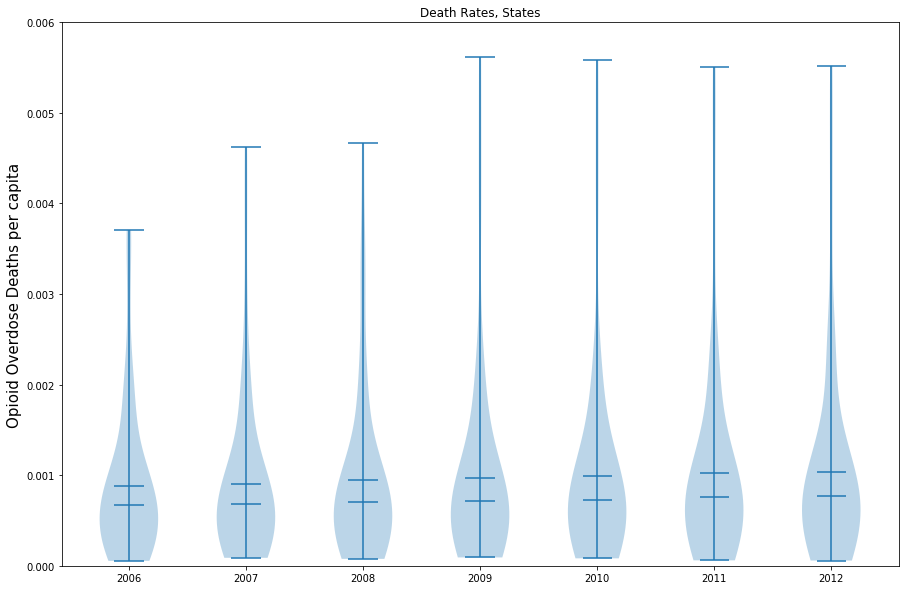

In [433]:
death_rates_states = df_lin.groupby(['state', 'year'])['death_rate'].mean()
death_rates_states = death_rates_states.reset_index()

dr_2006 = death_rates_states[death_rates_states.year == 2006]['death_rate']
dr_2007 = death_rates_states[death_rates_states.year == 2007]['death_rate']
dr_2008 = death_rates_states[death_rates_states.year == 2008]['death_rate']
dr_2009 = death_rates_states[death_rates_states.year == 2009]['death_rate']
dr_2010 = death_rates_states[death_rates_states.year == 2010]['death_rate']
dr_2011 = death_rates_states[death_rates_states.year == 2011]['death_rate']
dr_2012 = death_rates_states[death_rates_states.year == 2012]['death_rate']


data_1 = [dr_2006, dr_2007, dr_2008, dr_2009, dr_2010, dr_2011, dr_2012]
labels = ['2006', '2007', '2008', '2009', '2010', '2011', '2012']
fig2, ax2 = plt.subplots()
ax2.set_title('Death Rates, States')
ax2.violinplot(data_1, showmeans=True, showmedians=True, showextrema=True)
plt.ylabel('Opioid Overdose Deaths per capita', fontsize = 15)
plt.xticks(np.arange(7) + 1, labels)
plt.ylim(0, 0.006)
plt.show()

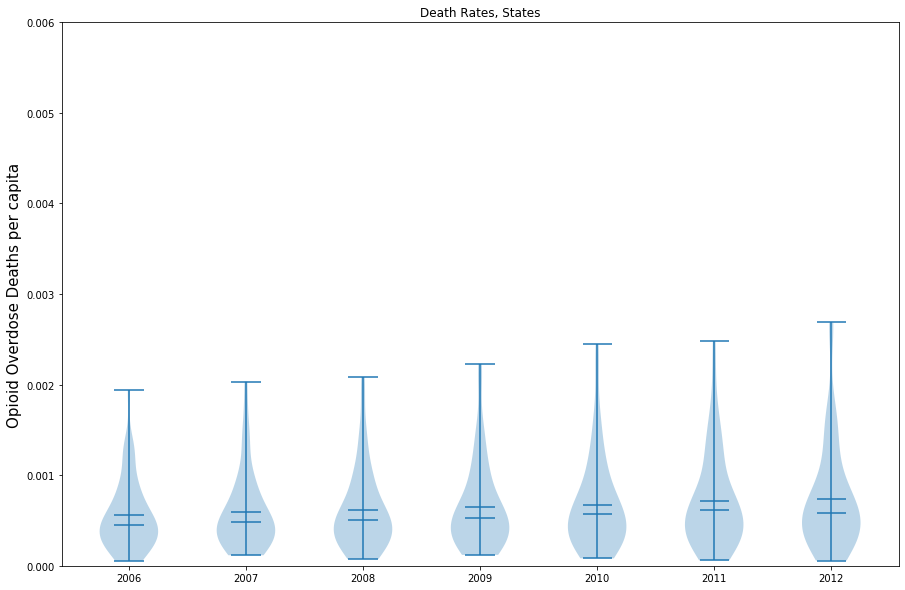

In [434]:
death_rates_states = df.groupby(['state', 'year'])['death_rate'].mean()
death_rates_states = death_rates_states.reset_index()

dr_2006 = death_rates_states[death_rates_states.year == 2006]['death_rate']
dr_2007 = death_rates_states[death_rates_states.year == 2007]['death_rate']
dr_2008 = death_rates_states[death_rates_states.year == 2008]['death_rate']
dr_2009 = death_rates_states[death_rates_states.year == 2009]['death_rate']
dr_2010 = death_rates_states[death_rates_states.year == 2010]['death_rate']
dr_2011 = death_rates_states[death_rates_states.year == 2011]['death_rate']
dr_2012 = death_rates_states[death_rates_states.year == 2012]['death_rate']


data_1 = [dr_2006, dr_2007, dr_2008, dr_2009, dr_2010, dr_2011, dr_2012]
labels = ['2006', '2007', '2008', '2009', '2010', '2011', '2012']
fig2, ax2 = plt.subplots()
ax2.set_title('Death Rates, States')
ax2.violinplot(data_1, showmeans=True, showmedians=True, showextrema=True)
plt.ylabel('Opioid Overdose Deaths per capita', fontsize = 15)
plt.xticks(np.arange(7) + 1, labels)
plt.ylim(0, 0.006)
plt.show()

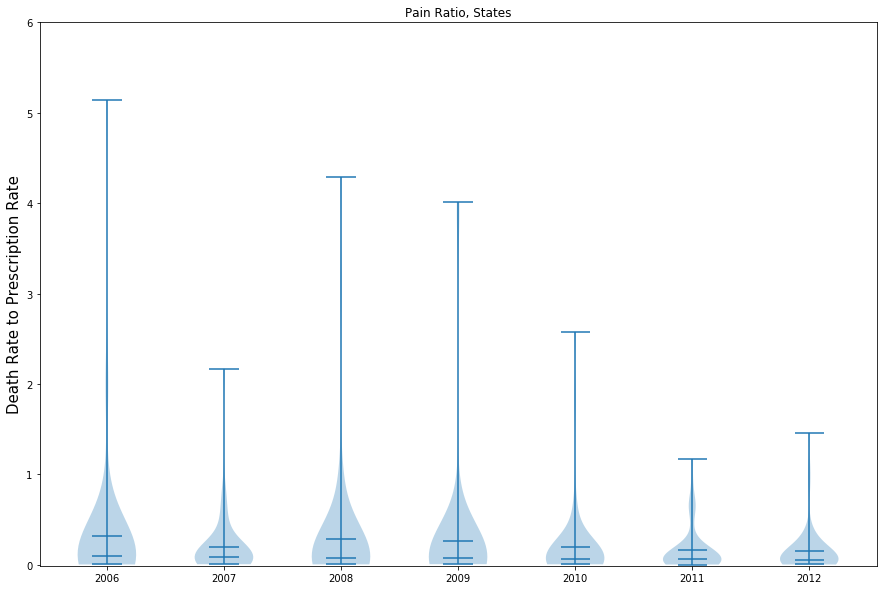

In [435]:
pain_ratio_states = df_lin.groupby(['state', 'year'])['pain_ratio'].mean()
pain_ratio_states = pain_ratio_states.reset_index()

dr_2006 = pain_ratio_states[pain_ratio_states.year == 2006]['pain_ratio']
dr_2007 = pain_ratio_states[pain_ratio_states.year == 2007]['pain_ratio']
dr_2008 = pain_ratio_states[pain_ratio_states.year == 2008]['pain_ratio']
dr_2009 = pain_ratio_states[pain_ratio_states.year == 2009]['pain_ratio']
dr_2010 = pain_ratio_states[pain_ratio_states.year == 2010]['pain_ratio']
dr_2011 = pain_ratio_states[pain_ratio_states.year == 2011]['pain_ratio']
dr_2012 = pain_ratio_states[pain_ratio_states.year == 2012]['pain_ratio']


data_1 = [dr_2006, dr_2007, dr_2008, dr_2009, dr_2010, dr_2011, dr_2012]
labels = ['2006', '2007', '2008', '2009', '2010', '2011', '2012']
fig2, ax2 = plt.subplots()
ax2.set_title('Pain Ratio, States')
ax2.violinplot(data_1, showmeans=True, showmedians=True, showextrema=True)
plt.ylabel('Death Rate to Prescription Rate', fontsize = 15)
plt.xticks(np.arange(7) + 1, labels)
plt.ylim(-0.01, 6)
plt.show()

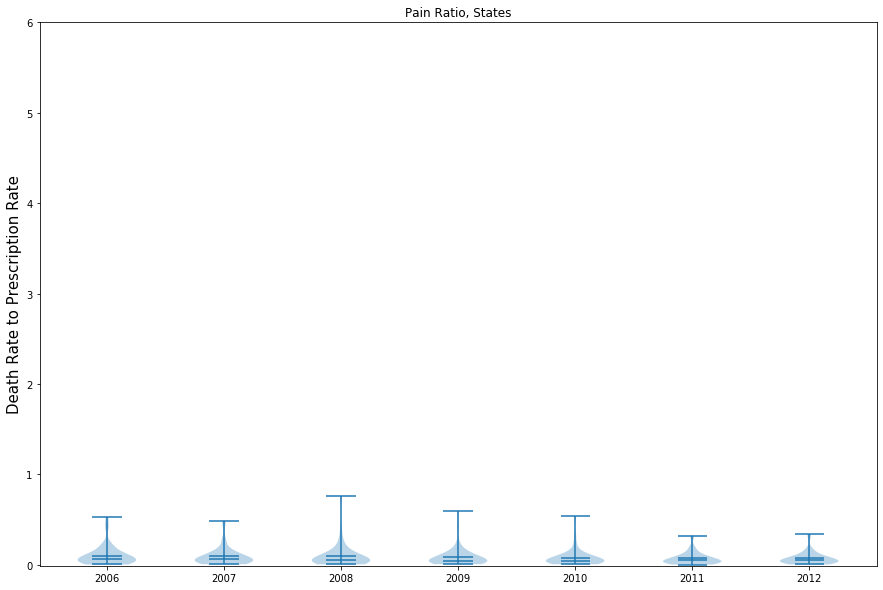

In [436]:
pain_ratio_states = df.groupby(['state', 'year'])['pain_ratio'].mean()
pain_ratio_states = pain_ratio_states.reset_index()

dr_2006 = pain_ratio_states[pain_ratio_states.year == 2006]['pain_ratio']
dr_2007 = pain_ratio_states[pain_ratio_states.year == 2007]['pain_ratio']
dr_2008 = pain_ratio_states[pain_ratio_states.year == 2008]['pain_ratio']
dr_2009 = pain_ratio_states[pain_ratio_states.year == 2009]['pain_ratio']
dr_2010 = pain_ratio_states[pain_ratio_states.year == 2010]['pain_ratio']
dr_2011 = pain_ratio_states[pain_ratio_states.year == 2011]['pain_ratio']
dr_2012 = pain_ratio_states[pain_ratio_states.year == 2012]['pain_ratio']


data_1 = [dr_2006, dr_2007, dr_2008, dr_2009, dr_2010, dr_2011, dr_2012]
labels = ['2006', '2007', '2008', '2009', '2010', '2011', '2012']
fig2, ax2 = plt.subplots()
ax2.set_title('Pain Ratio, States')
ax2.violinplot(data_1, showmeans=True, showmedians=True, showextrema=True)
plt.ylabel('Death Rate to Prescription Rate', fontsize = 15)
plt.xticks(np.arange(7) + 1, labels)
plt.ylim(-0.01, 6)
plt.show()

For both death rate and pain ratio, the spread of values for the Lasso model seem more reasonable, so this is the model we will use going forward.

### Statistical Analysis

In [334]:
lasso_coef = lasso.coef_
lasso_coef = pd.DataFrame(lasso_coef)

In [335]:
lasso_coef

,0
0,0.000069
1,0.000000
2,0.000000
3,0.000000
4,0.000000
...,...
244,0.000000
245,0.000000
246,4.861848
247,0.000000


In [336]:
lasso_df = lasso_coef.loc[~(lasso_coef==0).all(axis=1)]
lasso_df

,0
0,0.000069
58,28.631979
98,49.129684
123,55.492247
169,0.002241
246,4.861848
248,398.303252


In [343]:
df_features = df_drop[features]
df_features.iloc[:, [0, 58, 98, 123, 169, 246, 248]]

,pop,black_male_0_4,islander_male_15_19,native_female_45_49,total_80_84,white_male_85+,prescription_rate
7,149116.0,0.060315,0.000517,0.004393,3934,0.347974,0.012816
8,152939.0,0.060315,0.000517,0.004393,3934,0.347974,0.015523
9,155913.0,0.060315,0.000517,0.004393,3934,0.347974,0.015246
10,158931.0,0.060315,0.000517,0.004393,3934,0.347974,0.017637
11,161405.0,0.060315,0.000517,0.004393,3934,0.347974,0.024460
...,...,...,...,...,...,...,...
17434,72354.0,0.007253,0.000000,0.005457,1563,0.343969,0.011997
17435,72610.0,0.007253,0.000000,0.005457,1563,0.343969,0.015508
17436,73346.0,0.007253,0.000000,0.005457,1563,0.343969,0.016933
17437,75018.0,0.007253,0.000000,0.005457,1563,0.343969,0.017369


In [349]:
linreg_coef = reg.coef_
linreg_df = pd.DataFrame(linreg_coef)
linreg_df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248
0,0.000101,-831.010008,219.252978,-367.342387,-766.528318,622.923689,251.93399,620.258915,-1279.411572,-1413.025396,-732.969933,-1988.614588,-52.342195,-620.915295,66.211996,7.080043,-1214.529239,-28.929338,-1087.34808,4013.751787,339.13007,409.815403,398.114554,-1104.587765,-275.38639,836.21538,-247.991123,367.355385,-325.48778,480.068755,-1700.153046,2550.360128,-820.837678,-599.28015,1897.005738,918.510263,1293.996437,1284.588664,-1077.752546,-1145.890173,-497.399831,-1297.899123,-1406.065371,-144.899011,205.342739,-128.398968,-1099.374983,-2075.935592,-1073.462875,-873.292562,-991.801662,-1103.918107,-693.132063,342.009833,-668.840761,-83.917633,-335.030408,9307.263569,995.175457,159.754744,1055.270913,41.432397,6.457971,1181.480604,978.042055,340.392128,-191.710955,784.417144,-511.408844,1661.594799,369.273007,582.132885,434.714296,513.479322,-129.461396,1419.775412,-6244.689225,-6080.149391,-3700.452999,-3562.429105,-4009.064701,-4889.4402,-5323.703844,-6440.612291,-7581.323803,-1501.754377,-3981.02754,-1074.462115,-9457.750009,-10607.119707,816.308052,-5196.565789,1289.727289,-3765.790817,-5647.515691,76948.483174,7352.586087,1592.359275,6309.937648,1554.433554,1402.571482,4554.421363,-337.026466,2547.172611,2144.511349,-93.383009,3790.858942,6253.279149,2303.207642,1929.019841,1825.596985,4534.301703,-4792.945066,-2263.821767,-46473.190722,-1551.03475,-1147.375343,-1795.576782,-813.095654,-979.537226,-501.329736,-993.939036,-2005.70544,-78.834634,-1871.468339,-2068.680922,191.48186,-2186.02712,634.559995,168.024501,-2255.93005,293.283431,-507.988267,20090.161818,1025.221863,1264.984272,1559.997824,711.416517,1173.477472,1863.417504,2246.904198,-273.781389,638.366225,949.192649,-413.849007,834.855611,1237.688332,623.41502,117.66358,27.212137,12.446872,1742.943546,-18995.253484,0.01183,0.007106,0.011603,0.010037,0.008002,0.012249,0.010805,0.003382,0.011502,0.009163,0.017239,-0.001041,0.015852,0.01944,-0.004886,0.014287,0.014713,0.008286,-0.009888,669.973354,41.850663,989.933831,602.16679,-155.515117,539.908152,493.550991,649.647472,751.019027,725.292192,626.634872,781.422465,821.417872,592.763466,314.567918,510.879556,159.502606,696.544576,-6687.006313,-669.973354,-41.850663,-989.933831,-602.166789,155.51512,-539.908152,-493.550993,-649.647471,-751.019027,-725.292192,-626.63487,-781.422464,-821.417871,-592.763466,-314.567918,-510.879556,-159.502606,-696.544576,6687.006314,-664.47045,-34.072336,-983.560059,-1233.125269,444.437026,264.107778,-298.94122,-1000.54527,-1522.840675,-939.949185,-1438.03718,-658.640818,-1123.095975,-486.929988,221.424368,-688.166626,-50.22761,-204.359102,6935.130814,539.211413,30.109678,816.87742,-124.486735,-155.959248,1102.217274,736.414768,354.804209,0.216605,504.098566,-249.46156,854.923214,492.77706,659.562242,673.448628,251.340842,216.521123,1179.588547,-4607.928564,352.7692


In [350]:
linreg_df = linreg_df.T
linreg_df

,0
0,0.000101
1,-831.010008
2,219.252978
3,-367.342387
4,-766.528318
...,...
244,251.340842
245,216.521123
246,1179.588547
247,-4607.928564


In [363]:
linreg_df = linreg_df.rename(columns={0:'coef'})
linreg_df.sort_values('coef', ascending=False).head(10)

,coef
95,76948.483174
133,20090.161818
57,9307.263569
96,7352.586087
228,6935.130814
209,6687.006314
98,6309.937648
107,6253.279149
101,4554.421363
111,4534.301703


In [365]:
df_features.iloc[:, [95, 133, 57, 96, 228, 209, 98, 107, 101, 111]].head(1)

,islander_female_total,native_female_total,black_female_total,islander_male_0_4,white_female_total,total_male_pop_county,islander_male_15_19,islander_male_55_59,islander_male_30_34,islander_male_75_79
7,0.000269,0.003714,0.048709,0.000448,0.446471,0.489375,0.000517,0.00008,0.000747,0.000179


In [367]:
df_features.iloc[:, 98].head(1)

7    0.000517
Name: islander_male_15_19, dtype: float64

### More Visualizations

### Bar Graphs

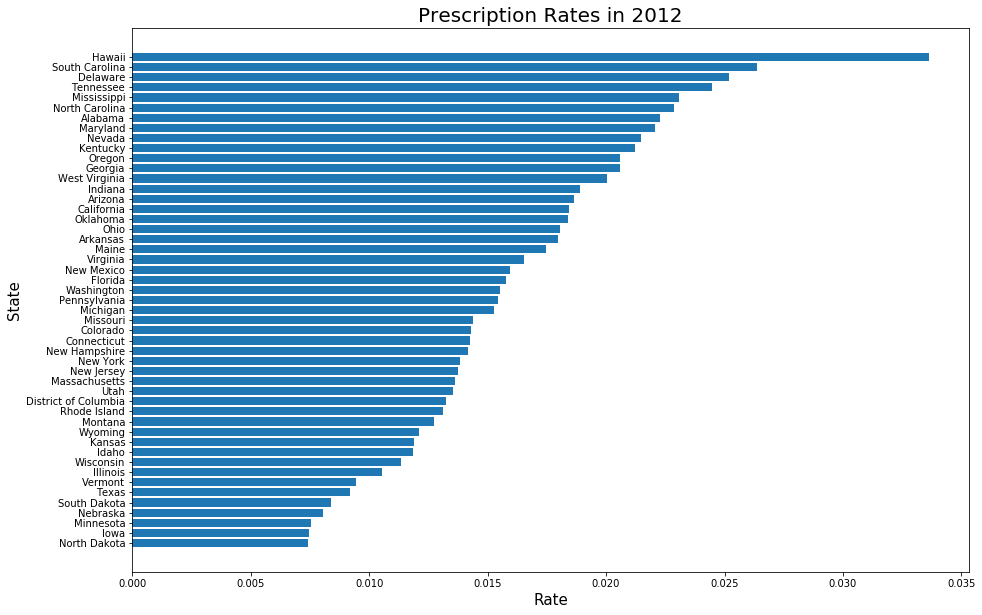

In [300]:
# first select data for year 2012
# sort values for prescription rate and create bar plot
pr_2012 = df.loc[df.year == 2012].sort_values('prescription_rate', ascending=True)
pr_2012 = pr_2012.groupby('state')['prescription_rate'].mean()
pr_2012 = pr_2012.sort_values(ascending=True)
plt.barh(y = pr_2012.index, width = pr_2012.values)
plt.xlabel('Rate', fontsize=15)
plt.ylabel('State', fontsize=15)
plt.title('Prescription Rates in 2012', fontsize=20)
plt.rcParams['figure.figsize'] = [25, 30]
plt.show()

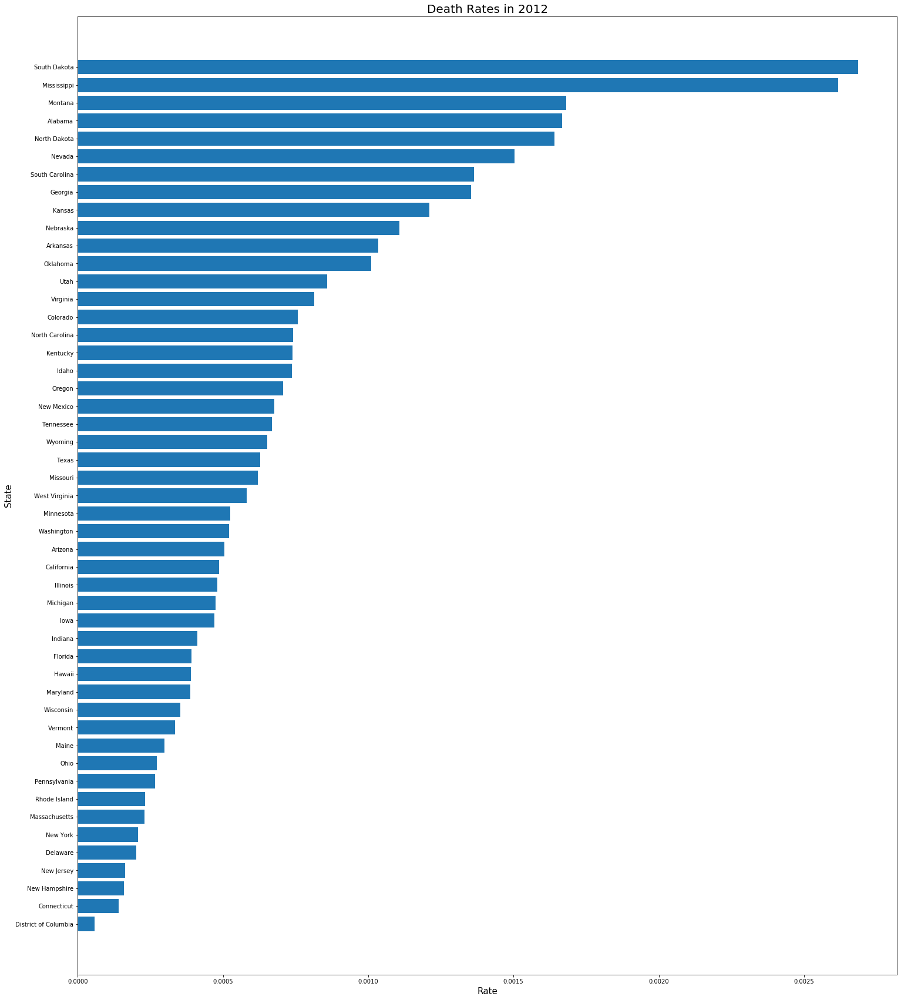

In [301]:
# now for death rate
dr_2012 = df.loc[df.year == 2012].sort_values('death_rate', ascending=True)
dr_2012 = dr_2012.groupby('state')['death_rate'].mean()
dr_2012 = dr_2012.sort_values(ascending=True)
plt.barh(y = dr_2012.index, width = dr_2012.values)
plt.xlabel('Rate', fontsize=15)
plt.ylabel('State', fontsize=15)
plt.title('Death Rates in 2012', fontsize=20)
plt.rcParams['figure.figsize'] = [25, 30]
plt.show()

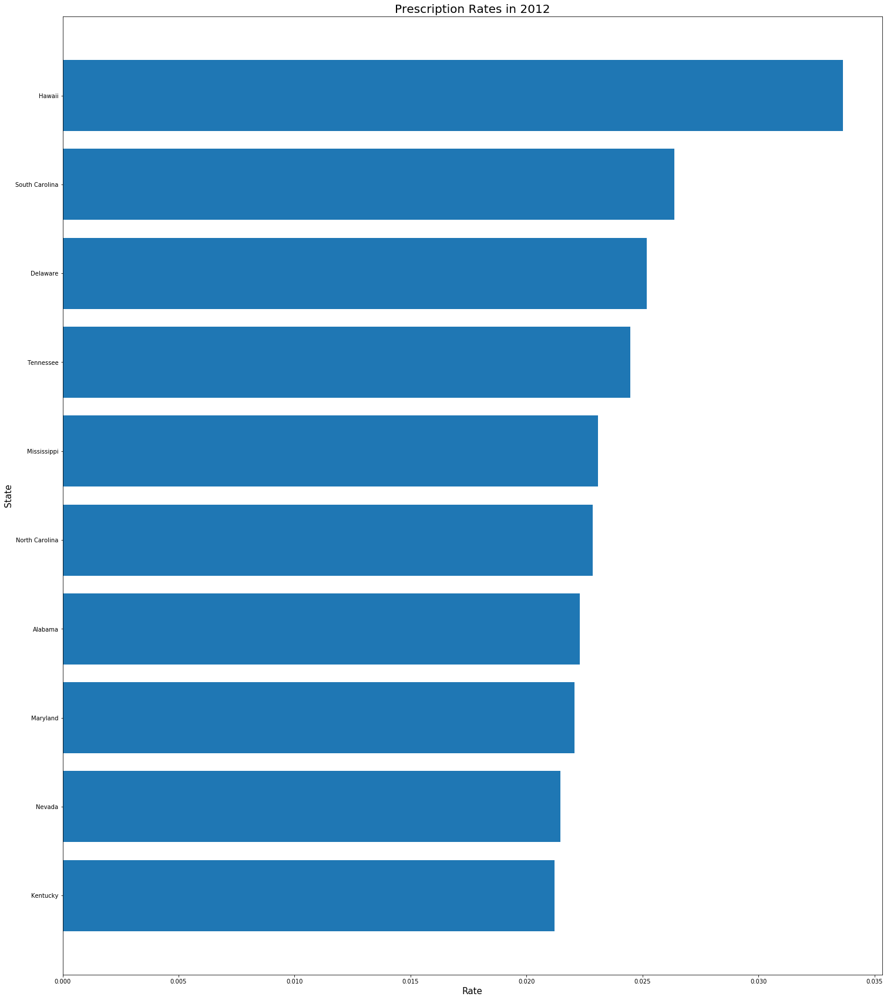

In [302]:
# these graphs are large and difficult to read - let's just look at the top ten states
pr_head = pr_2012[-10:]
plt.barh(y = pr_head.index, width = pr_head.values)
plt.xlabel('Rate', fontsize=15)
plt.ylabel('State', fontsize=15)
plt.title('Prescription Rates in 2012', fontsize=20)
plt.rcParams['figure.figsize'] = [10, 5]
plt.show()

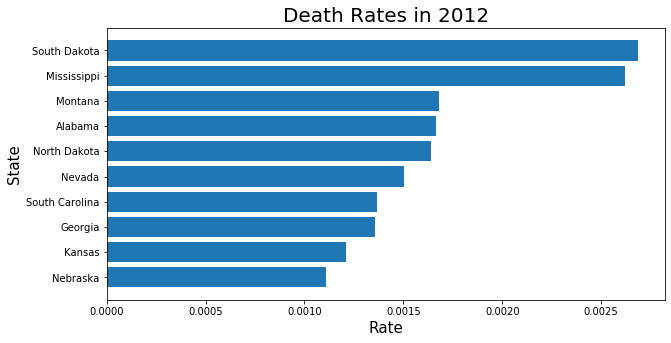

In [303]:
#same for death rate
dr_head = dr_2012[-10:]
plt.barh(y = dr_head.index, width = dr_head.values)
plt.xlabel('Rate', fontsize=15)
plt.ylabel('State', fontsize=15)
plt.title('Death Rates in 2012', fontsize=20)
plt.rcParams['figure.figsize'] = [10, 5]
plt.show()

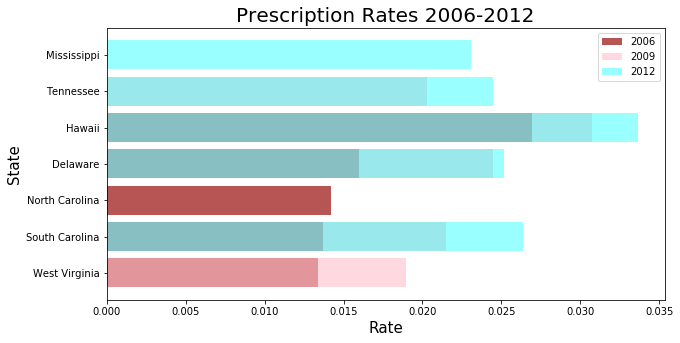

In [304]:
#let's try stacked bar graphs to show multiple years
#create variables to hold values for different years - 2006, 2009, 2012
pr_06 = df.loc[df.year == 2006].sort_values('prescription_rate', ascending=True)
pr_06 = pr_06.groupby('state')['prescription_rate'].mean()
pr_06 = pr_06.sort_values(ascending=True)
pr_06 = pr_06[-5:]

pr_09 = df.loc[df.year == 2009].sort_values('prescription_rate', ascending=True)
pr_09 = pr_09.groupby('state')['prescription_rate'].mean()
pr_09 = pr_09.sort_values(ascending=True)
pr_09 = pr_09[-5:]

pr_12 = df.loc[df.year == 2012].sort_values('prescription_rate', ascending=True)
pr_12 = pr_12.groupby('state')['prescription_rate'].mean()
pr_12 = pr_12.sort_values(ascending=True)
pr_12 = pr_12[-5:]


#then create plots for each year
p1 = plt.barh(y = pr_06.index, width = pr_06.values, alpha = 0.8, color = 'brown')
p2 = plt.barh(y = pr_09.index, width = pr_09.values, alpha = 0.6, color = 'pink')
p3 = plt.barh(y = pr_12.index, width = pr_12.values, alpha = 0.4, color = 'cyan')
plt.xlabel('Rate', fontsize=15)
plt.ylabel('State', fontsize=15)
plt.title('Prescription Rates 2006-2012', fontsize=20)
plt.legend((p1[0], p2[0], p3[0]), ('2006', '2009', '2012'))
plt.rcParams['figure.figsize'] = [15, 10]
plt.show()

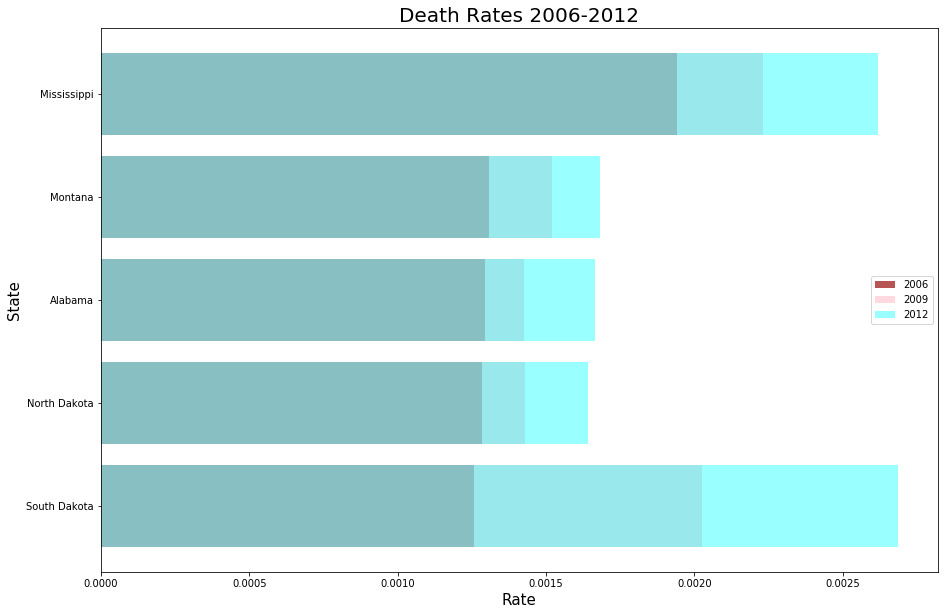

In [305]:
# same process for od rate
dr_06 = df.loc[df.year == 2006].sort_values('death_rate', ascending=True)
dr_06 = dr_06.groupby('state')['death_rate'].mean()
dr_06 = dr_06.sort_values(ascending=True)
dr_06 = dr_06[-5:]

dr_09 = df.loc[df.year == 2009].sort_values('death_rate', ascending=True)
dr_09 = dr_09.groupby('state')['death_rate'].mean()
dr_09 = dr_09.sort_values(ascending=True)
dr_09 = dr_09[-5:]

dr_12 = df.loc[df.year == 2012].sort_values('death_rate', ascending=True)
dr_12 = dr_12.groupby('state')['death_rate'].mean()
dr_12 = dr_12.sort_values(ascending=True)
dr_12 = dr_12[-5:]


p1 = plt.barh(y = dr_06.index, width = dr_06.values, alpha = 0.8, color = 'brown')
p2 = plt.barh(y = dr_09.index, width = dr_09.values, alpha = 0.6, color = 'pink')
p3 = plt.barh(y = dr_12.index, width = dr_12.values, alpha = 0.4, color = 'cyan')
plt.xlabel('Rate', fontsize=15)
plt.ylabel('State', fontsize=15)
plt.title('Death Rates 2006-2012', fontsize=20)
plt.legend((p1[0], p2[0], p3[0]), ('2006', '2009', '2012'))
plt.rcParams['figure.figsize'] = [15, 10]
plt.show()

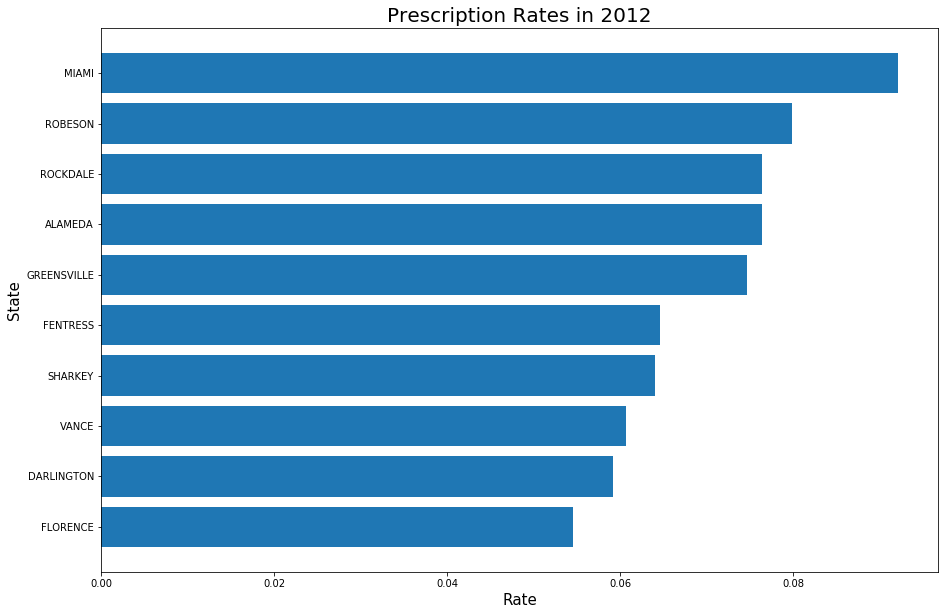

In [306]:
# top 10 counties for prescription rate
pr_2012 = df.loc[df.year == 2012].sort_values('prescription_rate', ascending=True)
pr_2012 = pr_2012.groupby('county')['prescription_rate'].mean()
pr_2012 = pr_2012.sort_values(ascending=True)
pr_head = pr_2012[-10:]
plt.barh(y = pr_head.index, width = pr_head.values)
plt.xlabel('Rate', fontsize=15)
plt.ylabel('State', fontsize=15)
plt.title('Prescription Rates in 2012', fontsize=20)
plt.rcParams['figure.figsize'] = [15, 10]
plt.show()

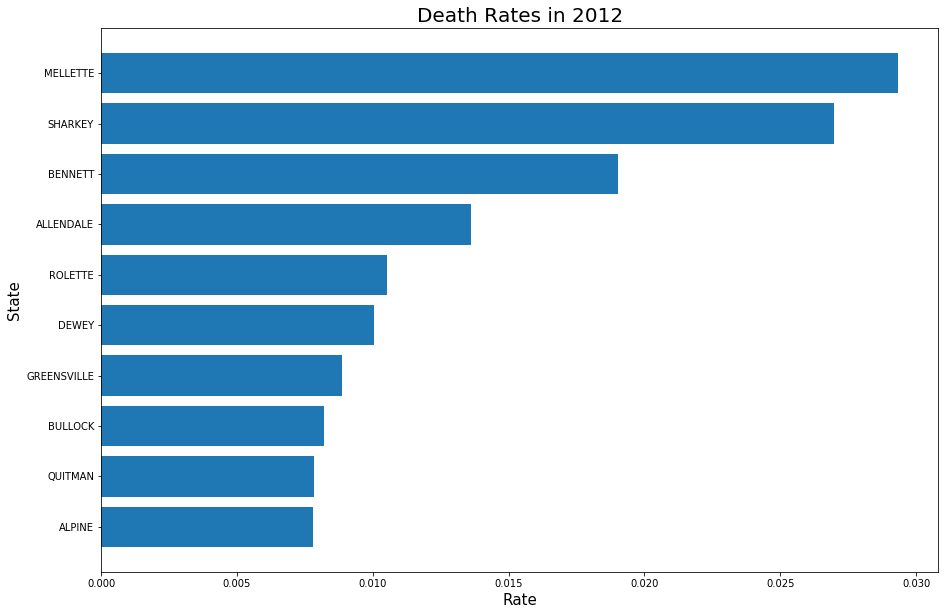

In [307]:
dr_12 = df.loc[df.year == 2012].sort_values('death_rate', ascending=True)
dr_12 = dr_12.groupby('county')['death_rate'].mean()
dr_12 = dr_12.sort_values(ascending=True)
dr_head = dr_12[-10:]

plt.barh(y = dr_head.index, width = dr_head.values)
plt.xlabel('Rate', fontsize=15)
plt.ylabel('State', fontsize=15)
plt.title('Death Rates in 2012', fontsize=20)
plt.rcParams['figure.figsize'] = [15, 10]
plt.show()

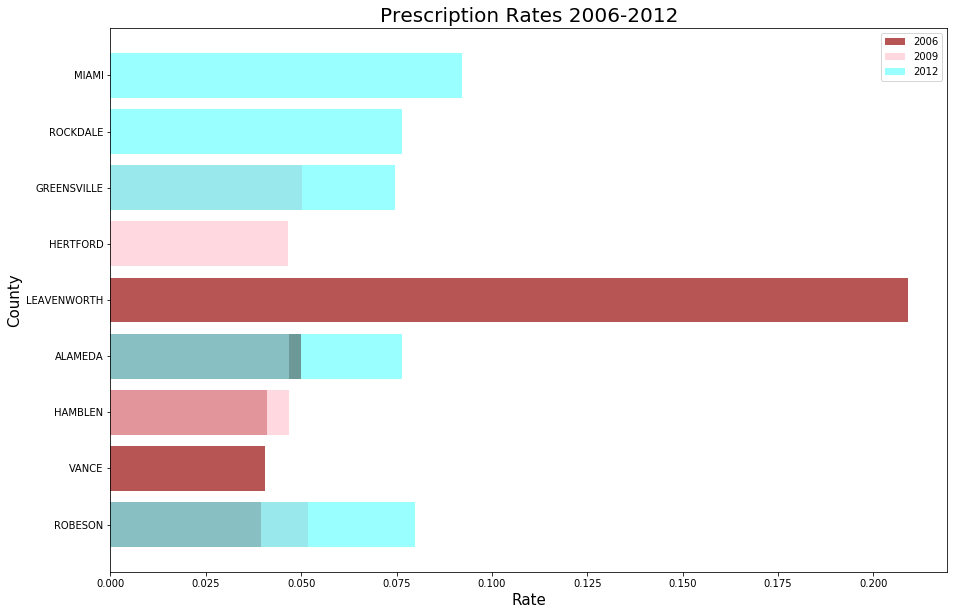

In [308]:
pr_06 = df.loc[df.year == 2006].sort_values('prescription_rate', ascending=True)
pr_06 = pr_06.groupby('county')['prescription_rate'].mean()
pr_06 = pr_06.sort_values(ascending=True)
pr_06 = pr_06[-5:]

pr_09 = df.loc[df.year == 2009].sort_values('prescription_rate', ascending=True)
pr_09 = pr_09.groupby('county')['prescription_rate'].mean()
pr_09 = pr_09.sort_values(ascending=True)
pr_09 = pr_09[-5:]

pr_12 = df.loc[df.year == 2012].sort_values('prescription_rate', ascending=True)
pr_12 = pr_12.groupby('county')['prescription_rate'].mean()
pr_12 = pr_12.sort_values(ascending=True)
pr_12 = pr_12[-5:]


p1 = plt.barh(y = pr_06.index, width = pr_06.values, alpha = 0.8, color = 'brown')
p2 = plt.barh(y = pr_09.index, width = pr_09.values, alpha = 0.6, color = 'pink')
p3 = plt.barh(y = pr_12.index, width = pr_12.values, alpha = 0.4, color = 'cyan')
plt.xlabel('Rate', fontsize=15)
plt.ylabel('County', fontsize=15)
plt.title('Prescription Rates 2006-2012', fontsize=20)
plt.legend((p1[0], p2[0], p3[0]), ('2006', '2009', '2012'))
plt.rcParams['figure.figsize'] = [15, 10]
plt.show()

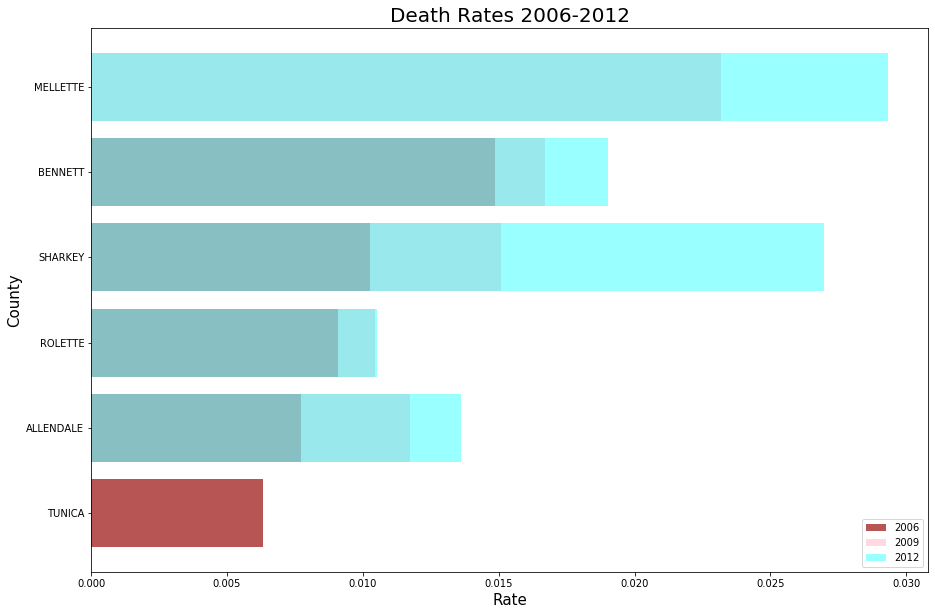

In [309]:
# same process for od rate
dr_06 = df.loc[df.year == 2006].sort_values('death_rate', ascending=True)
dr_06 = dr_06.groupby('county')['death_rate'].mean()
dr_06 = dr_06.sort_values(ascending=True)
dr_06 = dr_06[-5:]

dr_09 = df.loc[df.year == 2009].sort_values('death_rate', ascending=True)
dr_09 = dr_09.groupby('county')['death_rate'].mean()
dr_09 = dr_09.sort_values(ascending=True)
dr_09 = dr_09[-5:]

dr_12 = df.loc[df.year == 2012].sort_values('death_rate', ascending=True)
dr_12 = dr_12.groupby('county')['death_rate'].mean()
dr_12 = dr_12.sort_values(ascending=True)
dr_12 = dr_12[-5:]


p1 = plt.barh(y = dr_06.index, width = dr_06.values, alpha = 0.8, color = 'brown')
p2 = plt.barh(y = dr_09.index, width = dr_09.values, alpha = 0.6, color = 'pink')
p3 = plt.barh(y = dr_12.index, width = dr_12.values, alpha = 0.4, color = 'cyan')


plt.xlabel('Rate', fontsize=15)
plt.ylabel('County', fontsize=15)
plt.title('Death Rates 2006-2012', fontsize=20)
plt.legend((p1[0], p2[0], p3[0]), ('2006', '2009', '2012'))
plt.rcParams['figure.figsize'] = [15, 10]
plt.show()

### Line Graphs

In [450]:
# first create prescription rate average, then overdose rate average
pr_avg = df.groupby('year')['prescription_rate'].mean()
pr_avg

year
2006    0.009140
2007    0.010355
2008    0.011316
2009    0.012457
2010    0.013863
2011    0.015377
2012    0.015577
Name: prescription_rate, dtype: float64

In [451]:
dr_avg = df.groupby('year')['death_rate'].mean()
dr_avg

year
2006    0.000623
2007    0.000654
2008    0.000680
2009    0.000715
2010    0.000757
2011    0.000801
2012    0.000821
Name: death_rate, dtype: float64

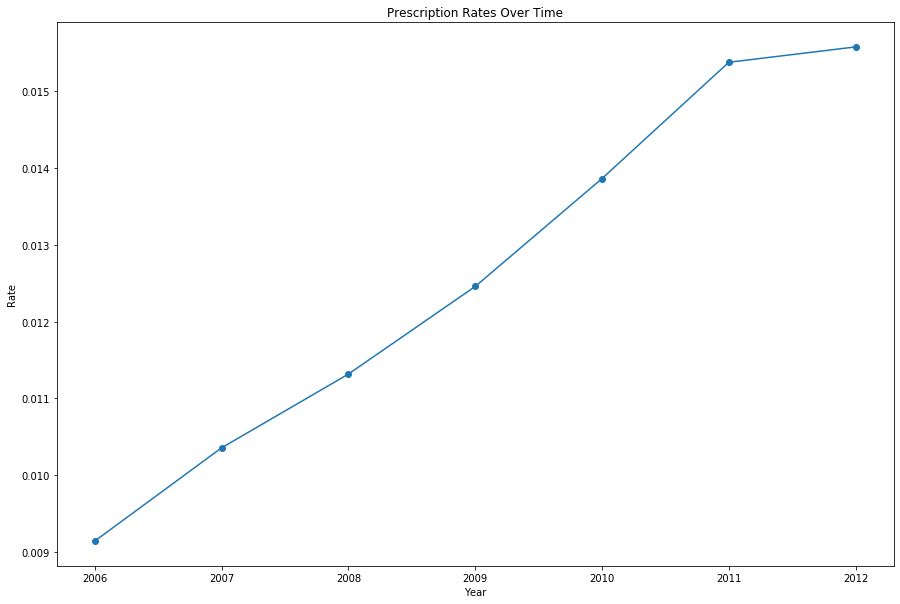

In [312]:
# plot of prescription rates over time
plt.plot(pr_avg.index, pr_avg, marker = 'o')
plt.xlabel('Year')
plt.ylabel('Rate')
plt.title('Prescription Rates Over Time')
plt.rcParams['figure.figsize'] = [10, 5]
plt.show()

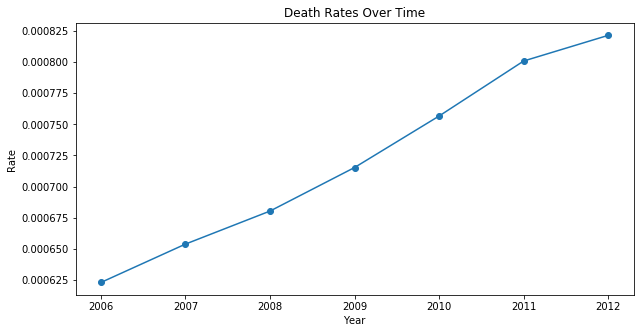

In [313]:
# death rates over time
plt.plot(dr_avg.index, dr_avg, marker = 'o')
plt.xlabel('Year')
plt.ylabel('Rate')
plt.title('Death Rates Over Time')
plt.rcParams['figure.figsize'] = [10, 5]
plt.show()

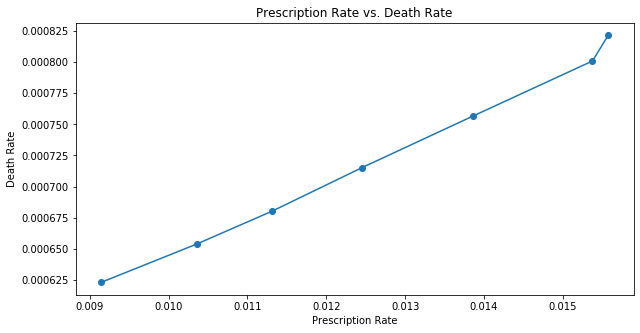

In [453]:
# death rate vs prescription rate
plt.plot(pr_avg, dr_avg, marker = 'o')
plt.xlabel('Prescription Rate')
plt.ylabel('Death Rate')
plt.title('Prescription Rate vs. Death Rate')
plt.rcParams['figure.figsize'] = [10, 5]
plt.show()

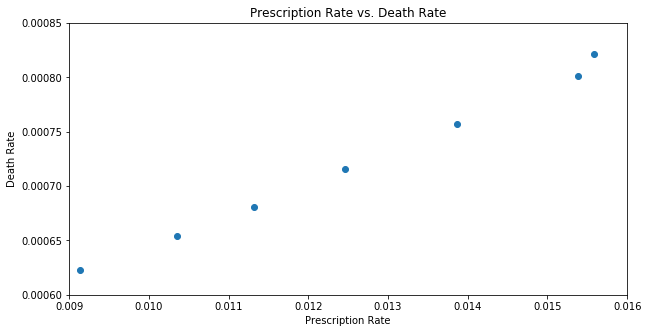

In [464]:
# same data as scatter plot
# we have here a correlation, not a trend - therefore, scatter plot is more appropriate
plt.scatter(pr_avg, dr_avg)
plt.xlabel('Prescription Rate')
plt.ylabel('Death Rate')
plt.title('Prescription Rate vs. Death Rate')
plt.ylim(0.0006, 0.00085)
plt.xlim(0.009, 0.016)
plt.rcParams['figure.figsize'] = [10, 5]
plt.show()

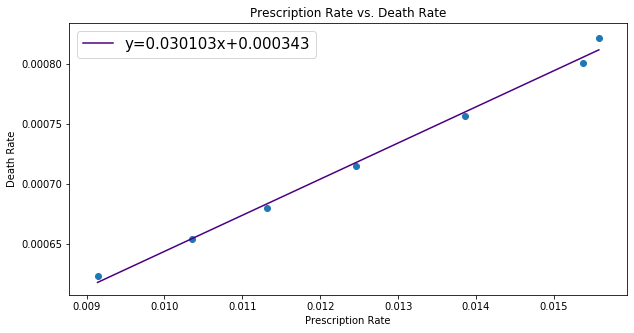

In [466]:
from scipy import stats
#now add a fit line
m, b, r_value, p_value, std_err = stats.linregress(pr_avg,dr_avg)
y = m*pr_avg+b
plt.plot(pr_avg, y, 'indigo', label='y={:.6f}x+{:.6f}'.format(m,b))
plt.scatter(pr_avg, dr_avg)
plt.xlabel('Prescription Rate')
plt.ylabel('Death Rate')
plt.title('Prescription Rate vs. Death Rate')
plt.legend(fontsize=15)
plt.rcParams['figure.figsize'] = [10, 5]
plt.show()

In [317]:
pain_avg = df.groupby('year')['pain_ratio'].mean()
pain_avg

year
2006    0.120883
2007    0.109626
2008    0.105487
2009    0.098915
2010    0.089796
2011    0.084867
2012    0.084712
Name: pain_ratio, dtype: float64

In [318]:
pain_df = pd.concat([dr_avg, pr_avg, pain_avg], axis=1)
pain_df

,death_rate,prescription_rate,pain_ratio
year,,,
2006,0.000623,0.009140,0.120883
2007,0.000654,0.010355,0.109626
2008,0.000680,0.011316,0.105487
2009,0.000715,0.012457,0.098915
2010,0.000757,0.013863,0.089796
2011,0.000801,0.015377,0.084867
2012,0.000821,0.015577,0.084712


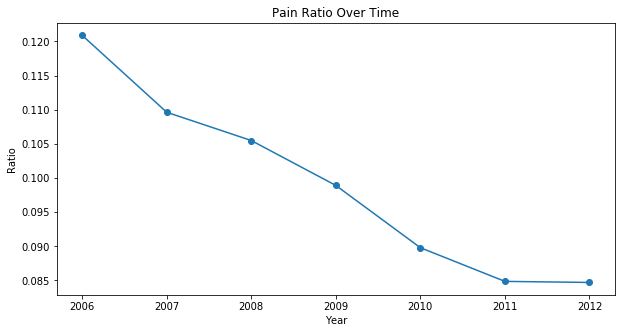

In [319]:
# graph pain ratio over time
plt.plot(pain_df.index, pain_df['pain_ratio'], marker = 'o')
plt.xlabel('Year')
plt.ylabel('Ratio')
plt.title('Pain Ratio Over Time')
plt.rcParams['figure.figsize'] = [10, 5]
plt.show()

In [320]:
#Now create graphs with top states
#First, find what the top states are
pain_states = df.groupby('state')['pain_ratio'].mean()
pain_head_states = pain_states.sort_values(ascending=False).head(5)
pain_head_states

state
North Dakota    0.486577
South Dakota    0.394983
Montana         0.267492
Nebraska        0.210728
Kansas          0.163239
Name: pain_ratio, dtype: float64

In [322]:
pr_states = df.groupby(['state', 'year'])['pain_ratio'].mean()
pr_states

state    year
Alabama  2006    0.203962
         2007    0.169780
         2008    0.158419
         2009    0.126117
         2010    0.118780
                   ...   
Wyoming  2008    0.073164
         2009    0.073179
         2010    0.070027
         2011    0.070900
         2012    0.073203
Name: pain_ratio, Length: 343, dtype: float64

In [323]:
pr_states = pr_states.reset_index()
pr_states

,state,year,pain_ratio
0,Alabama,2006,0.203962
1,Alabama,2007,0.169780
2,Alabama,2008,0.158419
3,Alabama,2009,0.126117
4,Alabama,2010,0.118780
...,...,...,...
338,Wyoming,2008,0.073164
339,Wyoming,2009,0.073179
340,Wyoming,2010,0.070027
341,Wyoming,2011,0.070900


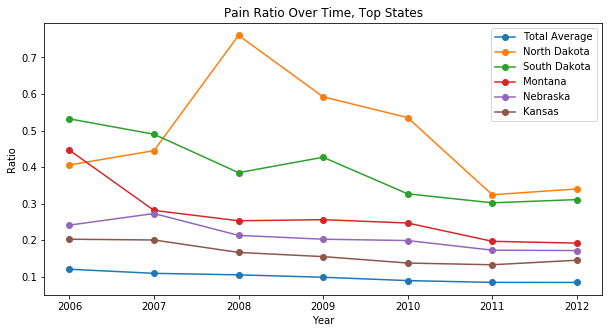

In [324]:
# create variables for each state
pr_nd = pr_states[pr_states.state == 'North Dakota']
pr_sd = pr_states[pr_states.state == 'South Dakota']
pr_mt = pr_states[pr_states.state == 'Montana']
pr_ne = pr_states[pr_states.state == 'Nebraska']
pr_ks = pr_states[pr_states.state == 'Kansas']

# now graph all together
# graph pain ratio over time
p1 = plt.plot(pain_df.index, pain_df['pain_ratio'], marker = 'o')
p2 = plt.plot(pr_nd.year, pr_nd.pain_ratio, marker = 'o')
p3 = plt.plot(pr_sd.year, pr_sd.pain_ratio, marker = 'o')
p4 = plt.plot(pr_mt.year, pr_mt.pain_ratio, marker = 'o')
p5 = plt.plot(pr_ne.year, pr_ne.pain_ratio, marker = 'o')
p6 = plt.plot(pr_ks.year, pr_ks.pain_ratio, marker = 'o')
plt.xlabel('Year')
plt.ylabel('Ratio')
plt.title('Pain Ratio Over Time, Top States')
plt.legend((p1[0], p2[0], p3[0], p4[0], p5[0], p6[0]), 
           ('Total Average', 'North Dakota', 'South Dakota', 'Montana', 'Nebraska', 'Kansas'))
plt.rcParams['figure.figsize'] = [15, 10]
plt.show()


### Heatmap of States

In [326]:
# Let's try to create a heatmap of values for states over a geographical map of states
# first, we'll need to convert state names back into state codes
#r everse the state dict using a comprehension
new_dict = {k : v for v, k in state_dict.items()}

#create new dataframe to avoid altering original dataframe
df_new = df

#use .map to reset state names to codes
df_new['state'] = df_new.state.map(new_dict)

# create variables to hold averages
pr_avg = df_new.groupby('state')['prescription_rate'].mean()
dr_avg = df_new.groupby('state')['death_rate'].mean()
pain_avg = df_new.groupby('state')['pain_ratio'].mean()

In [327]:
import plotly.graph_objects as go

#create heatmaps using plotly.graph_objects
fig = go.Figure(data=go.Choropleth(
    locations=pr_avg.index, # Spatial coordinates
    z = pr_avg.values.astype(float), # Data to be color-coded
    locationmode = 'USA-states', # set of locations match entries in `locations`
    colorscale = 'Blues',
    colorbar_title = "Pills Per Capita",
))

fig.update_layout(
    title_text = 'Average Prescription Rate 2006-2012',
    geo_scope='usa', # limite map scope to USA
)

fig.show()

In [328]:
fig = go.Figure(data=go.Choropleth(
    locations=dr_avg.index, # Spatial coordinates
    z = dr_avg.values.astype(float), # Data to be color-coded
    locationmode = 'USA-states', # set of locations match entries in `locations`
    colorscale = 'Reds',
    colorbar_title = "Opioid Overdose Deaths per Capita",
))

fig.update_layout(
    title_text = 'Average Overdose Rate 2006-2012',
    geo_scope='usa', # limite map scope to USA
)

fig.show()

In [329]:
fig = go.Figure(data=go.Choropleth(
    locations=pain_avg.index, # Spatial coordinates
    z = pain_avg.values.astype(float), # Data to be color-coded
    locationmode = 'USA-states', # set of locations match entries in `locations`
    colorscale = 'Purples',
    colorbar_title = "Death Rate Rate to Prescription Rate",
))

fig.update_layout(
    title_text = 'Average Pain Ratio 2006-2012',
    geo_scope='usa', # limite map scope to USA
)

fig.show()